<div class="alert alert-block alert-warning">
<b>REQUIREMENT:</b> Before proceeding, install or update your
<b><a class="divlink" href="https://stenv.readthedocs.io/en/latest">stenv</a></b> distribution.  <b>stenv</b> is the replacement for AstroConda, which is unsupported as of February 2023.
</div>

<a id="titleFindsat"></a>
# Satellite trail detection in ACS/WFC data using acstools.findsat_mrt

This notebook provides examples of how to find and create masks for satellite trails in ACS/WFC imaging data using <a href= 'https://acstools.readthedocs.io/en/latest/findsat_mrt.html'>acstools.findsat_mrt</a>, which is based on the method described in <a href="https://www.stsci.edu/files/live/sites/www/files/home/hst/instrumentation/acs/documentation/instrument-science-reports-isrs/_documents/isr2208.pdf">ACS ISR 2022-08</a>. Many of the tools presented here should be applicable to any imaging data. 

### Table of Contents:

[Introduction](#intro_ID) <br>
[Imports, Setup, and Data](#imports) <br>

[Example 1: Step-by-step guide to find trails in an FLC image](#example1) <br>
[Example 2: Quick run on an FLC image](#example2)<br>
[Example 3: Find trails in an FLC image using the WFC wrapper](#example3) <br>
[Example 4: Step-by-step guide to find trails in a DRC image](#example4) <br>
[Example 5: Find trails in a DRC image using the WFC wrapper](#example5)<br>
[Example 6: Create a new kernel for detection](#example6)<br>

### About this Notebook
**Author:** David V. Stark, ACS Instrument Team, Space Telescope Science Institute <br>
**First Published On:** 5/13/2023 <br>
**Updated On:** 5/15/2023

<a id="intro_ID"></a>
## Introduction

Despite being in orbit, HST imaging data still suffers from contamination by artificial satellites that can compromise science data unless they are identified and masked. This notebook presents examples of how to identify satellite trails in ACS/WFC data. The routine is also effective at identifying other linear features duch as <a href="https://hst-docs.stsci.edu/acsdhb/files/60243156/60243162/1/1567011208101/acs_Ch46.2.jpg">diffraction spikes</a> and <a href="https://hst-docs.stsci.edu/acsdhb/files/60243156/60243160/1/1567011424969/acs_Ch46.4.jpg">glint</a> (see <a href="https://hst-docs.stsci.edu/acsdhb/chapter-4-acs-data-processing-considerations/4-5-image-anomalies">Section 4.5 of the ACS DHB</a> for further discussion on these artifacts). 

A full description of the algorithm is provided in <a href="https://www.stsci.edu/files/live/sites/www/files/home/hst/instrumentation/acs/documentation/instrument-science-reports-isrs/_documents/isr2208.pdf">ACS ISR 2022-08</a>. To briefly summarize, the Median Radon Transform (MRT) is calculated for an input image and used to identify linear signals in the data. The MRT is similar to the standard <a href="https://en.wikipedia.org/wiki/Radon_transform">Radon Transform</a> except that it calculates the median, rather than the sum, of data along all possible paths through an image. This modification makes the algorithm more robust against false signals from localized sources (e.g., stars, galaxies) but still very sensitive to persistent linear features, even well-below the background noise level. 

Additional post-processing is done to filter out spurious detections, primarily eliminating them based on trail S/N, width, and persistence across the image. These parameters, especially the maximum allowed trail width, are tuned for ACS/WFC data binned 2x2 and may be different for images from other instruments. Once the final set of trails is identified and characterized, a mask can be created. The routine provides numerous ways of visualizing the results, as will be demonstrated below.

The following examples illustrate how to use `acstools.findsat_mrt` to identify satellite trails and then create masks for them. Examples 1 and 4 go through the analysis step by step, including how to preprocess data and run individual routines inside `findsat_mrt`. Examples 2, 3, and 5 demonstrate how to automate many of these steps. Our demonstrations stop at the creation of the masks. We leave it to the user to decide the best way to apply the masks to their own analysis.

<a id="imports"></a>
## Imports, setup, and data

It is recommended that you use the latest <a href="https://github.com/spacetelescope/stenv">stenv</a> python environment when using this notebook. In particular, you <b>must</b> use acstools v3.6.0 or greater in order to run this notebook. You can check you version with

`conda list acstools`

and update if necessary with

`conda update acstools`

Set your working directory and import the needed packages with the following

In [1]:
# Import modules and setup
import matplotlib.pyplot as plt
import numpy as np
from astroquery.mast import Observations
from astropy.io import fits
from astropy.nddata import bitmask, block_reduce, block_replicate
from acstools.findsat_mrt import TrailFinder, WfcWrapper
import os 
from acstools.utils_findsat_mrt import create_mrt_line_kernel
import shutil

In [2]:
# Check your own working directory
print('Current working directory is {}'.format(os.getcwd()))
# Define working directory if needed
# os.chdir('Insert your working directory here')

Current working directory is /home/runner/work/hst_notebooks/hst_notebooks/notebooks/ACS/acs_findsat_mrt


In [3]:
# These are optional configurations
%matplotlib inline
plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams['font.serif'] = "Georgia"
plt.rcParams['font.family'] = "serif"

Download the example data needed and place it in the working directory that you defined above. Examples 1-3 use  <a href="https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:HST/product/jc8m32j5q_flc.fits">jc8m32j5q_flc.fits</a>, while examples 4-5 use <a href="https://mast.stsci.edu/api/v0.1/Download/file?uri=mast:HST/product/hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits">hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits</a>.

In [4]:
# Download data files
obs_table = Observations.query_criteria(proposal_id=13498, obs_id='JC8M32010')

dl_table = Observations.download_products(obs_table['obsid'], 
                                          dataURI=['mast:HST/product/hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits',
                                                   'mast:HST/product/jc8m32j5q_flc.fits'])
for row in dl_table:
    oldfname = row['Local Path']
    newfname = os.path.basename(oldfname)
    os.rename(oldfname, newfname)
    
shutil.rmtree('mastDownload')

 [Done]


 [Done]


<a id="example1"></a>

## Example 1: Finding trails in an FLC image

FLC images are individual exposures processed by the CALACS pipeline. The data contain two chips, but we only analyze one here. 

We start by reading in an image and doing some pre-processing to remove bad pixels, subtract a median background, and make the image a bit smaller (to speed up the calculation of the MRT).

In [5]:
# Read in the image files and header information
image_file = 'jc8m32j5q_flc.fits'
ext = 4  # ACS image data are in extensions 1 or 4, we'll just use 4 for now (chip 1)
with fits.open(image_file) as h:
    image = h[ext].data  # image data
    dq = h[ext+2].data  # data quality bitmasks

    header = h[0].header  # primary header
    image_header = h[1].header  # image header

Below, we make a mask for bad pixels. We're ignoring cosmic rays here because routines to make them often partially (but not fully) mask trails. By default, any masked pixels are set to `NaN`. 

In [6]:
mask = bitmask.bitfield_to_boolean_mask(dq, ignore_flags=[4096, 8192, 16384])
image[mask] = np.nan

Below we subtract Subtract the background from the image. Here we just do a simple median.

In [7]:
image = image - np.nanmedian(image)

The MRT is computationally demanding and WFC images are big. To help things a bit, let's rebin the images.

In [8]:
binsize = 2  # adjust this as needed
image_rebin = block_reduce(image, binsize, func=np.nansum)

We now set up `TrailFinder`. Many of the parameters in the call below are optional (and set to their current values by default) but we show them to illustrate the setup. Of note is that I'm explicitly defining the image header keys to save. These can be useful later when analyzing trail population properties. The keywords being saved here were chosen to ensure we know the original exposure ippsoot and which chip was analyzed. Additional keywords are saved that store information about the orientation of the telescope when the image was taken. In principle, the user can save any header keywords they like. We have also set `plot=False` in this example, so we can demonstrate how to manually create plots. Setting `plot=True` will automatically generate plots after specific processes are finished. Be aware that not all possible keyword parameters are defined below. See the <a href="https://acstools.readthedocs.io/en/latest/api/acstools.findsat_mrt.TrailFinder.html#acstools.findsat_mrt.TrailFinder">documentation</a> for complete information.

In [9]:
# Now we can set up TrailFinder
s = TrailFinder(image=image_rebin,
                header=header,
                image_header=image_header,
                save_image_header_keys=['ROOTNAME', 'CCDCHIP', 'CRPIX1', 'CRPIX2', 'CRVAL1', 'CRVAL2',
                                        'ORIENTAT', 'RA_APER', 'DEC_APER', 'PA_APER'],
                processes=8,
                plot=False,
                threshold=5,
                max_width=75,  
                check_persistence=True,
                min_persistence=0.5,
                output_root='example1')

Before we actually run anything, let's plot the image we are analyzing. You should see two satellite trails in this example.

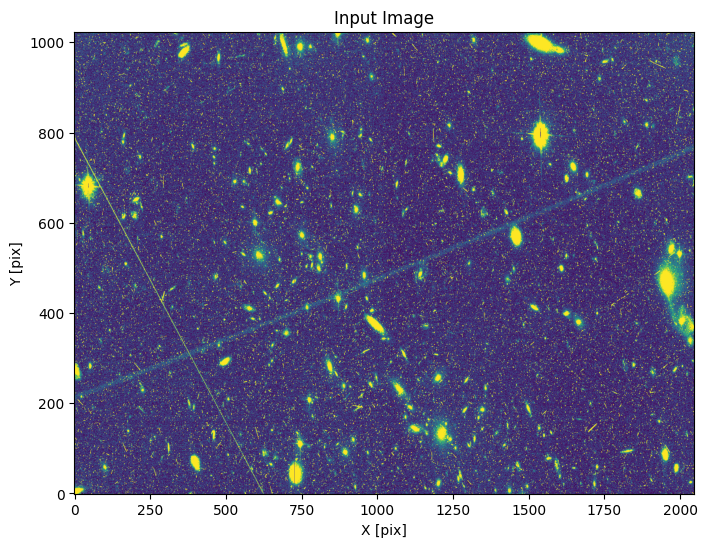

In [10]:
s.plot_image()

If you're having trouble seeing the trails, you can adjust the scale keyword (the min and max values to show given as multiples of the image standard deviation)

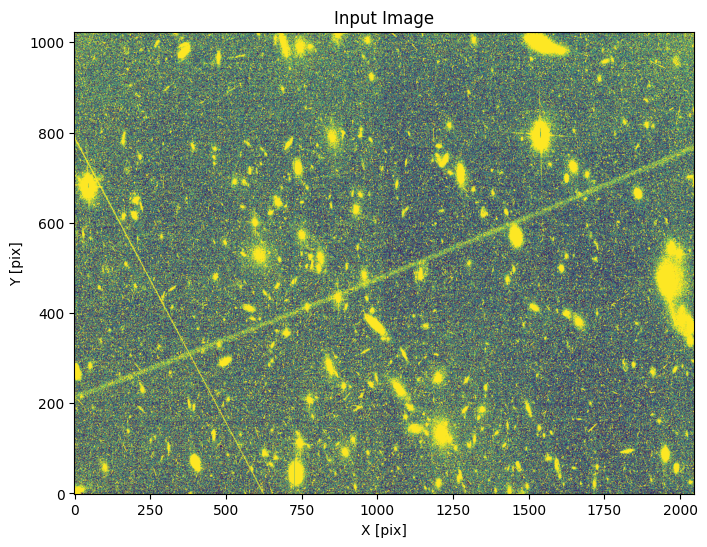

In [11]:
s.plot_image(scale=[-1, 1])

Next we run the Median Radon Transform. This step can take some time depending on the image size and number of processes being used. This tutorial assumes you can run 8 processes at the same time, but adjust as needed. If you're not sure how many processes you can run, you can see how many CPU cores are available and adjust based on that.

In [12]:
os.cpu_count()

4

In [13]:
s.processes = 8  # adjust this if necessary
s.run_mrt()

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


Now we will plot the MRT. You may be able to spot the signals from the satellite trails as two somewhat wide point-like sources.

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

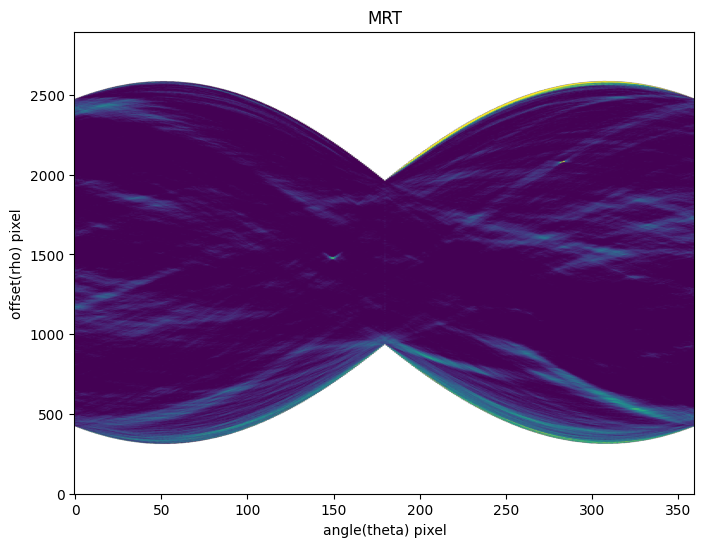

In [14]:
s.plot_mrt()

Note that the x axis in in pixels, not degrees or radians. The `theta` array ranges from 0 to 180 with a spacing of 0.5 degrees, hence 360 pixels.

We next run the source finder on the MRT. You can create your own detection kernels, or use the defaults provided (see [Example 6](#example6) for how to create detection kernels). Depending on the settings, this can pick up a lot more than the actual trails we're interested in. There are additional steps we'll take later to filter these false detections out. The ones we found and their location on the MRT are shown below.

The `threshold` in this case refers to the signal-to-noise ratio of a feature found in the MRT. The default is 5.

INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 2


INFO:findsat_mrt:2 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 4


INFO:findsat_mrt:4 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 8


INFO:findsat_mrt:8 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:8 final sources found


<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

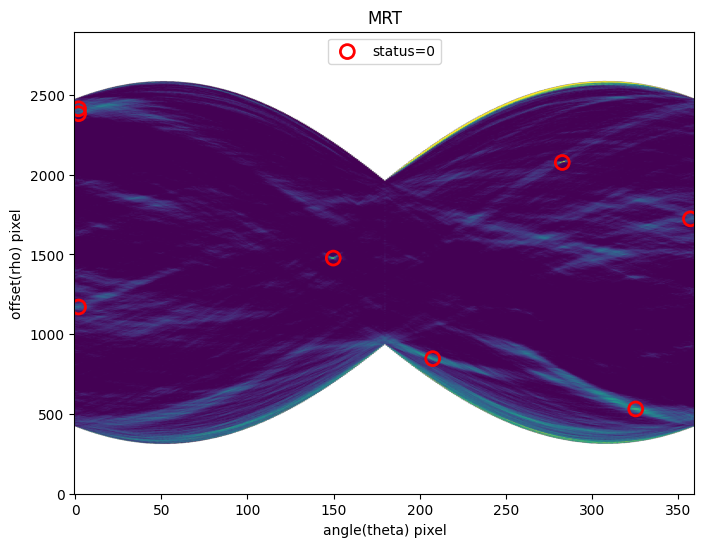

In [15]:
s.threshold = 5  # detection threshold
s.find_mrt_sources()  # finds the sources
s.plot_mrt(show_sources=True)  # overplots the sources on top of the MRT

We filter the sources further based on a reassessment of their S/N, width, and persistence. The default parameters (namely width) have been chosen for ACS data binned by 2 pixels in each direction. It's possible different defaults will be better for different imaging data.

In [16]:
# Parameters that affect how the filtering works
s.threshold = 5
s.max_width = 75
s.check_persistence = True
s.min_persistence = 0.5

# now filter
s.filter_sources()

# note: some extra columns have been added to the source list
s.source_list

INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 24.91901233219658
baseline noise: 1.1599717411425965
snr of feature = 20.48243051822179


INFO:utils_findsat_mrt:width of feature = 27.884750187194527


INFO:utils_findsat_mrt:breaking into 21.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.03705873746593
baseline noise: 5.826863097404741
snr of feature = 3.640071044316816


INFO:utils_findsat_mrt:width of feature = 26.713511257870408


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.640071044316816, 26.713511257870408, 256.76860969165995


INFO:utils_findsat_mrt:Checking persistence, step 2 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.244678352001124
baseline noise: 4.402650211842503
snr of feature = 7.232468310679803


INFO:utils_findsat_mrt:width of feature = 26.50427369135045


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.232468310679803, 26.50427369135045, 256.26522781873535


INFO:utils_findsat_mrt:Checking persistence, step 3 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.287148194468173
baseline noise: 4.621798505573731
snr of feature = 5.120376766826775


INFO:utils_findsat_mrt:width of feature = 23.55101725455205


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.120376766826775, 23.55101725455205, 254.5747255153079


INFO:utils_findsat_mrt:Checking persistence, step 4 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.494867113821286
baseline noise: 5.15769772585319
snr of feature = 6.075805728375499


INFO:utils_findsat_mrt:width of feature = 24.861570742149155


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.075805728375499, 24.861570742149155, 253.13957432396901


INFO:utils_findsat_mrt:Checking persistence, step 5 of 21


INFO:utils_findsat_mrt:amplitude of feature: 35.81167669062658
baseline noise: 4.470593816496017
snr of feature = 7.010496627648276


INFO:utils_findsat_mrt:width of feature = 31.868599951280714


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.010496627648276, 31.868599951280714, 251.1916945118899


INFO:utils_findsat_mrt:Checking persistence, step 6 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.915471193913454
baseline noise: 3.8312234517866752
snr of feature = 6.5473204728972


INFO:utils_findsat_mrt:width of feature = 22.799211957200896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.5473204728972, 22.799211957200896, 251.76332885711122


INFO:utils_findsat_mrt:Checking persistence, step 7 of 21


INFO:utils_findsat_mrt:amplitude of feature: 25.877867164545034
baseline noise: 5.550649020374766
snr of feature = 3.6621335756512714


INFO:utils_findsat_mrt:width of feature = 18.836659382442974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6621335756512714, 18.836659382442974, 251.01462298583013


INFO:utils_findsat_mrt:Checking persistence, step 8 of 21


INFO:utils_findsat_mrt:amplitude of feature: 38.87192450681591
baseline noise: 4.785656302620057
snr of feature = 7.122590100240642


INFO:utils_findsat_mrt:width of feature = 23.993282189725676


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.122590100240642, 23.993282189725676, 250.79898239162415


INFO:utils_findsat_mrt:Checking persistence, step 9 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.350705954680773
baseline noise: 8.932095152668488
snr of feature = 2.397938046552652


INFO:utils_findsat_mrt:width of feature = 20.180662177282215


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.397938046552652, 20.180662177282215, 250.62084244948812


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 21


INFO:utils_findsat_mrt:amplitude of feature: 42.11760035536503
baseline noise: 5.134782477458223
snr of feature = 7.202411794513588


INFO:utils_findsat_mrt:width of feature = 43.23708127246249


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.202411794513588, 43.23708127246249, 250.982387145292


INFO:utils_findsat_mrt:Checking persistence, step 11 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.192129079034686
baseline noise: 5.408442303337759
snr of feature = 4.212615296207604


INFO:utils_findsat_mrt:width of feature = 29.71446898615713


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.212615296207604, 29.71446898615713, 251.57353413396677


INFO:utils_findsat_mrt:Checking persistence, step 12 of 21


INFO:utils_findsat_mrt:amplitude of feature: 33.16741874505417
baseline noise: 4.7456452923747445
snr of feature = 5.989021871977505


INFO:utils_findsat_mrt:width of feature = 27.699596942029217


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.989021871977505, 27.699596942029217, 250.09797748122918


INFO:utils_findsat_mrt:Checking persistence, step 13 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.19126941332115
baseline noise: 3.9522870667098746
snr of feature = 5.879882193364265


INFO:utils_findsat_mrt:width of feature = 23.683416894834124


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.879882193364265, 23.683416894834124, 251.0578187698829


INFO:utils_findsat_mrt:Checking persistence, step 14 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.11413047889569
baseline noise: 5.567317420169788
snr of feature = 4.409091705422697


INFO:utils_findsat_mrt:width of feature = 21.5101409131114


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.409091705422697, 21.5101409131114, 252.0983111587293


INFO:utils_findsat_mrt:Checking persistence, step 15 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.65403140519979
baseline noise: 4.3490226161882655
snr of feature = 7.4281077934070385


INFO:utils_findsat_mrt:width of feature = 27.795305847487043


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.4281077934070385, 27.795305847487043, 252.14654772964332


INFO:utils_findsat_mrt:Checking persistence, step 16 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.54021263092259
baseline noise: 4.189060759029188
snr of feature = 6.29046781312388


INFO:utils_findsat_mrt:width of feature = 151.33145200889967


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.29046781312388, 151.33145200889967, 230.17481998457873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.208224797167123
baseline noise: 6.852619777027433
snr of feature = 2.970485111165712


INFO:utils_findsat_mrt:width of feature = 20.43624118766425


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.970485111165712, 20.43624118766425, 253.9314316855635


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 21


INFO:utils_findsat_mrt:amplitude of feature: 34.22286128634556
baseline noise: 4.845571428800304
snr of feature = 6.06270907140846


INFO:utils_findsat_mrt:width of feature = 25.46174859668656


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.06270907140846, 25.46174859668656, 255.50095085536168


INFO:utils_findsat_mrt:Checking persistence, step 19 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.192894474814807
baseline noise: 3.869212292208175
snr of feature = 6.544919293677293


INFO:utils_findsat_mrt:width of feature = 24.646671963207183


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.544919293677293, 24.646671963207183, 256.13291664295923


INFO:utils_findsat_mrt:Checking persistence, step 20 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.2940384176147
baseline noise: 6.039703403821467
snr of feature = 3.6846734890511965


INFO:utils_findsat_mrt:width of feature = 27.79340175674031


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6846734890511965, 27.79340175674031, 257.0501151764149


INFO:utils_findsat_mrt:Checking persistence, step 21 of 21


INFO:utils_findsat_mrt:amplitude of feature: 31.90903196622079
baseline noise: 4.975004996785656
snr of feature = 5.413869330148849


INFO:utils_findsat_mrt:width of feature = 29.22578246312756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.413869330148849, 29.22578246312756, 258.2189906155948


INFO:utils_findsat_mrt:Number of sections analyzed: 21
Number of sections that passed: 18
persistance score: 0.8571428571428571


INFO:utils_findsat_mrt:amplitude of feature: 138.83213937337246
baseline noise: 1.6174674807929328
snr of feature = 84.83303282568168


INFO:utils_findsat_mrt:width of feature = 5.9021167179136


INFO:utils_findsat_mrt:breaking into 10.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 10


INFO:utils_findsat_mrt:amplitude of feature: 433.16340522514486
baseline noise: 4.903654247210612
snr of feature = 87.33481795164185


INFO:utils_findsat_mrt:width of feature = 3.9161650995320088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 87.33481795164185, 3.9161650995320088, 252.1346813627035


INFO:utils_findsat_mrt:Checking persistence, step 2 of 10


INFO:utils_findsat_mrt:amplitude of feature: 383.97346178152355
baseline noise: 6.721185310845502
snr of feature = 56.128831303301915


INFO:utils_findsat_mrt:width of feature = 3.94971949120054


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 56.128831303301915, 3.94971949120054, 251.953139178627


INFO:utils_findsat_mrt:Checking persistence, step 3 of 10


INFO:utils_findsat_mrt:amplitude of feature: 296.52186635552397
baseline noise: 5.675942277457832
snr of feature = 51.24187489241551


INFO:utils_findsat_mrt:width of feature = 3.9379876433011987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.24187489241551, 3.9379876433011987, 251.77689582305533


INFO:utils_findsat_mrt:Checking persistence, step 4 of 10


INFO:utils_findsat_mrt:amplitude of feature: 212.36062878785052
baseline noise: 4.119664732062721
snr of feature = 50.54803669703513


INFO:utils_findsat_mrt:width of feature = 4.03711100235455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 50.54803669703513, 4.03711100235455, 251.54386506391668


INFO:utils_findsat_mrt:Checking persistence, step 5 of 10


INFO:utils_findsat_mrt:amplitude of feature: 231.2078074995514
baseline noise: 4.2076862665528445
snr of feature = 53.94891796886959


INFO:utils_findsat_mrt:width of feature = 4.088090574128614


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 53.94891796886959, 4.088090574128614, 251.25038694933266


INFO:utils_findsat_mrt:Checking persistence, step 6 of 10


INFO:utils_findsat_mrt:amplitude of feature: 210.77696002894572
baseline noise: 4.4701953071438
snr of feature = 46.15162214324371


INFO:utils_findsat_mrt:width of feature = 4.006562348013233


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 46.15162214324371, 4.006562348013233, 250.96064998668768


INFO:utils_findsat_mrt:Checking persistence, step 7 of 10


INFO:utils_findsat_mrt:amplitude of feature: 155.80334648021733
baseline noise: 6.017244606375362
snr of feature = 24.892805872498737


INFO:utils_findsat_mrt:width of feature = 4.119927528064807


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 24.892805872498737, 4.119927528064807, 250.64709393042088


INFO:utils_findsat_mrt:Checking persistence, step 8 of 10


INFO:utils_findsat_mrt:amplitude of feature: 157.67488144406204
baseline noise: 4.429868481111864
snr of feature = 34.59358073865137


INFO:utils_findsat_mrt:width of feature = 3.974182252058938


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 34.59358073865137, 3.974182252058938, 250.30741691030926


INFO:utils_findsat_mrt:Checking persistence, step 9 of 10


INFO:utils_findsat_mrt:amplitude of feature: 170.5575520698585
baseline noise: 5.354506822507347
snr of feature = 30.85308334148163


INFO:utils_findsat_mrt:width of feature = 4.036665645128664


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.85308334148163, 4.036665645128664, 249.88473974483546


INFO:utils_findsat_mrt:Checking persistence, step 10 of 10


INFO:utils_findsat_mrt:amplitude of feature: 159.90384266555102
baseline noise: 7.75824358349776
snr of feature = 19.610830395384323


INFO:utils_findsat_mrt:width of feature = 3.6445285397138036


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.610830395384323, 3.6445285397138036, 249.4428784737343


INFO:utils_findsat_mrt:Number of sections analyzed: 10
Number of sections that passed: 10
persistance score: 1.0


INFO:utils_findsat_mrt:amplitude of feature: 9.305581720979863
baseline noise: 1.700447857395468
snr of feature = 4.472429913395276


INFO:utils_findsat_mrt:width of feature = 78.77715210338741


INFO:utils_findsat_mrt:amplitude of feature: 9.377875060212682
baseline noise: 1.420706580551507
snr of feature = 5.600852835194349


INFO:utils_findsat_mrt:width of feature = 138.112784724486


INFO:utils_findsat_mrt:amplitude of feature: 21.583052766049114
baseline noise: 2.1189466845548
snr of feature = 9.185746023422862


INFO:utils_findsat_mrt:width of feature = 183.00189778050492


INFO:utils_findsat_mrt:amplitude of feature: 18.184018029670323
baseline noise: 1.9469261569996648
snr of feature = 8.339860150470747


INFO:utils_findsat_mrt:width of feature = 80.01176257176812


INFO:utils_findsat_mrt:amplitude of feature: 6.256153981166975
baseline noise: 1.6912847979946066
snr of feature = 2.69905410879648


INFO:utils_findsat_mrt:width of feature = 131.17717790467276


INFO:utils_findsat_mrt:amplitude of feature: 7.607646247085811
baseline noise: 1.7320507925071826
snr of feature = 3.3922766468491212


INFO:utils_findsat_mrt:width of feature = 126.54722713626336


id,xcentroid,ycentroid,fwhm,roundness,pa,max_value,flux,mag,theta,rho,endpoints,status,mean flux,width,snr,persistence
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,"float64[2,2]",int64,float64,float64,float64,float64
1,149.82917722112848,1477.0613094530704,9.980342955951238,0.8266382780166022,90.32921776877998,25.1707185958598,1149.0752165466638,-7.650871144527514,74.91458861056424,29.061309453070407,0.0 .. 757.2834008044701,2,21.538825828282555,27.884750187194527,20.48243051822179,0.8571428571428571
2,282.79354612259385,2076.5043155497997,8.900328530907668,0.8604150779885588,75.81567463131162,143.49100012021935,1009.9204326422122,-7.510717897264431,141.39677306129693,628.5043155497997,-0.0 .. 0.0,2,117.48677919671532,5.9021167179136,84.83303282568168,1.0
3,1.8923231927240125,1170.3097439537073,11.950936596218098,0.9225220032012451,89.61147369579709,9.662515289264936,726.2272675964862,-7.1526813782569985,0.9461615963620063,-277.6902560462927,737.3243843131145 .. 1023.0,0,5.470694247369972,78.77715210338741,4.472429913395276,0.0
6,1.8995366913744927,2413.2357761369076,12.487708573720205,0.9265202053411946,90.32575768502133,9.927438813079737,798.4562732432539,-7.255627843424357,0.9497683456872463,965.2357761369076,1980.3887067779967 .. 1023.0,0,5.866541574767493,138.112784724486,5.600852835194349,0.0
7,325.41190455906496,531.0116920560318,12.228317261182037,0.7827250610130616,94.05638349909569,14.365975496772903,1765.2965718260257,-8.11704419454713,162.70595227953248,-916.9883079439682,1824.650454848335 .. 308.8565031331327,0,13.193486827216438,183.00189778050492,9.185746023422862,0.0
8,207.5387578063917,846.6333465794975,12.732035792542284,0.8329036667267211,96.53699187761866,11.220704796368398,1187.2658478443936,-7.686369938339782,103.76937890319584,-601.3666534205025,1462.8277393886528 .. 879.8445271723328,0,11.876213670179512,80.01176257176812,8.339860150470747,0.0
11,357.1933845951843,1723.1464798375116,12.146562771046568,0.9282347509429697,88.62307029958265,8.354026966329137,563.4157572264749,-6.877072472176451,178.59669229759214,275.1464798375116,735.7406353574752 .. 0.0,0,3.402050447948185,131.17717790467276,2.69905410879648,0.0
13,1.937826141215659,2382.470875979405,11.58119273596545,0.9182305728264577,87.55101221940443,8.791468522260542,575.153087785568,-6.8994586392527495,0.9689130706078295,934.4708759794048,1949.4538488430258 .. 1023.0,0,4.612941083074342,126.54722713626336,3.3922766468491212,0.0


Several columns have been added to the source list that characterize the observed streak. Also, the `status` array has values of 0, 1, and 2 now (it just had 0 before). Those with `status=2` are sources that passed all filtering stages (checks for SNR and width, then persistence). Those with `status=1` are sources that passed the first filtering stage (checks for SNR and width), but not the second (persistence check). And `status=0` are sources that did not pass the filtering steps.

The `plot_mrt` command will overplot the different statuses

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

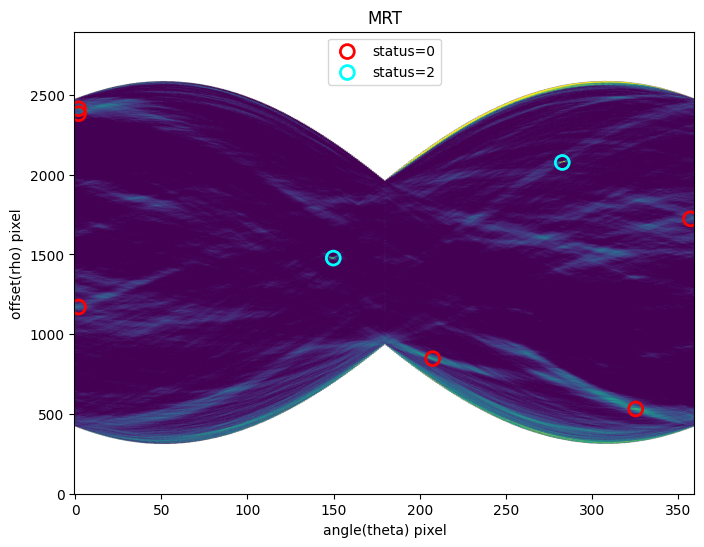

In [17]:
s.plot_mrt(show_sources=True)

Now we can make the mask itself. By default it only uses sources in the MRT with `status=2`. We make two types of masks, one a simple boolean mask, and one a segementation mask where pixels corresponding to each streak are assigned the ID number. We create these below.

In [18]:
# make the mask
s.mask_include_status = [2]
s.make_mask()

<Axes: title={'center': 'Segmentation Mask'}>

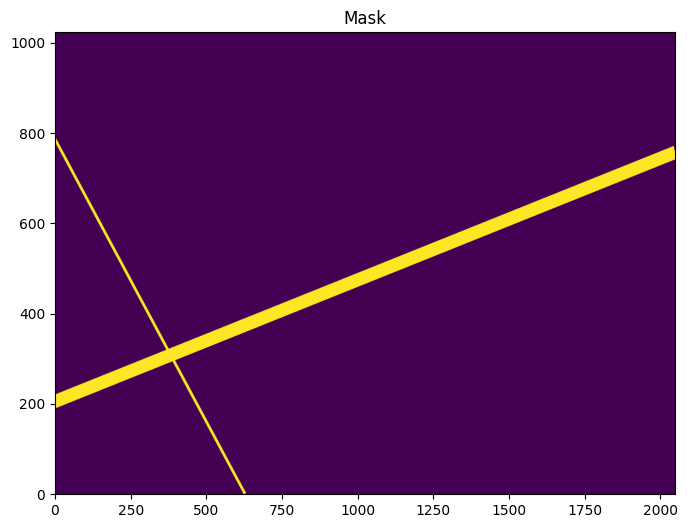

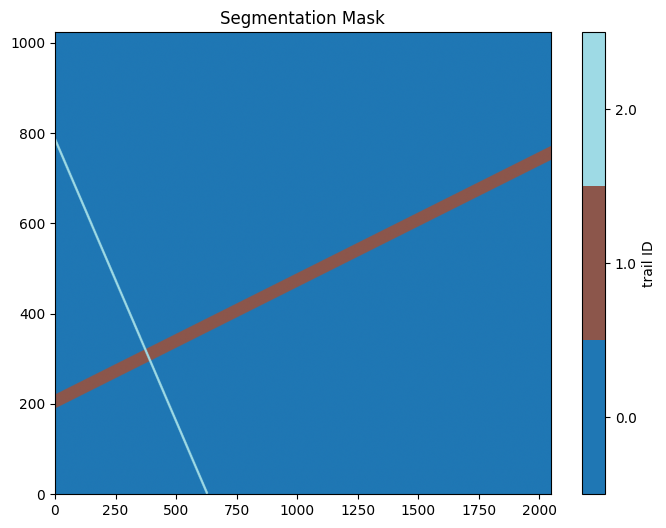

In [19]:
# plot the mask and segmentation map
s.plot_mask()
s.plot_segment()

We can also overlay the mask on top of the image to make sure it makes sense.

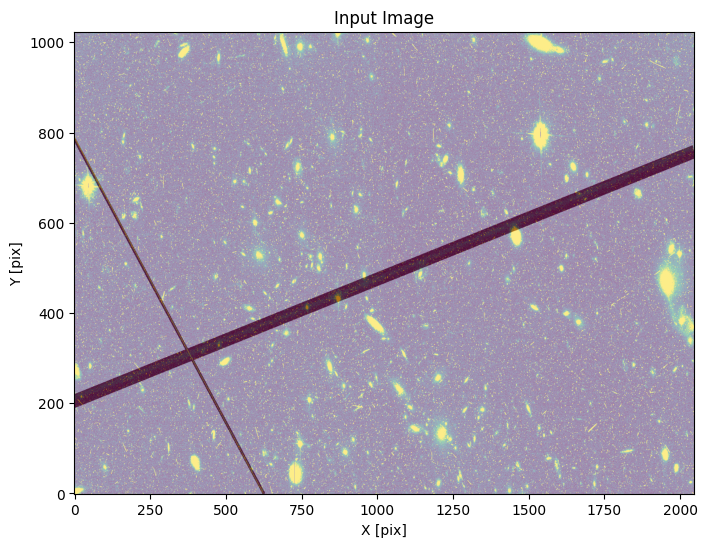

In [20]:
s.plot_image(overlay_mask=True)

We can save the results now. You have the optional of saving the catalog, mask, MRT, and a diagnostic image that shows the results. In this example we'll just save everything.

In [21]:
# define what to save
s.save_mask = True
s.save_mrt = True
s.save_catalog = True
s.save_diagnostic = True

s.save_output()

INFO:findsat_mrt:Wrote MRT to ./example1_mrt.fits


INFO:findsat_mrt:Wrote mask to ./example1_mask.fits


INFO:findsat_mrt:Wrote diagnostic plot to ./example1_diagnostic.png


INFO:findsat_mrt:wrote catalog ./example1_catalog.fits


Keep in mind that the mask we have created is applicable to the rebinned image. To convert it into a mask that can be applied to the original unbinned image, we need to resample it using the `block_replicate` function. The rescaled mask is plotted below. Note the difference in image size, but the mask pattern remains the same.

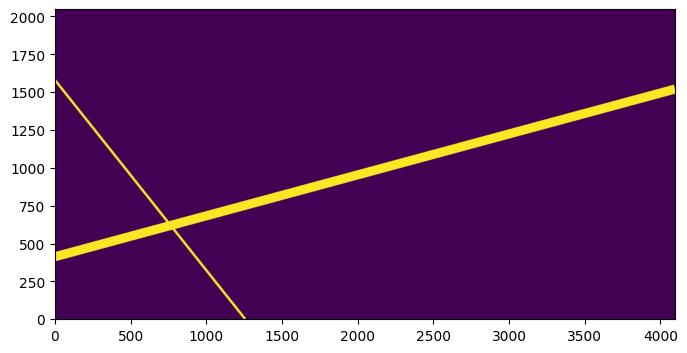

In [22]:
full_mask = block_replicate(s.mask, binsize, conserve_sum=False)
fig, ax = plt.subplots()
ax.imshow(full_mask, origin='lower')

## <a id="example2"></a>
## Example 2: Quick run of TrailFinder on an flc image

Example 1 thoroughly demonstrated the steps to read in an FLC file, pre-process it, and identify trails. This example demonstrates how one can run many of the steps simultaneously once a file is read in an all parameters set. 

First, we read in and preprocess the data file exactly as before.

In [23]:
# Read in the image files and header information
image_file = 'jc8m32j5q_flc.fits'
ext = 4  # ACS image data are in extensions 1 or 4, we'll just use 1 for now
with fits.open(image_file) as h:
    image = h[ext].data  # image data
    dq = h[ext+2].data  # data quality bitmasks
    
    header = h[0].header  # primary header
    image_header = h[1].header  # image header

# make a mask for bad pixels.
mask = bitmask.bitfield_to_boolean_mask(dq, ignore_flags=[4096, 8192, 16384])
image[mask] = np.nan

# Subtract the background from the image.
image = image - np.nanmedian(image)

# Rebin the image to speed up calculation
image_rebin = block_reduce(image, 2, func=np.nansum)
print(image)

[[ 5.3865341e+01  7.8019745e+01  8.2247345e+01 ... -3.3728485e+00
   6.1827087e+00  2.1880539e+01]
 [ 1.1074997e+02  1.1152661e+02  8.5881012e+01 ...  1.4530136e+01
  -6.7273865e+00  2.8059235e+00]
 [ 1.2623224e+02  8.3352676e+01  1.2429016e+02 ...  5.4334668e+02
   1.4530377e+03  1.2701355e+01]
 ...
 [-7.6905212e+00  1.2053024e+01 -1.3718872e+01 ...  3.0393707e+01
   9.4887848e+00 -1.3821991e+01]
 [-8.6222687e+00 -1.6515350e+00  2.6492020e+01 ...  1.9346451e+01
   8.3587646e-02 -6.6112366e+00]
 [           nan            nan            nan ...            nan
             nan            nan]]


And initialize trail finder as before

In [24]:
s2 = TrailFinder(image=image_rebin,
                 header=header,
                 image_header=image_header,
                 save_image_header_keys=['ROOTNAME', 'CCDCHIP', 'CRPIX1', 'CRPIX2', 'CRVAL1', 'CRVAL2',
                                         'ORIENTAT', 'RA_APER', 'DEC_APER', 'PA_APER'],
                 processes=8,
                 plot=False,
                 threshold=5,
                 max_width=75,  
                 check_persistence=True,
                 min_persistence=0.5,
                 output_root='example2')

If you're feeling ok about the setup, run all the subsequent steps together with the `run_all` command (this calculates the MRT, finds MRT sources, filters the sources, and saves the output)

In [25]:
s2.run_all()

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 2


INFO:findsat_mrt:2 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 4


INFO:findsat_mrt:4 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 8


INFO:findsat_mrt:8 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:8 final sources found


INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 24.91901233219658
baseline noise: 1.1599717411425965
snr of feature = 20.48243051822179


INFO:utils_findsat_mrt:width of feature = 27.884750187194527


INFO:utils_findsat_mrt:breaking into 21.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.03705873746593
baseline noise: 5.826863097404741
snr of feature = 3.640071044316816


INFO:utils_findsat_mrt:width of feature = 26.713511257870408


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.640071044316816, 26.713511257870408, 256.76860969165995


INFO:utils_findsat_mrt:Checking persistence, step 2 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.244678352001124
baseline noise: 4.402650211842503
snr of feature = 7.232468310679803


INFO:utils_findsat_mrt:width of feature = 26.50427369135045


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.232468310679803, 26.50427369135045, 256.26522781873535


INFO:utils_findsat_mrt:Checking persistence, step 3 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.287148194468173
baseline noise: 4.621798505573731
snr of feature = 5.120376766826775


INFO:utils_findsat_mrt:width of feature = 23.55101725455205


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.120376766826775, 23.55101725455205, 254.5747255153079


INFO:utils_findsat_mrt:Checking persistence, step 4 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.494867113821286
baseline noise: 5.15769772585319
snr of feature = 6.075805728375499


INFO:utils_findsat_mrt:width of feature = 24.861570742149155


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.075805728375499, 24.861570742149155, 253.13957432396901


INFO:utils_findsat_mrt:Checking persistence, step 5 of 21


INFO:utils_findsat_mrt:amplitude of feature: 35.81167669062658
baseline noise: 4.470593816496017
snr of feature = 7.010496627648276


INFO:utils_findsat_mrt:width of feature = 31.868599951280714


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.010496627648276, 31.868599951280714, 251.1916945118899


INFO:utils_findsat_mrt:Checking persistence, step 6 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.915471193913454
baseline noise: 3.8312234517866752
snr of feature = 6.5473204728972


INFO:utils_findsat_mrt:width of feature = 22.799211957200896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.5473204728972, 22.799211957200896, 251.76332885711122


INFO:utils_findsat_mrt:Checking persistence, step 7 of 21


INFO:utils_findsat_mrt:amplitude of feature: 25.877867164545034
baseline noise: 5.550649020374766
snr of feature = 3.6621335756512714


INFO:utils_findsat_mrt:width of feature = 18.836659382442974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6621335756512714, 18.836659382442974, 251.01462298583013


INFO:utils_findsat_mrt:Checking persistence, step 8 of 21


INFO:utils_findsat_mrt:amplitude of feature: 38.87192450681591
baseline noise: 4.785656302620057
snr of feature = 7.122590100240642


INFO:utils_findsat_mrt:width of feature = 23.993282189725676


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.122590100240642, 23.993282189725676, 250.79898239162415


INFO:utils_findsat_mrt:Checking persistence, step 9 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.350705954680773
baseline noise: 8.932095152668488
snr of feature = 2.397938046552652


INFO:utils_findsat_mrt:width of feature = 20.180662177282215


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.397938046552652, 20.180662177282215, 250.62084244948812


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 21


INFO:utils_findsat_mrt:amplitude of feature: 42.11760035536503
baseline noise: 5.134782477458223
snr of feature = 7.202411794513588


INFO:utils_findsat_mrt:width of feature = 43.23708127246249


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.202411794513588, 43.23708127246249, 250.982387145292


INFO:utils_findsat_mrt:Checking persistence, step 11 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.192129079034686
baseline noise: 5.408442303337759
snr of feature = 4.212615296207604


INFO:utils_findsat_mrt:width of feature = 29.71446898615713


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.212615296207604, 29.71446898615713, 251.57353413396677


INFO:utils_findsat_mrt:Checking persistence, step 12 of 21


INFO:utils_findsat_mrt:amplitude of feature: 33.16741874505417
baseline noise: 4.7456452923747445
snr of feature = 5.989021871977505


INFO:utils_findsat_mrt:width of feature = 27.699596942029217


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.989021871977505, 27.699596942029217, 250.09797748122918


INFO:utils_findsat_mrt:Checking persistence, step 13 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.19126941332115
baseline noise: 3.9522870667098746
snr of feature = 5.879882193364265


INFO:utils_findsat_mrt:width of feature = 23.683416894834124


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.879882193364265, 23.683416894834124, 251.0578187698829


INFO:utils_findsat_mrt:Checking persistence, step 14 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.11413047889569
baseline noise: 5.567317420169788
snr of feature = 4.409091705422697


INFO:utils_findsat_mrt:width of feature = 21.5101409131114


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.409091705422697, 21.5101409131114, 252.0983111587293


INFO:utils_findsat_mrt:Checking persistence, step 15 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.65403140519979
baseline noise: 4.3490226161882655
snr of feature = 7.4281077934070385


INFO:utils_findsat_mrt:width of feature = 27.795305847487043


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.4281077934070385, 27.795305847487043, 252.14654772964332


INFO:utils_findsat_mrt:Checking persistence, step 16 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.54021263092259
baseline noise: 4.189060759029188
snr of feature = 6.29046781312388


INFO:utils_findsat_mrt:width of feature = 151.33145200889967


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.29046781312388, 151.33145200889967, 230.17481998457873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.208224797167123
baseline noise: 6.852619777027433
snr of feature = 2.970485111165712


INFO:utils_findsat_mrt:width of feature = 20.43624118766425


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.970485111165712, 20.43624118766425, 253.9314316855635


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 21


INFO:utils_findsat_mrt:amplitude of feature: 34.22286128634556
baseline noise: 4.845571428800304
snr of feature = 6.06270907140846


INFO:utils_findsat_mrt:width of feature = 25.46174859668656


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.06270907140846, 25.46174859668656, 255.50095085536168


INFO:utils_findsat_mrt:Checking persistence, step 19 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.192894474814807
baseline noise: 3.869212292208175
snr of feature = 6.544919293677293


INFO:utils_findsat_mrt:width of feature = 24.646671963207183


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.544919293677293, 24.646671963207183, 256.13291664295923


INFO:utils_findsat_mrt:Checking persistence, step 20 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.2940384176147
baseline noise: 6.039703403821467
snr of feature = 3.6846734890511965


INFO:utils_findsat_mrt:width of feature = 27.79340175674031


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6846734890511965, 27.79340175674031, 257.0501151764149


INFO:utils_findsat_mrt:Checking persistence, step 21 of 21


INFO:utils_findsat_mrt:amplitude of feature: 31.90903196622079
baseline noise: 4.975004996785656
snr of feature = 5.413869330148849


INFO:utils_findsat_mrt:width of feature = 29.22578246312756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.413869330148849, 29.22578246312756, 258.2189906155948


INFO:utils_findsat_mrt:Number of sections analyzed: 21
Number of sections that passed: 18
persistance score: 0.8571428571428571


INFO:utils_findsat_mrt:amplitude of feature: 138.83213937337246
baseline noise: 1.6174674807929328
snr of feature = 84.83303282568168


INFO:utils_findsat_mrt:width of feature = 5.9021167179136


INFO:utils_findsat_mrt:breaking into 10.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 10


INFO:utils_findsat_mrt:amplitude of feature: 433.16340522514486
baseline noise: 4.903654247210612
snr of feature = 87.33481795164185


INFO:utils_findsat_mrt:width of feature = 3.9161650995320088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 87.33481795164185, 3.9161650995320088, 252.1346813627035


INFO:utils_findsat_mrt:Checking persistence, step 2 of 10


INFO:utils_findsat_mrt:amplitude of feature: 383.97346178152355
baseline noise: 6.721185310845502
snr of feature = 56.128831303301915


INFO:utils_findsat_mrt:width of feature = 3.94971949120054


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 56.128831303301915, 3.94971949120054, 251.953139178627


INFO:utils_findsat_mrt:Checking persistence, step 3 of 10


INFO:utils_findsat_mrt:amplitude of feature: 296.52186635552397
baseline noise: 5.675942277457832
snr of feature = 51.24187489241551


INFO:utils_findsat_mrt:width of feature = 3.9379876433011987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.24187489241551, 3.9379876433011987, 251.77689582305533


INFO:utils_findsat_mrt:Checking persistence, step 4 of 10


INFO:utils_findsat_mrt:amplitude of feature: 212.36062878785052
baseline noise: 4.119664732062721
snr of feature = 50.54803669703513


INFO:utils_findsat_mrt:width of feature = 4.03711100235455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 50.54803669703513, 4.03711100235455, 251.54386506391668


INFO:utils_findsat_mrt:Checking persistence, step 5 of 10


INFO:utils_findsat_mrt:amplitude of feature: 231.2078074995514
baseline noise: 4.2076862665528445
snr of feature = 53.94891796886959


INFO:utils_findsat_mrt:width of feature = 4.088090574128614


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 53.94891796886959, 4.088090574128614, 251.25038694933266


INFO:utils_findsat_mrt:Checking persistence, step 6 of 10


INFO:utils_findsat_mrt:amplitude of feature: 210.77696002894572
baseline noise: 4.4701953071438
snr of feature = 46.15162214324371


INFO:utils_findsat_mrt:width of feature = 4.006562348013233


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 46.15162214324371, 4.006562348013233, 250.96064998668768


INFO:utils_findsat_mrt:Checking persistence, step 7 of 10


INFO:utils_findsat_mrt:amplitude of feature: 155.80334648021733
baseline noise: 6.017244606375362
snr of feature = 24.892805872498737


INFO:utils_findsat_mrt:width of feature = 4.119927528064807


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 24.892805872498737, 4.119927528064807, 250.64709393042088


INFO:utils_findsat_mrt:Checking persistence, step 8 of 10


INFO:utils_findsat_mrt:amplitude of feature: 157.67488144406204
baseline noise: 4.429868481111864
snr of feature = 34.59358073865137


INFO:utils_findsat_mrt:width of feature = 3.974182252058938


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 34.59358073865137, 3.974182252058938, 250.30741691030926


INFO:utils_findsat_mrt:Checking persistence, step 9 of 10


INFO:utils_findsat_mrt:amplitude of feature: 170.5575520698585
baseline noise: 5.354506822507347
snr of feature = 30.85308334148163


INFO:utils_findsat_mrt:width of feature = 4.036665645128664


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.85308334148163, 4.036665645128664, 249.88473974483546


INFO:utils_findsat_mrt:Checking persistence, step 10 of 10


INFO:utils_findsat_mrt:amplitude of feature: 159.90384266555102
baseline noise: 7.75824358349776
snr of feature = 19.610830395384323


INFO:utils_findsat_mrt:width of feature = 3.6445285397138036


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.610830395384323, 3.6445285397138036, 249.4428784737343


INFO:utils_findsat_mrt:Number of sections analyzed: 10
Number of sections that passed: 10
persistance score: 1.0


INFO:utils_findsat_mrt:amplitude of feature: 9.305581720979863
baseline noise: 1.700447857395468
snr of feature = 4.472429913395276


INFO:utils_findsat_mrt:width of feature = 78.77715210338741


INFO:utils_findsat_mrt:amplitude of feature: 9.377875060212682
baseline noise: 1.420706580551507
snr of feature = 5.600852835194349


INFO:utils_findsat_mrt:width of feature = 138.112784724486


INFO:utils_findsat_mrt:amplitude of feature: 21.583052766049114
baseline noise: 2.1189466845548
snr of feature = 9.185746023422862


INFO:utils_findsat_mrt:width of feature = 183.00189778050492


INFO:utils_findsat_mrt:amplitude of feature: 18.184018029670323
baseline noise: 1.9469261569996648
snr of feature = 8.339860150470747


INFO:utils_findsat_mrt:width of feature = 80.01176257176812


INFO:utils_findsat_mrt:amplitude of feature: 6.256153981166975
baseline noise: 1.6912847979946066
snr of feature = 2.69905410879648


INFO:utils_findsat_mrt:width of feature = 131.17717790467276


INFO:utils_findsat_mrt:amplitude of feature: 7.607646247085811
baseline noise: 1.7320507925071826
snr of feature = 3.3922766468491212


INFO:utils_findsat_mrt:width of feature = 126.54722713626336


INFO:findsat_mrt:Wrote diagnostic plot to ./example2_diagnostic.png


INFO:findsat_mrt:wrote catalog ./example2_catalog.fits


If we plot the mask, it should look identical to the one in the previous example.

<Axes: title={'center': 'Mask'}>

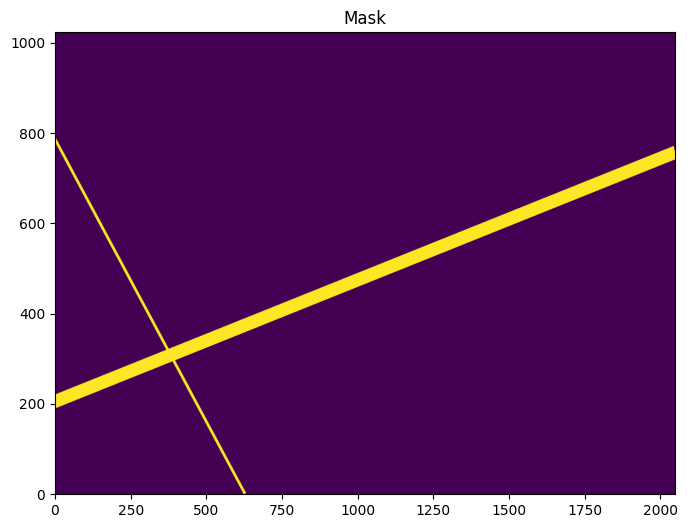

In [26]:
s2.plot_mask()

## <a id="example3"></a>
## Example 3: find trails in an FLC image using the WFC wrapper

The approaches shown in examples 1 and 2 can be useful for imaging data from any telescope, not just ACS/WFC data. However, for ACS/WFC data, we provide a convenience wrapper that performs even more of the steps all together, including reading the image and pre-processing it.

The `WfcWrapper` class has the same properties as the TrailFinder class, but with a few additional keywords. It also contains the additional routines that read the image, rebin, mask, and subtract the background. By default, these will be run automatically when WfcWrapper is initialized, although this can be turned off. In most cases, you probably will only need to adjust the `binsize` keyword. The specific value of `binsize` is up to the user. Larger values speed up the MRT calculation, but keep in mind that the parameters to filter out spurious trails (e.g., `max_width`) are tuned to WFC data binned 2x2. A user may want to start with a larger value for `binsize` and reduce it once they get a sense for the computation time.

In [27]:
w = WfcWrapper('jc8m32j5q_flc.fits', binsize=2, extension=4, processes=8, output_root='example3')

INFO:findsat_mrt:image type is flc


INFO:findsat_mrt:masking bad pixels


INFO:findsat_mrt:Subtracting median background


INFO:findsat_mrt:Rebinning the data by 2


We can plot the image to see that it looks like the one from the last example after preprocessing.

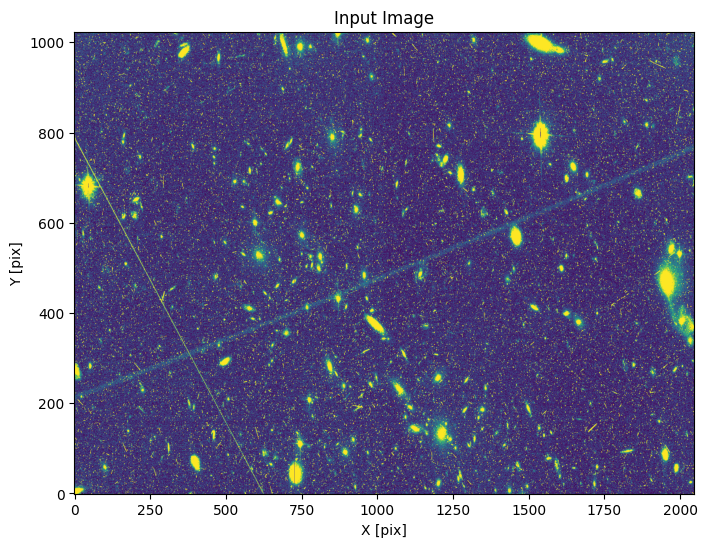

In [28]:
w.plot_image()

From here, everything is the same as the last example:

In [29]:
w.run_mrt()
w.find_mrt_sources()
w.filter_sources()

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 2


INFO:findsat_mrt:2 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 4


INFO:findsat_mrt:4 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 8


INFO:findsat_mrt:8 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:8 final sources found


INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 24.91901233219658
baseline noise: 1.1599717411425965
snr of feature = 20.48243051822179


INFO:utils_findsat_mrt:width of feature = 27.884750187194527


INFO:utils_findsat_mrt:breaking into 21.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.03705873746593
baseline noise: 5.826863097404741
snr of feature = 3.640071044316816


INFO:utils_findsat_mrt:width of feature = 26.713511257870408


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.640071044316816, 26.713511257870408, 256.76860969165995


INFO:utils_findsat_mrt:Checking persistence, step 2 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.244678352001124
baseline noise: 4.402650211842503
snr of feature = 7.232468310679803


INFO:utils_findsat_mrt:width of feature = 26.50427369135045


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.232468310679803, 26.50427369135045, 256.26522781873535


INFO:utils_findsat_mrt:Checking persistence, step 3 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.287148194468173
baseline noise: 4.621798505573731
snr of feature = 5.120376766826775


INFO:utils_findsat_mrt:width of feature = 23.55101725455205


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.120376766826775, 23.55101725455205, 254.5747255153079


INFO:utils_findsat_mrt:Checking persistence, step 4 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.494867113821286
baseline noise: 5.15769772585319
snr of feature = 6.075805728375499


INFO:utils_findsat_mrt:width of feature = 24.861570742149155


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.075805728375499, 24.861570742149155, 253.13957432396901


INFO:utils_findsat_mrt:Checking persistence, step 5 of 21


INFO:utils_findsat_mrt:amplitude of feature: 35.81167669062658
baseline noise: 4.470593816496017
snr of feature = 7.010496627648276


INFO:utils_findsat_mrt:width of feature = 31.868599951280714


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.010496627648276, 31.868599951280714, 251.1916945118899


INFO:utils_findsat_mrt:Checking persistence, step 6 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.915471193913454
baseline noise: 3.8312234517866752
snr of feature = 6.5473204728972


INFO:utils_findsat_mrt:width of feature = 22.799211957200896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.5473204728972, 22.799211957200896, 251.76332885711122


INFO:utils_findsat_mrt:Checking persistence, step 7 of 21


INFO:utils_findsat_mrt:amplitude of feature: 25.877867164545034
baseline noise: 5.550649020374766
snr of feature = 3.6621335756512714


INFO:utils_findsat_mrt:width of feature = 18.836659382442974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6621335756512714, 18.836659382442974, 251.01462298583013


INFO:utils_findsat_mrt:Checking persistence, step 8 of 21


INFO:utils_findsat_mrt:amplitude of feature: 38.87192450681591
baseline noise: 4.785656302620057
snr of feature = 7.122590100240642


INFO:utils_findsat_mrt:width of feature = 23.993282189725676


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.122590100240642, 23.993282189725676, 250.79898239162415


INFO:utils_findsat_mrt:Checking persistence, step 9 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.350705954680773
baseline noise: 8.932095152668488
snr of feature = 2.397938046552652


INFO:utils_findsat_mrt:width of feature = 20.180662177282215


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.397938046552652, 20.180662177282215, 250.62084244948812


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 21


INFO:utils_findsat_mrt:amplitude of feature: 42.11760035536503
baseline noise: 5.134782477458223
snr of feature = 7.202411794513588


INFO:utils_findsat_mrt:width of feature = 43.23708127246249


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.202411794513588, 43.23708127246249, 250.982387145292


INFO:utils_findsat_mrt:Checking persistence, step 11 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.192129079034686
baseline noise: 5.408442303337759
snr of feature = 4.212615296207604


INFO:utils_findsat_mrt:width of feature = 29.71446898615713


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.212615296207604, 29.71446898615713, 251.57353413396677


INFO:utils_findsat_mrt:Checking persistence, step 12 of 21


INFO:utils_findsat_mrt:amplitude of feature: 33.16741874505417
baseline noise: 4.7456452923747445
snr of feature = 5.989021871977505


INFO:utils_findsat_mrt:width of feature = 27.699596942029217


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.989021871977505, 27.699596942029217, 250.09797748122918


INFO:utils_findsat_mrt:Checking persistence, step 13 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.19126941332115
baseline noise: 3.9522870667098746
snr of feature = 5.879882193364265


INFO:utils_findsat_mrt:width of feature = 23.683416894834124


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.879882193364265, 23.683416894834124, 251.0578187698829


INFO:utils_findsat_mrt:Checking persistence, step 14 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.11413047889569
baseline noise: 5.567317420169788
snr of feature = 4.409091705422697


INFO:utils_findsat_mrt:width of feature = 21.5101409131114


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.409091705422697, 21.5101409131114, 252.0983111587293


INFO:utils_findsat_mrt:Checking persistence, step 15 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.65403140519979
baseline noise: 4.3490226161882655
snr of feature = 7.4281077934070385


INFO:utils_findsat_mrt:width of feature = 27.795305847487043


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.4281077934070385, 27.795305847487043, 252.14654772964332


INFO:utils_findsat_mrt:Checking persistence, step 16 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.54021263092259
baseline noise: 4.189060759029188
snr of feature = 6.29046781312388


INFO:utils_findsat_mrt:width of feature = 151.33145200889967


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.29046781312388, 151.33145200889967, 230.17481998457873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.208224797167123
baseline noise: 6.852619777027433
snr of feature = 2.970485111165712


INFO:utils_findsat_mrt:width of feature = 20.43624118766425


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.970485111165712, 20.43624118766425, 253.9314316855635


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 21


INFO:utils_findsat_mrt:amplitude of feature: 34.22286128634556
baseline noise: 4.845571428800304
snr of feature = 6.06270907140846


INFO:utils_findsat_mrt:width of feature = 25.46174859668656


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.06270907140846, 25.46174859668656, 255.50095085536168


INFO:utils_findsat_mrt:Checking persistence, step 19 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.192894474814807
baseline noise: 3.869212292208175
snr of feature = 6.544919293677293


INFO:utils_findsat_mrt:width of feature = 24.646671963207183


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.544919293677293, 24.646671963207183, 256.13291664295923


INFO:utils_findsat_mrt:Checking persistence, step 20 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.2940384176147
baseline noise: 6.039703403821467
snr of feature = 3.6846734890511965


INFO:utils_findsat_mrt:width of feature = 27.79340175674031


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6846734890511965, 27.79340175674031, 257.0501151764149


INFO:utils_findsat_mrt:Checking persistence, step 21 of 21


INFO:utils_findsat_mrt:amplitude of feature: 31.90903196622079
baseline noise: 4.975004996785656
snr of feature = 5.413869330148849


INFO:utils_findsat_mrt:width of feature = 29.22578246312756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.413869330148849, 29.22578246312756, 258.2189906155948


INFO:utils_findsat_mrt:Number of sections analyzed: 21
Number of sections that passed: 18
persistance score: 0.8571428571428571


INFO:utils_findsat_mrt:amplitude of feature: 138.83213937337246
baseline noise: 1.6174674807929328
snr of feature = 84.83303282568168


INFO:utils_findsat_mrt:width of feature = 5.9021167179136


INFO:utils_findsat_mrt:breaking into 10.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 10


INFO:utils_findsat_mrt:amplitude of feature: 433.16340522514486
baseline noise: 4.903654247210612
snr of feature = 87.33481795164185


INFO:utils_findsat_mrt:width of feature = 3.9161650995320088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 87.33481795164185, 3.9161650995320088, 252.1346813627035


INFO:utils_findsat_mrt:Checking persistence, step 2 of 10


INFO:utils_findsat_mrt:amplitude of feature: 383.97346178152355
baseline noise: 6.721185310845502
snr of feature = 56.128831303301915


INFO:utils_findsat_mrt:width of feature = 3.94971949120054


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 56.128831303301915, 3.94971949120054, 251.953139178627


INFO:utils_findsat_mrt:Checking persistence, step 3 of 10


INFO:utils_findsat_mrt:amplitude of feature: 296.52186635552397
baseline noise: 5.675942277457832
snr of feature = 51.24187489241551


INFO:utils_findsat_mrt:width of feature = 3.9379876433011987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.24187489241551, 3.9379876433011987, 251.77689582305533


INFO:utils_findsat_mrt:Checking persistence, step 4 of 10


INFO:utils_findsat_mrt:amplitude of feature: 212.36062878785052
baseline noise: 4.119664732062721
snr of feature = 50.54803669703513


INFO:utils_findsat_mrt:width of feature = 4.03711100235455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 50.54803669703513, 4.03711100235455, 251.54386506391668


INFO:utils_findsat_mrt:Checking persistence, step 5 of 10


INFO:utils_findsat_mrt:amplitude of feature: 231.2078074995514
baseline noise: 4.2076862665528445
snr of feature = 53.94891796886959


INFO:utils_findsat_mrt:width of feature = 4.088090574128614


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 53.94891796886959, 4.088090574128614, 251.25038694933266


INFO:utils_findsat_mrt:Checking persistence, step 6 of 10


INFO:utils_findsat_mrt:amplitude of feature: 210.77696002894572
baseline noise: 4.4701953071438
snr of feature = 46.15162214324371


INFO:utils_findsat_mrt:width of feature = 4.006562348013233


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 46.15162214324371, 4.006562348013233, 250.96064998668768


INFO:utils_findsat_mrt:Checking persistence, step 7 of 10


INFO:utils_findsat_mrt:amplitude of feature: 155.80334648021733
baseline noise: 6.017244606375362
snr of feature = 24.892805872498737


INFO:utils_findsat_mrt:width of feature = 4.119927528064807


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 24.892805872498737, 4.119927528064807, 250.64709393042088


INFO:utils_findsat_mrt:Checking persistence, step 8 of 10


INFO:utils_findsat_mrt:amplitude of feature: 157.67488144406204
baseline noise: 4.429868481111864
snr of feature = 34.59358073865137


INFO:utils_findsat_mrt:width of feature = 3.974182252058938


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 34.59358073865137, 3.974182252058938, 250.30741691030926


INFO:utils_findsat_mrt:Checking persistence, step 9 of 10


INFO:utils_findsat_mrt:amplitude of feature: 170.5575520698585
baseline noise: 5.354506822507347
snr of feature = 30.85308334148163


INFO:utils_findsat_mrt:width of feature = 4.036665645128664


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.85308334148163, 4.036665645128664, 249.88473974483546


INFO:utils_findsat_mrt:Checking persistence, step 10 of 10


INFO:utils_findsat_mrt:amplitude of feature: 159.90384266555102
baseline noise: 7.75824358349776
snr of feature = 19.610830395384323


INFO:utils_findsat_mrt:width of feature = 3.6445285397138036


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.610830395384323, 3.6445285397138036, 249.4428784737343


INFO:utils_findsat_mrt:Number of sections analyzed: 10
Number of sections that passed: 10
persistance score: 1.0


INFO:utils_findsat_mrt:amplitude of feature: 9.305581720979863
baseline noise: 1.700447857395468
snr of feature = 4.472429913395276


INFO:utils_findsat_mrt:width of feature = 78.77715210338741


INFO:utils_findsat_mrt:amplitude of feature: 9.377875060212682
baseline noise: 1.420706580551507
snr of feature = 5.600852835194349


INFO:utils_findsat_mrt:width of feature = 138.112784724486


INFO:utils_findsat_mrt:amplitude of feature: 21.583052766049114
baseline noise: 2.1189466845548
snr of feature = 9.185746023422862


INFO:utils_findsat_mrt:width of feature = 183.00189778050492


INFO:utils_findsat_mrt:amplitude of feature: 18.184018029670323
baseline noise: 1.9469261569996648
snr of feature = 8.339860150470747


INFO:utils_findsat_mrt:width of feature = 80.01176257176812


INFO:utils_findsat_mrt:amplitude of feature: 6.256153981166975
baseline noise: 1.6912847979946066
snr of feature = 2.69905410879648


INFO:utils_findsat_mrt:width of feature = 131.17717790467276


INFO:utils_findsat_mrt:amplitude of feature: 7.607646247085811
baseline noise: 1.7320507925071826
snr of feature = 3.3922766468491212


INFO:utils_findsat_mrt:width of feature = 126.54722713626336


id,xcentroid,ycentroid,fwhm,roundness,pa,max_value,flux,mag,theta,rho,endpoints,status,mean flux,width,snr,persistence
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,"float64[2,2]",int64,float64,float64,float64,float64
1,149.82917722112848,1477.0613094530704,9.980342955951238,0.8266382780166022,90.32921776877998,25.1707185958598,1149.0752165466638,-7.650871144527514,74.91458861056424,29.061309453070407,0.0 .. 757.2834008044701,2,21.538825828282555,27.884750187194527,20.48243051822179,0.8571428571428571
2,282.79354612259385,2076.5043155497997,8.900328530907668,0.8604150779885588,75.81567463131162,143.49100012021935,1009.9204326422122,-7.510717897264431,141.39677306129693,628.5043155497997,-0.0 .. 0.0,2,117.48677919671532,5.9021167179136,84.83303282568168,1.0
3,1.8923231927240125,1170.3097439537073,11.950936596218098,0.9225220032012451,89.61147369579709,9.662515289264936,726.2272675964862,-7.1526813782569985,0.9461615963620063,-277.6902560462927,737.3243843131145 .. 1023.0,0,5.470694247369972,78.77715210338741,4.472429913395276,0.0
6,1.8995366913744927,2413.2357761369076,12.487708573720205,0.9265202053411946,90.32575768502133,9.927438813079737,798.4562732432539,-7.255627843424357,0.9497683456872463,965.2357761369076,1980.3887067779967 .. 1023.0,0,5.866541574767493,138.112784724486,5.600852835194349,0.0
7,325.41190455906496,531.0116920560318,12.228317261182037,0.7827250610130616,94.05638349909569,14.365975496772903,1765.2965718260257,-8.11704419454713,162.70595227953248,-916.9883079439682,1824.650454848335 .. 308.8565031331327,0,13.193486827216438,183.00189778050492,9.185746023422862,0.0
8,207.5387578063917,846.6333465794975,12.732035792542284,0.8329036667267211,96.53699187761866,11.220704796368398,1187.2658478443936,-7.686369938339782,103.76937890319584,-601.3666534205025,1462.8277393886528 .. 879.8445271723328,0,11.876213670179512,80.01176257176812,8.339860150470747,0.0
11,357.1933845951843,1723.1464798375116,12.146562771046568,0.9282347509429697,88.62307029958265,8.354026966329137,563.4157572264749,-6.877072472176451,178.59669229759214,275.1464798375116,735.7406353574752 .. 0.0,0,3.402050447948185,131.17717790467276,2.69905410879648,0.0
13,1.937826141215659,2382.470875979405,11.58119273596545,0.9182305728264577,87.55101221940443,8.791468522260542,575.153087785568,-6.8994586392527495,0.9689130706078295,934.4708759794048,1949.4538488430258 .. 1023.0,0,4.612941083074342,126.54722713626336,3.3922766468491212,0.0


Below is the resulting MRT and sources

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

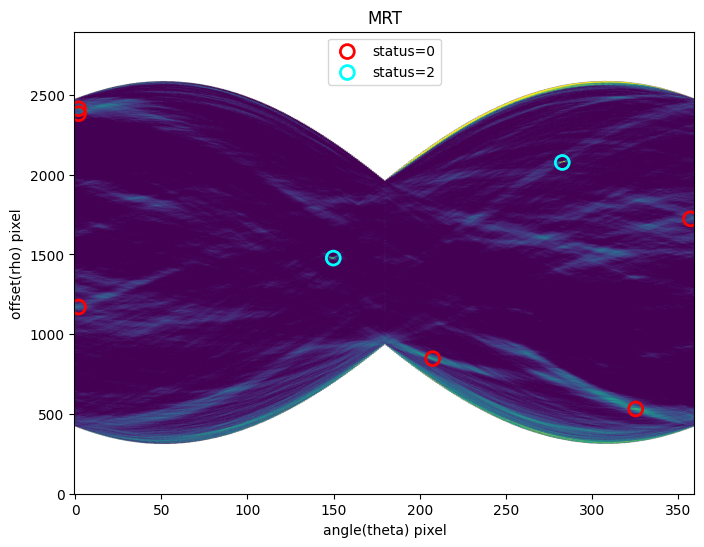

In [30]:
w.plot_mrt(show_sources=True)

Lastly, we generate the mask

<Axes: title={'center': 'Mask'}>

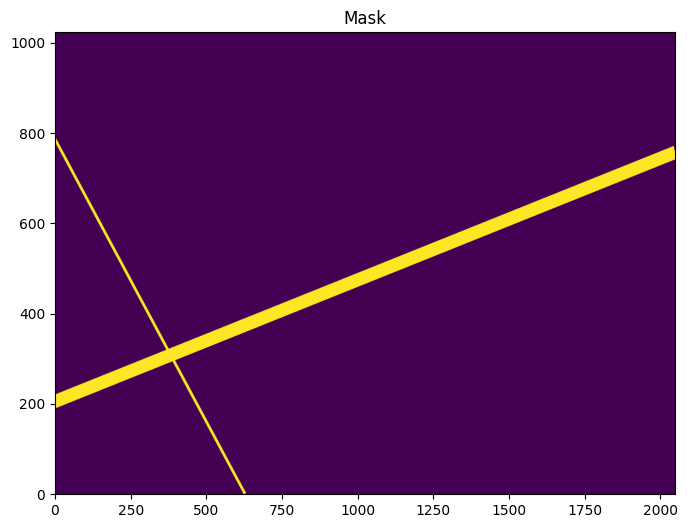

In [31]:
w.make_mask()
w.plot_mask()

If you're really feeling very confident, you can run everything in a single line by setting `execute=True`.

In [32]:
w = WfcWrapper('jc8m32j5q_flc.fits', binsize=2, extension=4, output_root='example3', processes=8,
               execute=True)

INFO:findsat_mrt:image type is flc


INFO:findsat_mrt:masking bad pixels


INFO:findsat_mrt:Subtracting median background


INFO:findsat_mrt:Rebinning the data by 2


INFO:findsat_mrt:Running the trailfinding pipeline


INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 2


INFO:findsat_mrt:2 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 4


INFO:findsat_mrt:4 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 8


INFO:findsat_mrt:8 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:8 final sources found


INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 24.91901233219658
baseline noise: 1.1599717411425965
snr of feature = 20.48243051822179


INFO:utils_findsat_mrt:width of feature = 27.884750187194527


INFO:utils_findsat_mrt:breaking into 21.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.03705873746593
baseline noise: 5.826863097404741
snr of feature = 3.640071044316816


INFO:utils_findsat_mrt:width of feature = 26.713511257870408


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.640071044316816, 26.713511257870408, 256.76860969165995


INFO:utils_findsat_mrt:Checking persistence, step 2 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.244678352001124
baseline noise: 4.402650211842503
snr of feature = 7.232468310679803


INFO:utils_findsat_mrt:width of feature = 26.50427369135045


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.232468310679803, 26.50427369135045, 256.26522781873535


INFO:utils_findsat_mrt:Checking persistence, step 3 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.287148194468173
baseline noise: 4.621798505573731
snr of feature = 5.120376766826775


INFO:utils_findsat_mrt:width of feature = 23.55101725455205


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.120376766826775, 23.55101725455205, 254.5747255153079


INFO:utils_findsat_mrt:Checking persistence, step 4 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.494867113821286
baseline noise: 5.15769772585319
snr of feature = 6.075805728375499


INFO:utils_findsat_mrt:width of feature = 24.861570742149155


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.075805728375499, 24.861570742149155, 253.13957432396901


INFO:utils_findsat_mrt:Checking persistence, step 5 of 21


INFO:utils_findsat_mrt:amplitude of feature: 35.81167669062658
baseline noise: 4.470593816496017
snr of feature = 7.010496627648276


INFO:utils_findsat_mrt:width of feature = 31.868599951280714


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.010496627648276, 31.868599951280714, 251.1916945118899


INFO:utils_findsat_mrt:Checking persistence, step 6 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.915471193913454
baseline noise: 3.8312234517866752
snr of feature = 6.5473204728972


INFO:utils_findsat_mrt:width of feature = 22.799211957200896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.5473204728972, 22.799211957200896, 251.76332885711122


INFO:utils_findsat_mrt:Checking persistence, step 7 of 21


INFO:utils_findsat_mrt:amplitude of feature: 25.877867164545034
baseline noise: 5.550649020374766
snr of feature = 3.6621335756512714


INFO:utils_findsat_mrt:width of feature = 18.836659382442974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6621335756512714, 18.836659382442974, 251.01462298583013


INFO:utils_findsat_mrt:Checking persistence, step 8 of 21


INFO:utils_findsat_mrt:amplitude of feature: 38.87192450681591
baseline noise: 4.785656302620057
snr of feature = 7.122590100240642


INFO:utils_findsat_mrt:width of feature = 23.993282189725676


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.122590100240642, 23.993282189725676, 250.79898239162415


INFO:utils_findsat_mrt:Checking persistence, step 9 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.350705954680773
baseline noise: 8.932095152668488
snr of feature = 2.397938046552652


INFO:utils_findsat_mrt:width of feature = 20.180662177282215


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.397938046552652, 20.180662177282215, 250.62084244948812


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 21


INFO:utils_findsat_mrt:amplitude of feature: 42.11760035536503
baseline noise: 5.134782477458223
snr of feature = 7.202411794513588


INFO:utils_findsat_mrt:width of feature = 43.23708127246249


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.202411794513588, 43.23708127246249, 250.982387145292


INFO:utils_findsat_mrt:Checking persistence, step 11 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.192129079034686
baseline noise: 5.408442303337759
snr of feature = 4.212615296207604


INFO:utils_findsat_mrt:width of feature = 29.71446898615713


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.212615296207604, 29.71446898615713, 251.57353413396677


INFO:utils_findsat_mrt:Checking persistence, step 12 of 21


INFO:utils_findsat_mrt:amplitude of feature: 33.16741874505417
baseline noise: 4.7456452923747445
snr of feature = 5.989021871977505


INFO:utils_findsat_mrt:width of feature = 27.699596942029217


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.989021871977505, 27.699596942029217, 250.09797748122918


INFO:utils_findsat_mrt:Checking persistence, step 13 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.19126941332115
baseline noise: 3.9522870667098746
snr of feature = 5.879882193364265


INFO:utils_findsat_mrt:width of feature = 23.683416894834124


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.879882193364265, 23.683416894834124, 251.0578187698829


INFO:utils_findsat_mrt:Checking persistence, step 14 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.11413047889569
baseline noise: 5.567317420169788
snr of feature = 4.409091705422697


INFO:utils_findsat_mrt:width of feature = 21.5101409131114


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.409091705422697, 21.5101409131114, 252.0983111587293


INFO:utils_findsat_mrt:Checking persistence, step 15 of 21


INFO:utils_findsat_mrt:amplitude of feature: 36.65403140519979
baseline noise: 4.3490226161882655
snr of feature = 7.4281077934070385


INFO:utils_findsat_mrt:width of feature = 27.795305847487043


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.4281077934070385, 27.795305847487043, 252.14654772964332


INFO:utils_findsat_mrt:Checking persistence, step 16 of 21


INFO:utils_findsat_mrt:amplitude of feature: 30.54021263092259
baseline noise: 4.189060759029188
snr of feature = 6.29046781312388


INFO:utils_findsat_mrt:width of feature = 151.33145200889967


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.29046781312388, 151.33145200889967, 230.17481998457873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 21


INFO:utils_findsat_mrt:amplitude of feature: 27.208224797167123
baseline noise: 6.852619777027433
snr of feature = 2.970485111165712


INFO:utils_findsat_mrt:width of feature = 20.43624118766425


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.970485111165712, 20.43624118766425, 253.9314316855635


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 21


INFO:utils_findsat_mrt:amplitude of feature: 34.22286128634556
baseline noise: 4.845571428800304
snr of feature = 6.06270907140846


INFO:utils_findsat_mrt:width of feature = 25.46174859668656


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.06270907140846, 25.46174859668656, 255.50095085536168


INFO:utils_findsat_mrt:Checking persistence, step 19 of 21


INFO:utils_findsat_mrt:amplitude of feature: 29.192894474814807
baseline noise: 3.869212292208175
snr of feature = 6.544919293677293


INFO:utils_findsat_mrt:width of feature = 24.646671963207183


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.544919293677293, 24.646671963207183, 256.13291664295923


INFO:utils_findsat_mrt:Checking persistence, step 20 of 21


INFO:utils_findsat_mrt:amplitude of feature: 28.2940384176147
baseline noise: 6.039703403821467
snr of feature = 3.6846734890511965


INFO:utils_findsat_mrt:width of feature = 27.79340175674031


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6846734890511965, 27.79340175674031, 257.0501151764149


INFO:utils_findsat_mrt:Checking persistence, step 21 of 21


INFO:utils_findsat_mrt:amplitude of feature: 31.90903196622079
baseline noise: 4.975004996785656
snr of feature = 5.413869330148849


INFO:utils_findsat_mrt:width of feature = 29.22578246312756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.413869330148849, 29.22578246312756, 258.2189906155948


INFO:utils_findsat_mrt:Number of sections analyzed: 21
Number of sections that passed: 18
persistance score: 0.8571428571428571


INFO:utils_findsat_mrt:amplitude of feature: 138.83213937337246
baseline noise: 1.6174674807929328
snr of feature = 84.83303282568168


INFO:utils_findsat_mrt:width of feature = 5.9021167179136


INFO:utils_findsat_mrt:breaking into 10.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 10


INFO:utils_findsat_mrt:amplitude of feature: 433.16340522514486
baseline noise: 4.903654247210612
snr of feature = 87.33481795164185


INFO:utils_findsat_mrt:width of feature = 3.9161650995320088


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 87.33481795164185, 3.9161650995320088, 252.1346813627035


INFO:utils_findsat_mrt:Checking persistence, step 2 of 10


INFO:utils_findsat_mrt:amplitude of feature: 383.97346178152355
baseline noise: 6.721185310845502
snr of feature = 56.128831303301915


INFO:utils_findsat_mrt:width of feature = 3.94971949120054


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 56.128831303301915, 3.94971949120054, 251.953139178627


INFO:utils_findsat_mrt:Checking persistence, step 3 of 10


INFO:utils_findsat_mrt:amplitude of feature: 296.52186635552397
baseline noise: 5.675942277457832
snr of feature = 51.24187489241551


INFO:utils_findsat_mrt:width of feature = 3.9379876433011987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.24187489241551, 3.9379876433011987, 251.77689582305533


INFO:utils_findsat_mrt:Checking persistence, step 4 of 10


INFO:utils_findsat_mrt:amplitude of feature: 212.36062878785052
baseline noise: 4.119664732062721
snr of feature = 50.54803669703513


INFO:utils_findsat_mrt:width of feature = 4.03711100235455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 50.54803669703513, 4.03711100235455, 251.54386506391668


INFO:utils_findsat_mrt:Checking persistence, step 5 of 10


INFO:utils_findsat_mrt:amplitude of feature: 231.2078074995514
baseline noise: 4.2076862665528445
snr of feature = 53.94891796886959


INFO:utils_findsat_mrt:width of feature = 4.088090574128614


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 53.94891796886959, 4.088090574128614, 251.25038694933266


INFO:utils_findsat_mrt:Checking persistence, step 6 of 10


INFO:utils_findsat_mrt:amplitude of feature: 210.77696002894572
baseline noise: 4.4701953071438
snr of feature = 46.15162214324371


INFO:utils_findsat_mrt:width of feature = 4.006562348013233


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 46.15162214324371, 4.006562348013233, 250.96064998668768


INFO:utils_findsat_mrt:Checking persistence, step 7 of 10


INFO:utils_findsat_mrt:amplitude of feature: 155.80334648021733
baseline noise: 6.017244606375362
snr of feature = 24.892805872498737


INFO:utils_findsat_mrt:width of feature = 4.119927528064807


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 24.892805872498737, 4.119927528064807, 250.64709393042088


INFO:utils_findsat_mrt:Checking persistence, step 8 of 10


INFO:utils_findsat_mrt:amplitude of feature: 157.67488144406204
baseline noise: 4.429868481111864
snr of feature = 34.59358073865137


INFO:utils_findsat_mrt:width of feature = 3.974182252058938


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 34.59358073865137, 3.974182252058938, 250.30741691030926


INFO:utils_findsat_mrt:Checking persistence, step 9 of 10


INFO:utils_findsat_mrt:amplitude of feature: 170.5575520698585
baseline noise: 5.354506822507347
snr of feature = 30.85308334148163


INFO:utils_findsat_mrt:width of feature = 4.036665645128664


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.85308334148163, 4.036665645128664, 249.88473974483546


INFO:utils_findsat_mrt:Checking persistence, step 10 of 10


INFO:utils_findsat_mrt:amplitude of feature: 159.90384266555102
baseline noise: 7.75824358349776
snr of feature = 19.610830395384323


INFO:utils_findsat_mrt:width of feature = 3.6445285397138036


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.610830395384323, 3.6445285397138036, 249.4428784737343


INFO:utils_findsat_mrt:Number of sections analyzed: 10
Number of sections that passed: 10
persistance score: 1.0


INFO:utils_findsat_mrt:amplitude of feature: 9.305581720979863
baseline noise: 1.700447857395468
snr of feature = 4.472429913395276


INFO:utils_findsat_mrt:width of feature = 78.77715210338741


INFO:utils_findsat_mrt:amplitude of feature: 9.377875060212682
baseline noise: 1.420706580551507
snr of feature = 5.600852835194349


INFO:utils_findsat_mrt:width of feature = 138.112784724486


INFO:utils_findsat_mrt:amplitude of feature: 21.583052766049114
baseline noise: 2.1189466845548
snr of feature = 9.185746023422862


INFO:utils_findsat_mrt:width of feature = 183.00189778050492


INFO:utils_findsat_mrt:amplitude of feature: 18.184018029670323
baseline noise: 1.9469261569996648
snr of feature = 8.339860150470747


INFO:utils_findsat_mrt:width of feature = 80.01176257176812


INFO:utils_findsat_mrt:amplitude of feature: 6.256153981166975
baseline noise: 1.6912847979946066
snr of feature = 2.69905410879648


INFO:utils_findsat_mrt:width of feature = 131.17717790467276


INFO:utils_findsat_mrt:amplitude of feature: 7.607646247085811
baseline noise: 1.7320507925071826
snr of feature = 3.3922766468491212


INFO:utils_findsat_mrt:width of feature = 126.54722713626336


INFO:findsat_mrt:Wrote diagnostic plot to ./example3_diagnostic.png


INFO:findsat_mrt:wrote catalog ./example3_catalog.fits


We'll plot the image and mask together to check that everything looks ok

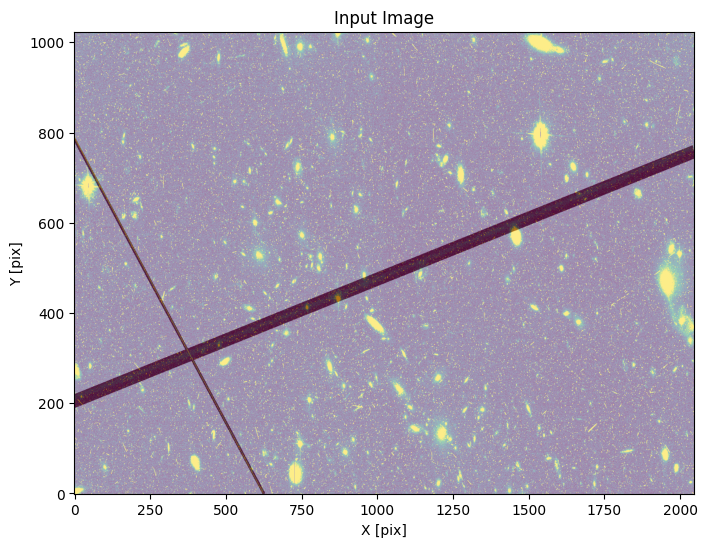

In [33]:
w.plot_image(overlay_mask=True)

<a id="example4"></a>
## Example 4: Finding trails in a DRC image

Applying `TrailFinder` to a DRC image (that shows both chips together) can boost sensitivity by increasing the number of pixels over which we search for trails. The DRC files also remove the distortion in the original FLC files (though this does not appear to create signficant curvature to most trails). 

Here, we demonstrate the steps that go into preparing a DRC image to be analyzed. The subsequent example will illustrate how to do all of this in a single line.

There are no DQ arrays for the DRC files, so we ignore the pre-processing steps that incorporated those.

In [34]:
# Read in the image files and header information
image_file = 'hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits'
ext = 1
with fits.open(image_file) as h:
    image = h[ext].data  # image data
    wht = h[ext+1].data
    image = image*wht  # wht is effective exposure time, so this turns it into counts
    
    header = h[0].header  # primary header
    image_header = h[1].header  # image header

In [35]:
# Flag anything with wht == 0 as bad
image[wht == 0] = np.nan

# Subtract the background from the image. 
median = np.nanmedian(image)
image = image - np.nanmedian(image)

In [36]:
# Let's rebin the images
binsize = 2
image_rebin = block_reduce(image, binsize, func=np.nansum)

Setting up `TrailFinder` is essentially the same as earlier examples at this point. We'll use the default settings. In fact, about all the steps from here on out are the same.

In [37]:
s4 = TrailFinder(image=image_rebin, processes=8, output_root='example4')

We can do a quick plot of our image to make sure things look ok

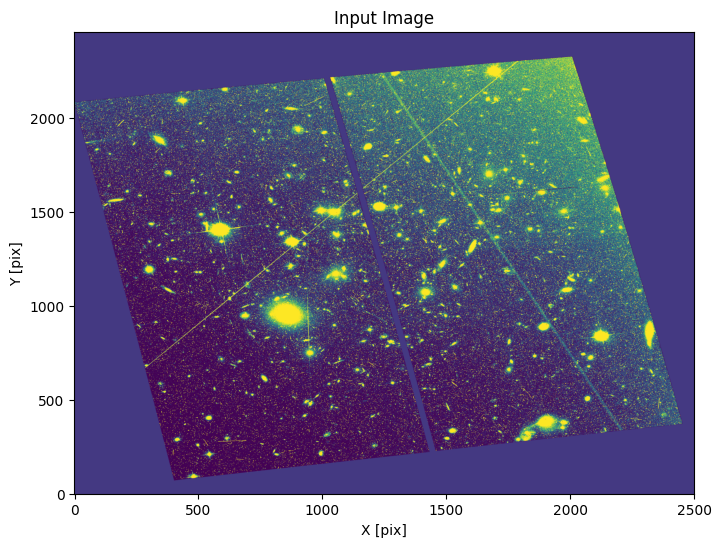

In [38]:
s4.plot_image()

Now run the MRT calculation and plot the results

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

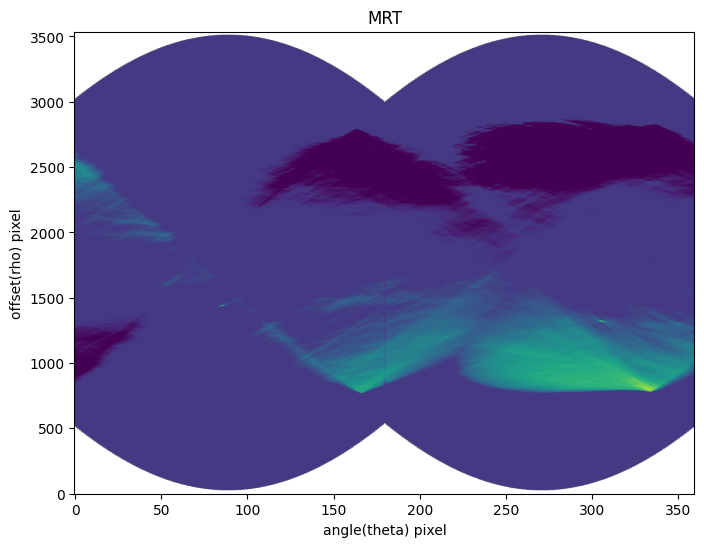

In [39]:
s4.run_mrt()
s4.plot_mrt(scale=[-1, 5])  # adjusted scale manually due to varying background in image

This example has a clear gradient in the background due to the cluster. This causes some large scale variation in the RT, but you can see the "point source" signals from the satellite trails around `x,y = (90,700)` and `x,y = (300,700)`. This is a case where we may have wanted to explore some different background subtraction methods, but we'll proceed with the simpler approach here. Now we'll try to pull the sources out.

In [40]:
s4.find_mrt_sources()

INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 55


INFO:findsat_mrt:55 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 71


INFO:findsat_mrt:71 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 115


INFO:findsat_mrt:115 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:132 final sources found


id,xcentroid,ycentroid,fwhm,roundness,pa,max_value,flux,mag,theta,rho,endpoints,status
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,"float64[2,2]",int64
1,166.32721783208842,784.1684940538514,8.973602191453235,0.7929927763188344,90.09876874004851,46.84342435924315,3720.5560553599516,-8.926519630435587,83.16360891604421,-983.8315059461486,0.0 .. 2368.735290839114,0
2,333.6432076354589,793.2572688801874,9.569040891171944,0.7263259567479704,89.13669718728313,76.3825743184539,7806.279865768373,-9.731110293182985,166.82160381772945,-974.7427311198126,1963.5706039301645 .. 165.0363947211281,0
3,175.61780444561884,867.7276696367115,13.046961055647301,0.8082184738375734,88.83089388249948,45.33481567321613,8313.48365540505,-9.799457618211132,87.80890222280942,-900.2723303632885,0.0 .. 2176.756683554195,0
4,154.4295046603777,879.0859927513249,12.904536774645118,0.8055487056959296,90.4430856813029,40.71422256442539,6290.749706670305,-9.496756015070929,77.21475233018884,-888.9140072486751,0.0 .. 2423.1683391469733,0
5,346.4122125373008,887.0445575489371,13.093110162843493,0.8147677475979815,88.07789094740343,40.615109728468425,7068.79028669394,-9.623362743556767,173.2061062686504,-880.9554424510629,1990.8877469267231 .. 0.0,0
6,351.51266885543384,933.8275482833056,13.11462510188775,0.8078954493863921,89.04939897309667,45.18588633020711,7732.016285019465,-9.720731900149774,175.75633442771692,-834.1724517166944,1995.346078053643 .. 0.0,0
7,147.42262209344173,935.7815374300178,12.868504634261983,0.7959994098461818,90.66878883115115,30.34705573503544,4683.488703951451,-9.176423692744612,73.71131104672087,-832.2184625699822,0.0 .. 2456.0,0
8,226.48972268527612,937.2186504634244,12.504573345682966,0.8681221049378461,87.93332909729993,22.488902275373288,2165.219402464102,-8.338754775339703,113.24486134263806,-830.7813495365756,496.0937700601969 .. 1595.2668286343912,0
9,144.34893983735887,962.7667208646262,12.906338478521544,0.7970467505539025,91.53018560508164,28.953800142787117,4142.598803976293,-9.043182188630652,72.17446991867943,-805.2332791353738,0.0 .. 2456.0,0


And below we plot the MRT with the sources overlaid

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

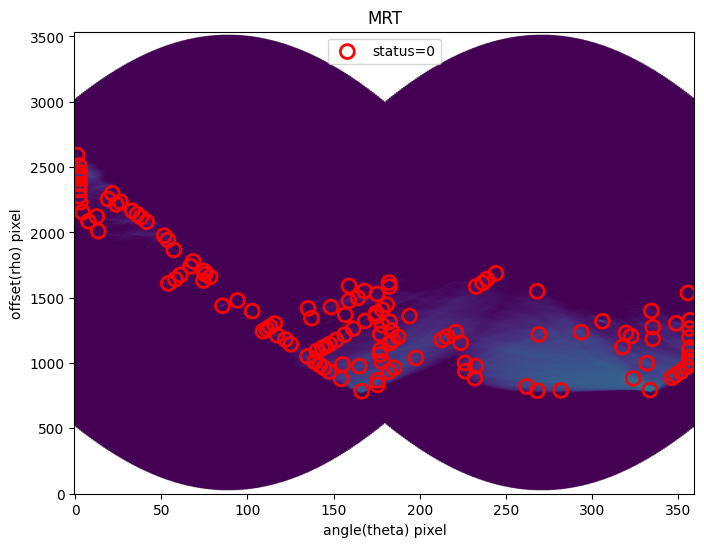

In [41]:
s4.plot_mrt(show_sources=True)

It's clearly shredding those large-scale features quite a bit, but we'll try to filter these out.

In [42]:
s4.filter_sources()

INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


INFO:utils_findsat_mrt:amplitude of feature: 16.208285690280974
baseline noise: 1.6172758672109555
snr of feature = 9.021967197366697


INFO:utils_findsat_mrt:width of feature = 144.80575964918472


INFO:utils_findsat_mrt:amplitude of feature: 25.22710728350288
baseline noise: 2.210161065974164
snr of feature = 10.414148802039286


INFO:utils_findsat_mrt:width of feature = 141.51882217193767


INFO:utils_findsat_mrt:amplitude of feature: 12.313749771449656
baseline noise: 1.2335773730176174
snr of feature = 8.98214626888572


INFO:utils_findsat_mrt:width of feature = 186.59900643788762


INFO:utils_findsat_mrt:amplitude of feature: 12.24406634832183
baseline noise: 1.2255150804901478
snr of feature = 8.99095526709046


INFO:utils_findsat_mrt:width of feature = 128.73520942919734


INFO:utils_findsat_mrt:amplitude of feature: 9.54934994537133
baseline noise: 1.9120028823888076
snr of feature = 3.994422358527314


INFO:utils_findsat_mrt:width of feature = 176.87821954249378


INFO:utils_findsat_mrt:amplitude of feature: 11.74398256298138
baseline noise: 1.209426688325294
snr of feature = 8.710371597011305


INFO:utils_findsat_mrt:width of feature = 183.07901163478533


INFO:utils_findsat_mrt:amplitude of feature: 7.132099531325378
baseline noise: 0.5718788935667231
snr of feature = 11.471345964253972


INFO:utils_findsat_mrt:width of feature = 201.5464416994892


INFO:utils_findsat_mrt:amplitude of feature: -2.6565352353666576
baseline noise: 1.1695375989081245
snr of feature = -3.271440642735033


INFO:utils_findsat_mrt:width of feature = 22.04794805171855


INFO:utils_findsat_mrt:amplitude of feature: 6.1303108532614505
baseline noise: 0.44178035668937715
snr of feature = 12.876377164437327


INFO:utils_findsat_mrt:width of feature = 202.464838739502


INFO:utils_findsat_mrt:amplitude of feature: 6.019487325292896
baseline noise: 0.5681512238182345
snr of feature = 9.594868184634375


INFO:utils_findsat_mrt:width of feature = 195.43938216937596


INFO:utils_findsat_mrt:amplitude of feature: 8.850155806028638
baseline noise: 1.021692588368408
snr of feature = 7.662249199792958


INFO:utils_findsat_mrt:width of feature = 180.09919458246483


INFO:utils_findsat_mrt:amplitude of feature: 7.687122576441844
baseline noise: 0.327116996164777
snr of feature = 22.499612268907143


INFO:utils_findsat_mrt:width of feature = 228.92715384335082


INFO:utils_findsat_mrt:amplitude of feature: 5.635035139467931
baseline noise: 2.560702155563627
snr of feature = 1.2005820267791447


INFO:utils_findsat_mrt:width of feature = 150.39354504625396


INFO:utils_findsat_mrt:amplitude of feature: 9.48484327469857
baseline noise: 0.4103465066794071
snr of feature = 22.11422936544901


INFO:utils_findsat_mrt:width of feature = 157.98913622013174


INFO:utils_findsat_mrt:amplitude of feature: 2.6031909637254094
baseline noise: 0.9824057842440885
snr of feature = 1.6498123336360777


INFO:utils_findsat_mrt:width of feature = 17.885212526783192


INFO:utils_findsat_mrt:amplitude of feature: 5.426989582174384
baseline noise: 1.3836631597558584
snr of feature = 2.922189836384712


INFO:utils_findsat_mrt:width of feature = 163.91003390669027


INFO:utils_findsat_mrt:amplitude of feature: 2.5988515553454015
baseline noise: 1.8122150617274306
snr of feature = 0.4340745810092413


INFO:utils_findsat_mrt:width of feature = 1.7017198699914502


INFO:utils_findsat_mrt:amplitude of feature: 2.0267920907600114
baseline noise: 1.2620280429857675
snr of feature = 0.6059802331847776


INFO:utils_findsat_mrt:width of feature = 17.16523717284116


INFO:utils_findsat_mrt:amplitude of feature: 4.63444058182633
baseline noise: 0.9204970323448695
snr of feature = 4.034715397202943


INFO:utils_findsat_mrt:width of feature = 125.54488270013653


INFO:utils_findsat_mrt:amplitude of feature: 3.089907858498516
baseline noise: 0.6833587351494433
snr of feature = 3.5216482932976425


INFO:utils_findsat_mrt:width of feature = 35.46604938348753


INFO:utils_findsat_mrt:amplitude of feature: 6.608084622975218
baseline noise: 0.49569536637927075
snr of feature = 12.330938861185931


INFO:utils_findsat_mrt:width of feature = 77.42478700925852


INFO:utils_findsat_mrt:amplitude of feature: 0.3266771016682606
baseline noise: 1.012866203713408
snr of feature = -0.677472601543437


INFO:utils_findsat_mrt:width of feature = 15.361611107101794


INFO:utils_findsat_mrt:amplitude of feature: 4.515195182584699
baseline noise: 0.95370036281277
snr of feature = 3.734395999670097


INFO:utils_findsat_mrt:width of feature = 24.30232803612921


INFO:utils_findsat_mrt:amplitude of feature: 6.201847403472333
baseline noise: 0.18293167272902572
snr of feature = 32.90253481505659


INFO:utils_findsat_mrt:width of feature = 243.34642679417692


INFO:utils_findsat_mrt:amplitude of feature: 4.385287728277726
baseline noise: 0.7768068488371703
snr of feature = 4.645274285161387


INFO:utils_findsat_mrt:width of feature = 28.80670866332227


INFO:utils_findsat_mrt:amplitude of feature: 4.272328476626104
baseline noise: 0.5154280235529096
snr of feature = 7.288894436077439


INFO:utils_findsat_mrt:width of feature = 45.42994373079594


INFO:utils_findsat_mrt:breaking into 5.0 sections for persistence check
Section size for persistence check: 508.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 5


INFO:utils_findsat_mrt:amplitude of feature: 8.949134411381962
baseline noise: 0.884648831719057
snr of feature = 9.116030328092934


INFO:utils_findsat_mrt:width of feature = 264.48101466601247


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.116030328092934, 264.48101466601247, 238.84809086442414


INFO:utils_findsat_mrt:Checking persistence, step 2 of 5


INFO:utils_findsat_mrt:amplitude of feature: 11.09033646813045
baseline noise: 1.9766123090370031
snr of feature = 4.610779826385688


INFO:utils_findsat_mrt:width of feature = 206.71185190948765


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.610779826385688, 206.71185190948765, 246.3868839067012


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 5


INFO:utils_findsat_mrt:amplitude of feature: 6.83995699562516
baseline noise: 3.0154278542133475
snr of feature = 1.2683205589110471


INFO:utils_findsat_mrt:width of feature = 264.2098513486029


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2683205589110471, 264.2098513486029, 238.89128916177188


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 5


INFO:utils_findsat_mrt:amplitude of feature: 4.704249673285034
baseline noise: 2.5642737882617106
snr of feature = 0.8345348670720478


INFO:utils_findsat_mrt:width of feature = 264.0318477954802


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8345348670720478, 264.0318477954802, 238.79878516917498


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 5


INFO:utils_findsat_mrt:amplitude of feature: 13.690553649629912
baseline noise: 5.846474217268193
snr of feature = 1.3416769048931034


INFO:utils_findsat_mrt:width of feature = 264.30497767475094


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3416769048931034, 264.30497767475094, 238.74698503997604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 5
Number of sections that passed: 1
persistance score: 0.2


INFO:utils_findsat_mrt:amplitude of feature: 4.85431321657824
baseline noise: 0.8112412149866252
snr of feature = 4.98380990376367


INFO:utils_findsat_mrt:width of feature = 27.166713803263576


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 6.732902526855469
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 112.18197576807924


INFO:utils_findsat_mrt:amplitude of feature: 6.652388069435236
baseline noise: 0.7660928950985356
snr of feature = 7.683526648004744


INFO:utils_findsat_mrt:width of feature = 64.22308445020596


INFO:utils_findsat_mrt:breaking into 6.0 sections for persistence check
Section size for persistence check: 411.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 6


INFO:utils_findsat_mrt:amplitude of feature: 1.8860461200106435
baseline noise: 3.278271494968639
snr of feature = -0.424682756475395


INFO:utils_findsat_mrt:width of feature = 36.92961644912626


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.424682756475395, 36.92961644912626, 256.526243570288


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 6


INFO:utils_findsat_mrt:amplitude of feature: 12.346557324240223
baseline noise: 2.0902465699701147
snr of feature = 4.906746841075667


INFO:utils_findsat_mrt:width of feature = 74.96316717602474


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.906746841075667, 74.96316717602474, 256.18824045391875


INFO:utils_findsat_mrt:Checking persistence, step 3 of 6


INFO:utils_findsat_mrt:amplitude of feature: 13.277910898327129
baseline noise: 3.365259454552475
snr of feature = 2.9455831200072726


INFO:utils_findsat_mrt:width of feature = 93.56172606008587


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9455831200072726, 93.56172606008587, 256.7425510355414


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 6


INFO:utils_findsat_mrt:amplitude of feature: 5.808856852338464
baseline noise: 2.315948228483866
snr of feature = 1.5081980593932482


INFO:utils_findsat_mrt:width of feature = 40.1253612726681


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5081980593932482, 40.1253612726681, 292.1501360190215


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 6


INFO:utils_findsat_mrt:amplitude of feature: 15.866054578127937
baseline noise: 1.815577413070377
snr of feature = 7.738847742821596


INFO:utils_findsat_mrt:width of feature = 70.49179711339735


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.738847742821596, 70.49179711339735, 243.51687807416468


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 6


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 74.96316717602474


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 74.96316717602474, 256.18824045391875


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 6
Number of sections that passed: 1
persistance score: 0.16666666666666666


INFO:utils_findsat_mrt:amplitude of feature: 27.457925797322886
baseline noise: 0.674587673977844
snr of feature = 39.703272319536495


INFO:utils_findsat_mrt:width of feature = 21.317062930571836


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 21.317062930571836


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 21.317062930571836, 250.6351307292361


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 21.317062930571836


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 21.317062930571836, 250.6351307292361


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.062624294489342
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.6351307292361


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 29.680666230856957
baseline noise: 5.287224183374922
snr of feature = 4.6136576020711315


INFO:utils_findsat_mrt:width of feature = 18.1116574516482


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.6136576020711315, 18.1116574516482, 250.6351307292361


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 37.35992917174599
baseline noise: 4.516420066138839
snr of feature = 7.2720226694249


INFO:utils_findsat_mrt:width of feature = 24.358748172043846


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.2720226694249, 24.358748172043846, 250.6351307292361


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 35.707062247410946
baseline noise: 4.853040933447854
snr of feature = 6.357667643252863


INFO:utils_findsat_mrt:width of feature = 27.228264535200367


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.357667643252863, 27.228264535200367, 249.15455964746403


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 40.04911878879987
baseline noise: 4.115829520541768
snr of feature = 8.730509630906239


INFO:utils_findsat_mrt:width of feature = 25.28724296947769


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.730509630906239, 25.28724296947769, 249.1210263991165


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 38.61229857743999
baseline noise: 4.693572409969694
snr of feature = 7.226633192112465


INFO:utils_findsat_mrt:width of feature = 28.650708944758634


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.226633192112465, 28.650708944758634, 248.48127259684006


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 30.695314179525667
baseline noise: 4.746530849598442
snr of feature = 5.466894486132435


INFO:utils_findsat_mrt:width of feature = 17.858198177101997


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.466894486132435, 17.858198177101997, 250.12278618510797


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 30.684591015647243
baseline noise: 7.673147493969925
snr of feature = 2.998957538579997


INFO:utils_findsat_mrt:width of feature = 17.414965867505657


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.998957538579997, 17.414965867505657, 248.93135617952709


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 40.07789619314681
baseline noise: 8.056506207353614
snr of feature = 3.97460005139269


INFO:utils_findsat_mrt:width of feature = 18.314731931684037


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.97460005139269, 18.314731931684037, 250.51603502000506


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 56.57467654521366
baseline noise: 5.7563231980674745
snr of feature = 8.828266168968247


INFO:utils_findsat_mrt:width of feature = 34.28774104671126


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.828266168968247, 34.28774104671126, 248.88092132843676


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 40.85853673328489
baseline noise: 7.540534256037411
snr of feature = 4.4185201400777485


INFO:utils_findsat_mrt:width of feature = 34.732305208694044


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.4185201400777485, 34.732305208694044, 252.40433758767608


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 34.243547277297566
baseline noise: 4.360711554492845
snr of feature = 6.852743032731989


INFO:utils_findsat_mrt:width of feature = 22.898389808636466


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.852743032731989, 22.898389808636466, 250.13960395881713


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 34.96840012868527
baseline noise: 4.581295602941672
snr of feature = 6.632862657068427


INFO:utils_findsat_mrt:width of feature = 27.189769531645908


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.632862657068427, 27.189769531645908, 249.20086385034423


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 30.304446515310214
baseline noise: 4.0023132488588855
snr of feature = 6.571732803260821


INFO:utils_findsat_mrt:width of feature = 22.280392849489544


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.571732803260821, 22.280392849489544, 251.4544419745177


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 35.81684882371312
baseline noise: 4.542114288504762
snr of feature = 6.8855014534440135


INFO:utils_findsat_mrt:width of feature = 21.284819141957485


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.8855014534440135, 21.284819141957485, 251.06681677082045


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 55.10616349861
baseline noise: 4.491381767112171
snr of feature = 11.269311841206871


INFO:utils_findsat_mrt:width of feature = 118.86560521366567


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.269311841206871, 118.86560521366567, 229.78199762886297


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 27.901805902702847
baseline noise: 6.971818776778183
snr of feature = 3.002084218774951


INFO:utils_findsat_mrt:width of feature = 18.959109414058645


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.002084218774951, 18.959109414058645, 251.25362645981934


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 28.22452000921179
baseline noise: 6.015732420099878
snr of feature = 3.6917844807903184


INFO:utils_findsat_mrt:width of feature = 18.730887146897658


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6917844807903184, 18.730887146897658, 251.62765770544848


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 33.59858192533252
baseline noise: 4.186314674220063
snr of feature = 7.025813762218471


INFO:utils_findsat_mrt:width of feature = 27.156529353008125


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.025813762218471, 27.156529353008125, 251.70660087903812


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 32.146885756127936
baseline noise: 5.60415814824516
snr of feature = 4.736255991668284


INFO:utils_findsat_mrt:width of feature = 23.27833095652167


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.736255991668284, 23.27833095652167, 251.80171988296934


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 32.141661230386404
baseline noise: 6.739013819814819
snr of feature = 3.769490327483796


INFO:utils_findsat_mrt:width of feature = 31.28256938943997


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.769490327483796, 31.28256938943997, 250.90445995701114


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 16.194197130359708
baseline noise: 1.3290329153414637
snr of feature = 11.18494812538107


INFO:utils_findsat_mrt:width of feature = 18.27211202638219


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.18494812538107, 18.27211202638219, 252.21516303197157


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.27211202638219


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.27211202638219, 252.21516303197157


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise


INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.27211202638219


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.27211202638219, 252.21516303197157


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise


INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.27211202638219


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.27211202638219, 252.21516303197157


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 18
persistance score: 0.6666666666666666


INFO:utils_findsat_mrt:amplitude of feature: 3.594810903435483
baseline noise: 0.5314551652676983
snr of feature = 5.764090629591957


INFO:utils_findsat_mrt:width of feature = 22.702709091310595


INFO:utils_findsat_mrt:breaking into 3.0 sections for persistence check
Section size for persistence check: 837.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 3


INFO:utils_findsat_mrt:amplitude of feature: 7.308001928775762
baseline noise: 2.0092699471201008
snr of feature = 2.6371429031974363


INFO:utils_findsat_mrt:width of feature = 45.20929936433731


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.6371429031974363, 45.20929936433731, 246.97786441160036


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 3


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.1813701580773555
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 247.01515546091062


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 3


INFO:utils_findsat_mrt:amplitude of feature: 6.488106712980891
baseline noise: 2.3287261303151867
snr of feature = 1.7861183968862597


INFO:utils_findsat_mrt:width of feature = 46.78584049056809


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7861183968862597, 46.78584049056809, 247.28308160771653


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 3
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.5963086927651065
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:amplitude of feature: 193.83098268971554
baseline noise: 0.30658162032687136
snr of feature = 631.2328862475732


INFO:utils_findsat_mrt:width of feature = 4.312030017093207


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.312030017093207


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.312030017093207, 250.55959526948493


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.312030017093207


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.312030017093207, 250.55959526948493


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.312030017093207


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.312030017093207, 250.55959526948493


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: 17.650943080212386
baseline noise: 1.603936081048981
snr of feature = 10.004767140513849


INFO:utils_findsat_mrt:width of feature = 382.28977940729817


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.004767140513849, 382.28977940729817, 250.55959526948493


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 221.90481746742526
baseline noise: 5.455796678920442
snr of feature = 39.6732197929587


INFO:utils_findsat_mrt:width of feature = 5.775791622196607


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 39.6732197929587, 5.775791622196607, 250.55959526948493


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 298.9851574499957
baseline noise: 5.071596619043215
snr of feature = 57.95286630788884


INFO:utils_findsat_mrt:width of feature = 4.135294287274974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 57.95286630788884, 4.135294287274974, 249.96436303887052


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 380.27385623206703
baseline noise: 4.010231577848409
snr of feature = 93.82590938952548


INFO:utils_findsat_mrt:width of feature = 4.055205707291407


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 93.82590938952548, 4.055205707291407, 250.06035456205564


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 484.8424306391505
baseline noise: 3.498185446174355
snr of feature = 137.59826418561607


INFO:utils_findsat_mrt:width of feature = 4.079448423762756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 137.59826418561607, 4.079448423762756, 250.10632131241545


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 551.3566153864655
baseline noise: 4.177302306729668
snr of feature = 130.98867951170914


INFO:utils_findsat_mrt:width of feature = 4.089616883645249


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 130.98867951170914, 4.089616883645249, 250.15914013435184


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 543.461791859683
baseline noise: 6.175148564919319
snr of feature = 87.00788938861481


INFO:utils_findsat_mrt:width of feature = 4.25036611556709


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 87.00788938861481, 4.25036611556709, 250.2138247610232


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: 479.538364236563
baseline noise: 22.67855284293241
snr of feature = 20.145016066843404


INFO:utils_findsat_mrt:width of feature = 4.817004269285292


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.145016066843404, 4.817004269285292, 250.26160941666873


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 331.69464103538184
baseline noise: 5.261231982893182
snr of feature = 62.04505144686302


INFO:utils_findsat_mrt:width of feature = 4.290761450118794


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 62.04505144686302, 4.290761450118794, 250.31666709535526


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 258.1922520165798
baseline noise: 7.152416356319405
snr of feature = 35.09860488455179


INFO:utils_findsat_mrt:width of feature = 4.323289142093131


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 35.09860488455179, 4.323289142093131, 250.36279585406126


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 240.2040328689255
baseline noise: 7.87525858806475
snr of feature = 29.501097860197724


INFO:utils_findsat_mrt:width of feature = 111.96107484681161


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 29.501097860197724, 111.96107484681161, 254.6860849961544


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 163.3141581741681
baseline noise: 5.932920454450589
snr of feature = 26.526773606353974


INFO:utils_findsat_mrt:width of feature = 4.124666895696635


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 26.526773606353974, 4.124666895696635, 250.48619371830355


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 297.3340116130814
baseline noise: 4.874763976791696
snr of feature = 59.99454517770733


INFO:utils_findsat_mrt:width of feature = 161.8794056318819


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 59.99454517770733, 161.8794056318819, 254.6108606140002


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: 198.16569377198738
baseline noise: 6.315760331659729
snr of feature = 30.376379622674992


INFO:utils_findsat_mrt:width of feature = 4.2287104219972775


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.376379622674992, 4.2287104219972775, 250.60527741847233


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 185.93075577995916
baseline noise: 5.743873722073923
snr of feature = 31.370272185027375


INFO:utils_findsat_mrt:width of feature = 3.991430815704746


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 31.370272185027375, 3.991430815704746, 250.65624998708034


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 185.05676235872875
baseline noise: 4.493167626706966
snr of feature = 40.186258277739014


INFO:utils_findsat_mrt:width of feature = 4.194119194724863


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 40.186258277739014, 4.194119194724863, 250.72735228359537


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 171.9748163821862
baseline noise: 4.549752735886009
snr of feature = 36.79871706559811


INFO:utils_findsat_mrt:width of feature = 4.177139939733024


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 36.79871706559811, 4.177139939733024, 250.74549494892506


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 184.98932936615063
baseline noise: 5.578098909997063
snr of feature = 32.16350827602088


INFO:utils_findsat_mrt:width of feature = 4.3176246282077955


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 32.16350827602088, 4.3176246282077955, 250.81618864272184


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 224.25118887296227
baseline noise: 4.859312696348773
snr of feature = 45.14874631168762


INFO:utils_findsat_mrt:width of feature = 4.097893980203821


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 45.14874631168762, 4.097893980203821, 250.90597895442275


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 271.38565611764307
baseline noise: 4.178109253206703
snr of feature = 63.95417895292095


INFO:utils_findsat_mrt:width of feature = 4.237051668614583


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 63.95417895292095, 4.237051668614583, 250.9530782457457


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 308.96852375497986
baseline noise: 4.673257983041768
snr of feature = 65.11415951701342


INFO:utils_findsat_mrt:width of feature = 4.047571549487941


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 65.11415951701342, 4.047571549487941, 251.00224659161398


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 357.8369483484062
baseline noise: 7.619900760788364
snr of feature = 45.96084103743419


INFO:utils_findsat_mrt:width of feature = 3.9943428206930776


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 45.96084103743419, 3.9943428206930776, 251.11322612381466


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 470.2458759291522
baseline noise: 7.9472038703287256
snr of feature = 58.171236022374885


INFO:utils_findsat_mrt:width of feature = 4.713140259053489


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 58.171236022374885, 4.713140259053489, 251.18996399803697


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: -29.276432533379502
baseline noise: 8.373436654707398
snr of feature = -4.496346093084828


INFO:utils_findsat_mrt:width of feature = 4.174923769266741


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -4.496346093084828, 4.174923769266741, 251.1970373560525


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.10159469626742101
baseline noise: 16.075737396783243
snr of feature = -1.0063197534122292


INFO:utils_findsat_mrt:width of feature = 4.69934955174989


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0063197534122292, 4.69934955174989, 251.19145127827338


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 20
persistance score: 0.7142857142857143


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 1.7179903984069824
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.9855890296068424


INFO:utils_findsat_mrt:breaking into 29.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.9855890296068424


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.9855890296068424, 241.40771861027943


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.9855890296068424


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.9855890296068424, 241.40771861027943


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 1.139736846250474
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 241.54576076838285


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 29


INFO:utils_findsat_mrt:amplitude of feature: 26.02022750953866
baseline noise: 3.593301412175145
snr of feature = 6.241315026169138


INFO:utils_findsat_mrt:width of feature = 209.7297211636787


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.241315026169138, 209.7297211636787, 241.40771861027943


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.684400769460326
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 241.5289710770265


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 29


INFO:utils_findsat_mrt:amplitude of feature: 5.602686049375315
baseline noise: 4.461014417655242
snr of feature = 0.25592197756674084


INFO:utils_findsat_mrt:width of feature = 1.9786658725403754


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.25592197756674084, 1.9786658725403754, 241.4197176358516


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.747423095769535
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 241.5657646465362


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 29


INFO:utils_findsat_mrt:amplitude of feature: 68.32514911013233
baseline noise: 4.057818853357586
snr of feature = 15.837900256093896


INFO:utils_findsat_mrt:width of feature = 21.597934244097132


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.837900256093896, 21.597934244097132, 241.40771861027943


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 29


INFO:utils_findsat_mrt:amplitude of feature: 122.99751547278737
baseline noise: 5.581803611552015
snr of feature = 21.035443027453276


INFO:utils_findsat_mrt:width of feature = 19.61637250925122


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 21.035443027453276, 19.61637250925122, 247.2820185422227


INFO:utils_findsat_mrt:Checking persistence, step 10 of 29


INFO:utils_findsat_mrt:amplitude of feature: 99.42508194553278
baseline noise: 16.529057848159702
snr of feature = 5.015169337470888


INFO:utils_findsat_mrt:width of feature = 212.64910327987693


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.015169337470888, 212.64910327987693, 244.6572983073735


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 29


INFO:utils_findsat_mrt:amplitude of feature: 77.11802241860666
baseline noise: 5.872332359148392
snr of feature = 12.132434900157856


INFO:utils_findsat_mrt:width of feature = 19.62383126229213


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.132434900157856, 19.62383126229213, 260.9079412198923


INFO:utils_findsat_mrt:Checking persistence, step 12 of 29


INFO:utils_findsat_mrt:amplitude of feature: 28.731151581714638
baseline noise: 4.901539153777181
snr of feature = 4.861659099381893


INFO:utils_findsat_mrt:width of feature = 16.068237169904023


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.861659099381893, 16.068237169904023, 268.89023542733156


INFO:utils_findsat_mrt:Checking persistence, step 13 of 29


INFO:utils_findsat_mrt:amplitude of feature: 178.18405556795895
baseline noise: 9.22437217301227
snr of feature = 18.31665941333891


INFO:utils_findsat_mrt:width of feature = 119.11836362460224


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 18.31665941333891, 119.11836362460224, 284.9584725972356


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 29


INFO:utils_findsat_mrt:amplitude of feature: 44.14279151032492
baseline noise: 5.193086264584996
snr of feature = 7.500300064599943


INFO:utils_findsat_mrt:width of feature = 19.041334637647992


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.500300064599943, 19.041334637647992, 284.90287356007696


INFO:utils_findsat_mrt:Checking persistence, step 15 of 29


INFO:utils_findsat_mrt:amplitude of feature: 222.63955339864768
baseline noise: 5.454352829393348
snr of feature = 39.81869295269086


INFO:utils_findsat_mrt:width of feature = 160.44997084120675


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 39.81869295269086, 160.44997084120675, 301.6799705714567


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 29


INFO:utils_findsat_mrt:amplitude of feature: 56.47262908299368
baseline noise: 3.404216047092188
snr of feature = 15.589026166900142


INFO:utils_findsat_mrt:width of feature = 22.85448099216478


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.589026166900142, 22.85448099216478, 299.0377053701416


INFO:utils_findsat_mrt:Checking persistence, step 17 of 29


INFO:utils_findsat_mrt:amplitude of feature: -0.10198999741544057
baseline noise: 8.095717713088277
snr of feature = -1.0125980179929637


INFO:utils_findsat_mrt:width of feature = 15.597102757246489


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0125980179929637, 15.597102757246489, 299.3468461820694


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 29


INFO:utils_findsat_mrt:amplitude of feature: 36.381163408319004
baseline noise: 4.58874518849355
snr of feature = 6.928346838596776


INFO:utils_findsat_mrt:width of feature = 16.365852904146777


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.928346838596776, 16.365852904146777, 314.66447716262746


INFO:utils_findsat_mrt:Checking persistence, step 19 of 29


INFO:utils_findsat_mrt:amplitude of feature: 33.95099100050339
baseline noise: 5.520922292650587
snr of feature = 5.149514374744726


INFO:utils_findsat_mrt:width of feature = 14.03482413954032


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.149514374744726, 14.03482413954032, 322.874861026858


INFO:utils_findsat_mrt:Checking persistence, step 20 of 29


INFO:utils_findsat_mrt:amplitude of feature: 22.712256759890113
baseline noise: 5.448988285923702
snr of feature = 3.1681603204327637


INFO:utils_findsat_mrt:width of feature = 15.180924789687197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.1681603204327637, 15.180924789687197, 323.5460257728926


INFO:utils_findsat_mrt:Checking persistence, step 21 of 29


INFO:utils_findsat_mrt:amplitude of feature: 4.13288627530493
baseline noise: 5.7442388771943165
snr of feature = -0.28051629403623035


INFO:utils_findsat_mrt:width of feature = 15.180924789687197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.28051629403623035, 15.180924789687197, 323.5460257728926


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 29


INFO:utils_findsat_mrt:amplitude of feature: 30.82465500680224
baseline noise: 4.64514728841732
snr of feature = 5.635883233167558


INFO:utils_findsat_mrt:width of feature = 100.34925822780599


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.635883233167558, 100.34925822780599, 338.7269505625798


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 29


INFO:utils_findsat_mrt:amplitude of feature: 1.4899628179263544
baseline noise: 4.185755024365533
snr of feature = -0.6440396513285678


INFO:utils_findsat_mrt:width of feature = 15.180924789687197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6440396513285678, 15.180924789687197, 323.5460257728926


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 29


INFO:utils_findsat_mrt:amplitude of feature: 38.60591992359016
baseline noise: 4.171422943673797
snr of feature = 8.254856303204225


INFO:utils_findsat_mrt:width of feature = 217.52308094650095


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.254856303204225, 217.52308094650095, 311.52959136940353


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 29


INFO:utils_findsat_mrt:amplitude of feature: -13.421704822213528
baseline noise: 11.357073340668551
snr of feature = -2.1817925639479436


INFO:utils_findsat_mrt:width of feature = 15.180924789687197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.1817925639479436, 15.180924789687197, 323.5460257728926


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 29


INFO:utils_findsat_mrt:amplitude of feature: 65.34327433336878
baseline noise: 5.7712593715256695
snr of feature = 10.32218639414483


INFO:utils_findsat_mrt:width of feature = 211.97699916056237


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.32218639414483, 211.97699916056237, 331.28701965632195


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 29


INFO:utils_findsat_mrt:amplitude of feature: -34.80419718107231
baseline noise: 13.60094009521326
snr of feature = -3.558955258785484


INFO:utils_findsat_mrt:width of feature = 15.180924789687197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -3.558955258785484, 15.180924789687197, 323.5460257728926


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 15.180924789687197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 15.180924789687197, 323.5460257728926


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 15.180924789687197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 15.180924789687197, 323.5460257728926


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 29
Number of sections that passed: 8
persistance score: 0.27586206896551724


INFO:utils_findsat_mrt:amplitude of feature: 7.487594627163814
baseline noise: 0.03358586784966524
snr of feature = 221.93884620398293


INFO:utils_findsat_mrt:width of feature = 110.66711999242705


INFO:utils_findsat_mrt:amplitude of feature: 2.6837705196063895
baseline noise: 0.000273407711533606
snr of feature = 9815.0015478441


INFO:utils_findsat_mrt:width of feature = 35.47985710238774


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 35.47985710238774


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 35.47985710238774, 254.25775142123712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.6691696952757
baseline noise: 2.073685385882317
snr of feature = 1.2516287798831403


INFO:utils_findsat_mrt:width of feature = 33.54836115104331


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2516287798831403, 33.54836115104331, 254.25775142123712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 10.32518528654973
baseline noise: 3.6405431999477176
snr of feature = 1.8361661212255387


INFO:utils_findsat_mrt:width of feature = 28.164766154171502


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8361661212255387, 28.164766154171502, 254.25775142123712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 30.502201124362237
baseline noise: 3.642973024762598
snr of feature = 7.372886902271251


INFO:utils_findsat_mrt:width of feature = 56.04624841405655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.372886902271251, 56.04624841405655, 254.25775142123712


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 10.930884342699581
baseline noise: 4.168876022444635
snr of feature = 1.6220219272171341


INFO:utils_findsat_mrt:width of feature = 24.417534587845324


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6220219272171341, 24.417534587845324, 259.41907579971064


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1110.3567604677035
baseline noise: 5.846627513171619
snr of feature = 188.9140586545368


INFO:utils_findsat_mrt:width of feature = 95.4714294059163


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 188.9140586545368, 95.4714294059163, 227.37784382734327


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 198.18272128385655
baseline noise: 4.669636473015257
snr of feature = 41.44071726548917


INFO:utils_findsat_mrt:width of feature = 153.03001027583176


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 41.44071726548917, 153.03001027583176, 227.40405140678865


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 22.957216727574473
baseline noise: 4.47196045118607
snr of feature = 4.13359117956548


INFO:utils_findsat_mrt:width of feature = 41.50583800953535


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.13359117956548, 41.50583800953535, 253.95590981960217


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: -1.3104299584459511
baseline noise: 9.550427601259262
snr of feature = -1.137211653044013


INFO:utils_findsat_mrt:width of feature = 8.366245528444693


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.137211653044013, 8.366245528444693, 252.12066855704123


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1.8681632045828938
baseline noise: 6.259695640455653
snr of feature = -0.7015568628434293


INFO:utils_findsat_mrt:width of feature = 8.657915058526754


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7015568628434293, 8.657915058526754, 254.6725032563946


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.4643249712121
baseline noise: 16.665589440599494
snr of feature = -0.492107674836155


INFO:utils_findsat_mrt:width of feature = 17.609309400467453


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.492107674836155, 17.609309400467453, 252.32948833199904


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 26.27206829852377
baseline noise: 2.871078066777866
snr of feature = 8.15059350093124


INFO:utils_findsat_mrt:width of feature = 313.45198456124956


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.15059350093124, 313.45198456124956, 271.22086645247117


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.2185388758480213
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 254.57672243689635


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 2.0184081733705934
baseline noise: 5.0084974280789325
snr of feature = -0.5970032525014638


INFO:utils_findsat_mrt:width of feature = 17.69893707189331


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5970032525014638, 17.69893707189331, 252.7528741230882


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 28.698641263680493
baseline noise: 6.6027569383713995
snr of feature = 3.3464633836361006


INFO:utils_findsat_mrt:width of feature = 88.54265174986165


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.3464633836361006, 88.54265174986165, 286.61932962116794


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 2.4090206700586823
baseline noise: 5.088601814636867
snr of feature = -0.5265849524461966


INFO:utils_findsat_mrt:width of feature = 21.794700143020577


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5265849524461966, 21.794700143020577, 255.72177948151108


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 19.708933003164226
baseline noise: 7.550339134707192
snr of feature = 1.610337449951982


INFO:utils_findsat_mrt:width of feature = 4.843382202474913


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.610337449951982, 4.843382202474913, 258.5152150792722


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3.0824235887749687
baseline noise: 7.302897384690242
snr of feature = -0.5779177186253573


INFO:utils_findsat_mrt:width of feature = 25.493298975830896


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5779177186253573, 25.493298975830896, 252.1456336506823


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 37.4908575946517
baseline noise: 4.689757150190614
snr of feature = 6.994200209946456


INFO:utils_findsat_mrt:width of feature = 81.47407586276648


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.994200209946456, 81.47407586276648, 254.75266041863793


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 9.300408744336849
baseline noise: 6.03592581919434
snr of feature = 0.5408421214789291


INFO:utils_findsat_mrt:width of feature = 20.159141927680707


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5408421214789291, 20.159141927680707, 251.52370033854163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 22.439141086809915
baseline noise: 3.9407873939896487
snr of feature = 4.694075534506964


INFO:utils_findsat_mrt:width of feature = 135.62751890119037


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.694075534506964, 135.62751890119037, 261.77037557108235


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.8398340897902
baseline noise: 4.623312939661932
snr of feature = 3.0749640648741847


INFO:utils_findsat_mrt:width of feature = 138.15375986940228


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0749640648741847, 138.15375986940228, 259.257659903488


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.9726111362789922
baseline noise: 2.3065588579962317
snr of feature = -0.5783280652443766


INFO:utils_findsat_mrt:width of feature = 222.98494414780626


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5783280652443766, 222.98494414780626, 282.86463239531537


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 41.50583800953535


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 41.50583800953535, 253.95590981960217


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 41.50583800953535


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 41.50583800953535, 253.95590981960217


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 2
persistance score: 0.08


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 3.9463958740234375
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 26.790972199390524


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 26.790972199390524


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 26.790972199390524, 250.19285198298948


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: -2.2737786542956115
baseline noise: 12.6292662328387
snr of feature = -1.1800404403846771


INFO:utils_findsat_mrt:width of feature = 12.381456653722438


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1800404403846771, 12.381456653722438, 250.61891337510724


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 34.36852926437831
baseline noise: 9.263419595566386
snr of feature = 2.710134136731495


INFO:utils_findsat_mrt:width of feature = 154.0270250915435


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.710134136731495, 154.0270250915435, 257.50173204604346


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 23.386267914000427
baseline noise: 4.424435796702874
snr of feature = 4.285706243365102


INFO:utils_findsat_mrt:width of feature = 36.88616460139866


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.285706243365102, 36.88616460139866, 250.19285198298948


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 7.3939674782940585
baseline noise: 4.047382230190663
snr of feature = 0.8268517915457039


INFO:utils_findsat_mrt:width of feature = 36.10073367285142


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8268517915457039, 36.10073367285142, 249.1378980274109


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 18.93012380310195
baseline noise: 4.00712370509114
snr of feature = 3.7241176455448093


INFO:utils_findsat_mrt:width of feature = 100.43356616002234


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.7241176455448093, 100.43356616002234, 256.2338636523175


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 28.394831971804948
baseline noise: 4.618446338770938
snr of feature = 5.148135084614058


INFO:utils_findsat_mrt:width of feature = 84.98808067783611


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.148135084614058, 84.98808067783611, 238.62950882592025


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 17.608494639587832
baseline noise: 4.318289762459272
snr of feature = 3.0776547217062546


INFO:utils_findsat_mrt:width of feature = 56.67719564175462


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0776547217062546, 56.67719564175462, 254.99416275227983


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.4047244523927365
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.01570895606648


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 1.466024139565807
baseline noise: 9.753411781929906
snr of feature = -0.8496911468167578


INFO:utils_findsat_mrt:width of feature = 6.423572431075769


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8496911468167578, 6.423572431075769, 257.86532378758375


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 544.4640615050107
baseline noise: 11.329373054764288
snr of feature = 47.0577397242692


INFO:utils_findsat_mrt:width of feature = 146.67031745844318


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 47.0577397242692, 146.67031745844318, 311.6713583940344


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 3.8806221614656717
baseline noise: 5.309060043224722
snr of feature = -0.2690566447034224


INFO:utils_findsat_mrt:width of feature = 27.201843190772024


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2690566447034224, 27.201843190772024, 255.1737113930813


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 24.867375401491763
baseline noise: 6.363726105572546
snr of feature = 2.9076753130082174


INFO:utils_findsat_mrt:width of feature = 165.4560620737094


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9076753130082174, 165.4560620737094, 248.15396227144885


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 103.8105836393612
baseline noise: 6.696717324137819
snr of feature = 14.501712050049308


INFO:utils_findsat_mrt:width of feature = 152.33651585620615


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.501712050049308, 152.33651585620615, 229.63686641627444


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 2.980384550306863
baseline noise: 5.916912301126053
snr of feature = -0.4962939454519778


INFO:utils_findsat_mrt:width of feature = 29.20859661902415


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4962939454519778, 29.20859661902415, 255.64644389976


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.9024060873157325
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.63161498009185


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 10.560491189617789
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 254.6880886748265


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 261.1730140311483
baseline noise: 6.753805062569449
snr of feature = 37.670499312840164


INFO:utils_findsat_mrt:width of feature = 73.08859223731889


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 37.670499312840164, 73.08859223731889, 244.9274808267236


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 30.823030871547147
baseline noise: 4.461067004597902
snr of feature = 5.9093404873270625


INFO:utils_findsat_mrt:width of feature = 46.80817703183607


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.9093404873270625, 46.80817703183607, 271.1943879351422


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 11.59532110416258
baseline noise: 5.627298412735623
snr of feature = 1.0605484645918564


INFO:utils_findsat_mrt:width of feature = 44.402696912781266


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0605484645918564, 44.402696912781266, 272.7552142676708


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 13.555648916227863
baseline noise: 5.371594644659387
snr of feature = 1.5235800191485644


INFO:utils_findsat_mrt:width of feature = 28.365508575639268


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5235800191485644, 28.365508575639268, 262.01326086072334


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 15.74979788044977
baseline noise: 4.5487312258036505
snr of feature = 2.462459551601043


INFO:utils_findsat_mrt:width of feature = 243.30493678650865


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.462459551601043, 243.30493678650865, 273.53288935325116


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.7758533281299691
baseline noise: 4.907817494493345
snr of feature = -0.8419147963426737


INFO:utils_findsat_mrt:width of feature = 22.78746065709629


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8419147963426737, 22.78746065709629, 272.410709958197


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 9.653955077806792
baseline noise: 4.300811713459158
snr of feature = 1.2446821021239458


INFO:utils_findsat_mrt:width of feature = 43.10469649932631


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2446821021239458, 43.10469649932631, 270.8642132798576


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 23.760963684619675
baseline noise: 7.539120990616193
snr of feature = 2.1516888658763422


INFO:utils_findsat_mrt:width of feature = 185.38621927965085


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1516888658763422, 185.38621927965085, 318.00256496697824


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 9.36919391658407
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 271.3267056376356


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.254959778213461
baseline noise: 8.97906044781418
snr of feature = -0.5261241637760364


INFO:utils_findsat_mrt:width of feature = 243.75010902068448


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5261241637760364, 243.75010902068448, 278.0201219819875


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 3
persistance score: 0.1111111111111111


INFO:utils_findsat_mrt:amplitude of feature: 4.376098410065036
baseline noise: 0.7863481442942634
snr of feature = 4.5650902743498225


INFO:utils_findsat_mrt:width of feature = 78.31293325705855


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.7105674743652344
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.2143306193740955


INFO:utils_findsat_mrt:breaking into 31.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.2143306193740955


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.2143306193740955, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.2143306193740955


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.2143306193740955, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.2143306193740955


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.2143306193740955, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 31


INFO:utils_findsat_mrt:amplitude of feature: 39.28805256589502
baseline noise: 5.5798451611290245
snr of feature = 6.041065017285442


INFO:utils_findsat_mrt:width of feature = 268.01506796061824


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.041065017285442, 268.01506796061824, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 9.174790852225843
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 31


INFO:utils_findsat_mrt:amplitude of feature: 28.42502775280831
baseline noise: 4.494972690227456
snr of feature = 5.323737586794979


INFO:utils_findsat_mrt:width of feature = 490.03627350980094


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.323737586794979, 490.03627350980094, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 14.751896560461809
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 541.7915972009015


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 541.7915972009015, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 31


INFO:utils_findsat_mrt:amplitude of feature: 10.131181367112404
baseline noise: 4.108852901056002
snr of feature = 1.4656958063669363


INFO:utils_findsat_mrt:width of feature = 0.04418817351461257


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4656958063669363, 0.04418817351461257, 256.99282958934583


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 31


INFO:utils_findsat_mrt:amplitude of feature: 17.071928830857715
baseline noise: 4.356335150904483
snr of feature = 2.9188740625966667


INFO:utils_findsat_mrt:width of feature = 187.77258128461958


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9188740625966667, 187.77258128461958, 281.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 31


INFO:utils_findsat_mrt:amplitude of feature: 11.569860597419286
baseline noise: 4.246697410309298
snr of feature = 1.7244372460661432


INFO:utils_findsat_mrt:width of feature = 540.1894876701792


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7244372460661432, 540.1894876701792, 281.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 22.13547282973325
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 640.7996884924594


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 640.7996884924594, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 31


INFO:utils_findsat_mrt:amplitude of feature: 82.67709056111306
baseline noise: 9.386591091765135
snr of feature = 7.807999597814136


INFO:utils_findsat_mrt:width of feature = 218.28719234834475


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.807999597814136, 218.28719234834475, 280.3482825672589


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 31


INFO:utils_findsat_mrt:amplitude of feature: 334.30587013960786
baseline noise: 12.01560911300239
snr of feature = 26.822631961108588


INFO:utils_findsat_mrt:width of feature = 180.1601299804548


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 26.822631961108588, 180.1601299804548, 273.9026455792911


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.868183434653124
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 31


INFO:utils_findsat_mrt:amplitude of feature: 74.89109587668266
baseline noise: 6.663236456396529
snr of feature = 10.239447431704033


INFO:utils_findsat_mrt:width of feature = 152.37467679753772


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.239447431704033, 152.37467679753772, 259.8170642362855


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 31


INFO:utils_findsat_mrt:amplitude of feature: 95.06753760861169
baseline noise: 7.640186996011639
snr of feature = 11.443090418891478


INFO:utils_findsat_mrt:width of feature = 159.46226839515762


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.443090418891478, 159.46226839515762, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.052148983903167
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 31


INFO:utils_findsat_mrt:amplitude of feature: 18.14526533120545
baseline noise: 6.00877837071904
snr of feature = 2.01979274516562


INFO:utils_findsat_mrt:width of feature = 163.12769727473483


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.01979274516562, 163.12769727473483, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.797514665130612
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.684834697998962
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.272307713722271
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 31


INFO:utils_findsat_mrt:amplitude of feature: 21.53772577952963
baseline noise: 6.183684972980408
snr of feature = 2.482992078936533


INFO:utils_findsat_mrt:width of feature = 277.0289586908186


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.482992078936533, 277.0289586908186, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.108751295739625
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 31


INFO:utils_findsat_mrt:amplitude of feature: 58.50874905875466
baseline noise: 1.6339355814041177
snr of feature = 34.80847967609307


INFO:utils_findsat_mrt:width of feature = 484.26999967233667


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 34.80847967609307, 484.26999967233667, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 31


INFO:utils_findsat_mrt:amplitude of feature: 10.952403888105906
baseline noise: 5.056852598868143
snr of feature = 1.1658538931028646


INFO:utils_findsat_mrt:width of feature = 281.3192031193354


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1658538931028646, 281.3192031193354, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.793583500579206
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.045056510524018
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.494240556448688
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 11.488083937234618
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 30 of 31


INFO:utils_findsat_mrt:amplitude of feature: 80.91517257412659
baseline noise: 2.96936173043653e-05
snr of feature = 2725001.203158021


INFO:utils_findsat_mrt:width of feature = 227.14285810422587


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2725001.203158021, 227.14285810422587, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 31 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise


INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.2143306193740955


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.2143306193740955, 256.99250498795374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 31
Number of sections that passed: 0
persistance score: 0.0


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 2.118764877319336
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 3.62393866762892


INFO:utils_findsat_mrt:breaking into 30.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 30


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.62393866762892


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.62393866762892, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 30


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.62393866762892


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.62393866762892, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 30


INFO:utils_findsat_mrt:amplitude of feature: 31.14908046429705
baseline noise: 10.349884673419774
snr of feature = 2.009606526756097


INFO:utils_findsat_mrt:width of feature = 116.09542709398747


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.009606526756097, 116.09542709398747, 274.9883210747939


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 30


INFO:utils_findsat_mrt:amplitude of feature: -6.240588202794946
baseline noise: 10.987679207742817
snr of feature = -1.5679623590027378


INFO:utils_findsat_mrt:width of feature = 2.2173745328097993


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5679623590027378, 2.2173745328097993, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 30


INFO:utils_findsat_mrt:amplitude of feature: 17.981349826254508
baseline noise: 6.482340608024861
snr of feature = 1.7738977189804503


INFO:utils_findsat_mrt:width of feature = 238.37804225171726


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7738977189804503, 238.37804225171726, 274.9883210747939


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 30


INFO:utils_findsat_mrt:amplitude of feature: 25.22145213278045
baseline noise: 3.5296829666705047
snr of feature = 6.145529037859015


INFO:utils_findsat_mrt:width of feature = 85.84515663030905


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.145529037859015, 85.84515663030905, 251.26342982772513


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0.25341848115341037
baseline noise: 3.799810727056681
snr of feature = -0.9333076041527713


INFO:utils_findsat_mrt:width of feature = 3.406168875483047


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9333076041527713, 3.406168875483047, 250.06454012108657


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 30


INFO:utils_findsat_mrt:amplitude of feature: 3.3662366117175395
baseline noise: 4.501330808693139
snr of feature = -0.2521685797416762


INFO:utils_findsat_mrt:width of feature = 0.45573212367077076


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2521685797416762, 0.45573212367077076, 249.9891659071302


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 30


INFO:utils_findsat_mrt:amplitude of feature: -0.6220554296916276
baseline noise: 4.649802007951307
snr of feature = -1.1337810574789837


INFO:utils_findsat_mrt:width of feature = 2.8694237599735857


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1337810574789837, 2.8694237599735857, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 30


INFO:utils_findsat_mrt:amplitude of feature: -0.8244689299443664
baseline noise: 4.505874607916316
snr of feature = -1.182976447790151


INFO:utils_findsat_mrt:width of feature = 1.9447517849577025


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.182976447790151, 1.9447517849577025, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 30


INFO:utils_findsat_mrt:amplitude of feature: -11.911124011032662
baseline noise: 11.327041513704202
snr of feature = -2.0515653179713165


INFO:utils_findsat_mrt:width of feature = 2.0438884430086546


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.0515653179713165, 2.0438884430086546, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 30


INFO:utils_findsat_mrt:amplitude of feature: -39.93011559544189
baseline noise: 43.66994337218676
snr of feature = -1.9143615153133735


INFO:utils_findsat_mrt:width of feature = 3.0714666663784556


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.9143615153133735, 3.0714666663784556, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 30


INFO:utils_findsat_mrt:amplitude of feature: 19.80388009999333
baseline noise: 5.5142233166076755
snr of feature = 2.5914178594015636


INFO:utils_findsat_mrt:width of feature = 17.83263878682189


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5914178594015636, 17.83263878682189, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 30


INFO:utils_findsat_mrt:amplitude of feature: 5.707806007044981
baseline noise: 6.822276143165943
snr of feature = -0.1633575236085036


INFO:utils_findsat_mrt:width of feature = 6.447983722211404


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.1633575236085036, 6.447983722211404, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 30


INFO:utils_findsat_mrt:amplitude of feature: 115.62489071301961
baseline noise: 5.287835664170391
snr of feature = 20.86620350108025


INFO:utils_findsat_mrt:width of feature = 232.7825560168179


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.86620350108025, 232.7825560168179, 274.9883210747939


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 30


INFO:utils_findsat_mrt:amplitude of feature: 4.536023674216862
baseline noise: 4.100256523454674
snr of feature = 0.10627802145291923


INFO:utils_findsat_mrt:width of feature = 5.098669565994726


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.10627802145291923, 5.098669565994726, 251.61416530930506


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 30


INFO:utils_findsat_mrt:amplitude of feature: 11.910587453227134
baseline noise: 6.486384882517958
snr of feature = 0.8362443285362904


INFO:utils_findsat_mrt:width of feature = 271.02548333864695


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8362443285362904, 271.02548333864695, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 30


INFO:utils_findsat_mrt:amplitude of feature: 29.19790589316475
baseline noise: 4.019749704352454
snr of feature = 6.263612921359311


INFO:utils_findsat_mrt:width of feature = 225.57923987529102


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.263612921359311, 225.57923987529102, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 9.28634647162673
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 30


INFO:utils_findsat_mrt:amplitude of feature: 14.403549070732954
baseline noise: 5.9358764345325685
snr of feature = 1.426524411279661


INFO:utils_findsat_mrt:width of feature = 154.42260311129724


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.426524411279661, 154.42260311129724, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 30


INFO:utils_findsat_mrt:amplitude of feature: 28.09536353403665
baseline noise: 6.825212575684196
snr of feature = 3.1164085693287316


INFO:utils_findsat_mrt:width of feature = 344.21872868036803


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.1164085693287316, 344.21872868036803, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 30


INFO:utils_findsat_mrt:amplitude of feature: 30.5668656275963
baseline noise: 6.8739185437921995
snr of feature = 3.4467890378481543


INFO:utils_findsat_mrt:width of feature = 64.9262399595739


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4467890378481543, 64.9262399595739, 249.98832107479387


INFO:utils_findsat_mrt:Checking persistence, step 23 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0.0588221861398992
baseline noise: 7.060803757974735
snr of feature = -0.99166919402434


INFO:utils_findsat_mrt:width of feature = 15.12356134534079


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.99166919402434, 15.12356134534079, 251.49818078258963


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 30


INFO:utils_findsat_mrt:amplitude of feature: 7.434085069882123
baseline noise: 5.063916203477206
snr of feature = 0.4680505701846743


INFO:utils_findsat_mrt:width of feature = 48.0573312305811


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4680505701846743, 48.0573312305811, 250.2103946318104


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 30


INFO:utils_findsat_mrt:amplitude of feature: 9.350863745837223
baseline noise: 4.331384643608332
snr of feature = 1.1588624689880536


INFO:utils_findsat_mrt:width of feature = 50.1906881289884


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1588624689880536, 50.1906881289884, 267.2454477288971


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 30


INFO:utils_findsat_mrt:amplitude of feature: 7.516026667645612
baseline noise: 4.972778605710233
snr of feature = 0.511434001709823


INFO:utils_findsat_mrt:width of feature = 31.89534320088171


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.511434001709823, 31.89534320088171, 249.32399638509844


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 30


INFO:utils_findsat_mrt:amplitude of feature: 22.309960354427396
baseline noise: 6.801975722176428
snr of feature = 2.2799235495196504


INFO:utils_findsat_mrt:width of feature = 69.2009919571226


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2799235495196504, 69.2009919571226, 283.9558589501359


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 30


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 13.575133424563147
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.83874961557137


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 30


INFO:utils_findsat_mrt:amplitude of feature: 51.356963476819004
baseline noise: 11.95209307694432
snr of feature = 3.2969012327963694


INFO:utils_findsat_mrt:width of feature = 237.90597670897202


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2969012327963694, 237.90597670897202, 243.18347884978053


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 30 of 30


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 64.92623995957388


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 64.92623995957388, 249.98832107479387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 30
Number of sections that passed: 1
persistance score: 0.03333333333333333


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.6699495315551758
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.820411505340303


INFO:utils_findsat_mrt:breaking into 29.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.820411505340303


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.820411505340303, 261.41743891083553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 10.414356970661034
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 261.51871211737813


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 29


INFO:utils_findsat_mrt:amplitude of feature: 30.649843742725935
baseline noise: 8.858859678515797
snr of feature = 2.459795600674981


INFO:utils_findsat_mrt:width of feature = 98.48660024078367


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.459795600674981, 98.48660024078367, 273.76683072303206


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 29


INFO:utils_findsat_mrt:amplitude of feature: 31.0106036881564
baseline noise: 4.227316840392237
snr of feature = 6.3357651813198474


INFO:utils_findsat_mrt:width of feature = 56.73361865376202


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.3357651813198474, 56.73361865376202, 261.79747934816385


INFO:utils_findsat_mrt:Checking persistence, step 5 of 29


INFO:utils_findsat_mrt:amplitude of feature: 7.218232585302999
baseline noise: 3.926103110993432
snr of feature = 0.8385234369141545


INFO:utils_findsat_mrt:width of feature = 33.82653509566691


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8385234369141545, 33.82653509566691, 259.96453661526687


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 29


INFO:utils_findsat_mrt:amplitude of feature: 3.058547882313782
baseline noise: 3.600423521580227
snr of feature = -0.15050330496358266


INFO:utils_findsat_mrt:width of feature = 37.690056715273414


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.15050330496358266, 37.690056715273414, 262.6122992482184


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 29


INFO:utils_findsat_mrt:amplitude of feature: 9.434992644543705
baseline noise: 5.668661414046368
snr of feature = 0.6644128049639285


INFO:utils_findsat_mrt:width of feature = 63.273293925103985


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6644128049639285, 63.273293925103985, 260.92825002070526


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 29


INFO:utils_findsat_mrt:amplitude of feature: 7.679626674789606
baseline noise: 4.669142801079148
snr of feature = 0.6447615765820367


INFO:utils_findsat_mrt:width of feature = 48.99985650562482


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6447615765820367, 48.99985650562482, 262.5905000548288


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 29


INFO:utils_findsat_mrt:amplitude of feature: 18.888182025464147
baseline noise: 4.752995555280385
snr of feature = 2.973953227134863


INFO:utils_findsat_mrt:width of feature = 201.15043765687102


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.973953227134863, 201.15043765687102, 250.99898231951002


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 29


INFO:utils_findsat_mrt:amplitude of feature: 55.28820884899085
baseline noise: 7.275550239113094
snr of feature = 6.599179035526887


INFO:utils_findsat_mrt:width of feature = 125.78561045404635


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.599179035526887, 125.78561045404635, 239.09350780792187


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 19.037041841585207
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 260.13388821853


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 29


INFO:utils_findsat_mrt:amplitude of feature: 4.517426627220512
baseline noise: 5.508210279628874
snr of feature = -0.1798739703298178


INFO:utils_findsat_mrt:width of feature = 35.17489749783647


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.1798739703298178, 35.17489749783647, 261.81940540372386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 29


INFO:utils_findsat_mrt:amplitude of feature: 3.340280854835834
baseline noise: 6.842030022278065
snr of feature = -0.5117997372183875


INFO:utils_findsat_mrt:width of feature = 24.300349278722933


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5117997372183875, 24.300349278722933, 259.801143844958


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 9.667088110991205
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 262.6003040426123


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 29


INFO:utils_findsat_mrt:amplitude of feature: 12.159607073089589
baseline noise: 8.645905110087812
snr of feature = 0.40640070857382915


INFO:utils_findsat_mrt:width of feature = 225.09125779014525


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.40640070857382915, 225.09125779014525, 249.61387651982997


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 29


INFO:utils_findsat_mrt:amplitude of feature: 11.103664741642847
baseline noise: 3.736071396401908
snr of feature = 1.9720162072749559


INFO:utils_findsat_mrt:width of feature = 27.340539095922423


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9720162072749559, 27.340539095922423, 243.10937921701193


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 29


INFO:utils_findsat_mrt:amplitude of feature: 28.776859779809612
baseline noise: 4.003533272053371
snr of feature = 6.18786577363706


INFO:utils_findsat_mrt:width of feature = 75.3947339530448


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.18786577363706, 75.3947339530448, 294.4278938978431


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 29


INFO:utils_findsat_mrt:amplitude of feature: 3.3874036519152835
baseline noise: 10.081475078044274
snr of feature = -0.6639972200801777


INFO:utils_findsat_mrt:width of feature = 31.373950049306785


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6639972200801777, 31.373950049306785, 263.1094790199868


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 29


INFO:utils_findsat_mrt:amplitude of feature: 14.426271353977377
baseline noise: 5.192954376060513
snr of feature = 1.7780470054738777


INFO:utils_findsat_mrt:width of feature = 129.2498214118197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7780470054738777, 129.2498214118197, 205.06386069440182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 29


INFO:utils_findsat_mrt:amplitude of feature: 22.773930332249243
baseline noise: 5.532240638643869
snr of feature = 3.1165834640612937


INFO:utils_findsat_mrt:width of feature = 55.058369487594774


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.1165834640612937, 55.058369487594774, 235.03607887724


INFO:utils_findsat_mrt:Checking persistence, step 21 of 29


INFO:utils_findsat_mrt:amplitude of feature: 1.363084343461761
baseline noise: 8.277191642183602
snr of feature = -0.8353204320514963


INFO:utils_findsat_mrt:width of feature = 19.37740226083156


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8353204320514963, 19.37740226083156, 231.9636386418017


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 29


INFO:utils_findsat_mrt:amplitude of feature: 1.0698575960666474
baseline noise: 5.84336150446389
snr of feature = -0.8169105924305117


INFO:utils_findsat_mrt:width of feature = 16.22011310972107


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8169105924305117, 16.22011310972107, 231.9187822109553


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.321127845777223
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 232.11330911892045


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 29


INFO:utils_findsat_mrt:amplitude of feature: 6.91999828413708
baseline noise: 4.714154003522136
snr of feature = 0.467919435590536


INFO:utils_findsat_mrt:width of feature = 41.28834472177755


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.467919435590536, 41.28834472177755, 235.61052477640175


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 29


INFO:utils_findsat_mrt:amplitude of feature: 7.510202014680523
baseline noise: 4.857293285093121
snr of feature = 0.5461701762438548


INFO:utils_findsat_mrt:width of feature = 37.11500662445894


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5461701762438548, 37.11500662445894, 233.14818658871525


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 29


INFO:utils_findsat_mrt:amplitude of feature: 22.037204354092133
baseline noise: 12.481182244573302
snr of feature = 0.7656343703877648


INFO:utils_findsat_mrt:width of feature = 274.8553048334803


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7656343703877648, 274.8553048334803, 264.81690041288067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 12.597410351392268
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 235.1722688634004


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 79.50688171386719
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 243.45906619600373


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 243.45906619600373, 248.45924849842527


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 55.058369487594774


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 55.058369487594774, 235.03607887724


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 29
Number of sections that passed: 2
persistance score: 0.06896551724137931


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 6.745269775390625
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 70.12336664030084


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.9736224951463868
baseline noise: 4.94639634035805
snr of feature = -0.803165288797721


INFO:utils_findsat_mrt:width of feature = 63.13111842522272


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.803165288797721, 63.13111842522272, 213.49023014228945


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 32.224226575121996
baseline noise: 2.870183511383875
snr of feature = 10.227235627029613


INFO:utils_findsat_mrt:width of feature = 207.42121406676821


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.227235627029613, 207.42121406676821, 238.49023014228945


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: -9.794672252857836
baseline noise: 8.156657173576543
snr of feature = -2.200819409768457


INFO:utils_findsat_mrt:width of feature = 12.99928360764335


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.200819409768457, 12.99928360764335, 213.49023014228945


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 26.65105043037083
baseline noise: 4.296571137032968
snr of feature = 5.202864931214644


INFO:utils_findsat_mrt:width of feature = 100.23454288439095


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.202864931214644, 100.23454288439095, 216.43085218766132


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.61429907287163
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 217.93217830705944


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.5342759151157885
baseline noise: 4.7954885338726365
snr of feature = -0.054470491778217965


INFO:utils_findsat_mrt:width of feature = 51.304720683770654


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.054470491778217965, 51.304720683770654, 214.589732504124


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 16.82672961206021
baseline noise: 4.001701511721273
snr of feature = 3.204893734021266


INFO:utils_findsat_mrt:width of feature = 47.518062099341364


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.204893734021266, 47.518062099341364, 213.49023014228945


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 34.66046047673263
baseline noise: 8.68801272878662
snr of feature = 2.9894578379114973


INFO:utils_findsat_mrt:width of feature = 143.9498794857796


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9894578379114973, 143.9498794857796, 254.02969655660488


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: -4.844411617984342
baseline noise: 7.3231466032663635
snr of feature = -1.6615205021054167


INFO:utils_findsat_mrt:width of feature = 0.32959708069535054


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.6615205021054167, 0.32959708069535054, 213.933015519798


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 17.389290930016557
baseline noise: 6.775162142218314
snr of feature = 1.5666235825793802


INFO:utils_findsat_mrt:width of feature = 202.78860434818677


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5666235825793802, 202.78860434818677, 184.62053130611392


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 10.674301686553974
baseline noise: 4.548043686275412
snr of feature = 1.34700948866558


INFO:utils_findsat_mrt:width of feature = 162.42364529760366


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.34700948866558, 162.42364529760366, 249.0370026563041


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 29.976320638729103
baseline noise: 5.3590127445682585
snr of feature = 4.59362742122833


INFO:utils_findsat_mrt:width of feature = 19.51646524804056


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.59362742122833, 19.51646524804056, 200.50189185306687


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 93.450292603613
baseline noise: 5.337740342850688
snr of feature = 16.507463196252942


INFO:utils_findsat_mrt:width of feature = 119.85424521905034


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.507463196252942, 119.85424521905034, 208.22454961453374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 63.539217238848806
baseline noise: 4.049961474845654
snr of feature = 14.688844852844019


INFO:utils_findsat_mrt:width of feature = 51.32900833098296


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.688844852844019, 51.32900833098296, 215.16518687292634


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 43.74320584450471
baseline noise: 5.126910290717242
snr of feature = 7.532079432656729


INFO:utils_findsat_mrt:width of feature = 296.26804764194446


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.532079432656729, 296.26804764194446, 171.0437931533053


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.582019448790482
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 215.38277816312555


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 13.180426241924842
baseline noise: 5.824278509155287
snr of feature = 1.2630144182161438


INFO:utils_findsat_mrt:width of feature = 45.85676909574772


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2630144182161438, 45.85676909574772, 214.73460981410298


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: -1.7280592067876839
baseline noise: 7.346079113808368
snr of feature = -1.23523558350188


INFO:utils_findsat_mrt:width of feature = 33.221091808654535


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.23523558350188, 33.221091808654535, 215.80561344211569


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 11.277508590901189
baseline noise: 8.509893630760649
snr of feature = 0.325223214322734


INFO:utils_findsat_mrt:width of feature = 47.33003275596366


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.325223214322734, 47.33003275596366, 216.7713996373629


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 27.01347550948836
baseline noise: 6.75316007299385
snr of feature = 3.0001236780268687


INFO:utils_findsat_mrt:width of feature = 198.84032920533394


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0001236780268687, 198.84032920533394, 246.41490766548318


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 7.512571398456721
baseline noise: 4.098148350465847
snr of feature = 0.833162383592763


INFO:utils_findsat_mrt:width of feature = 46.5774484370711


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.833162383592763, 46.5774484370711, 214.60187579610837


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 15.131498596536431
baseline noise: 4.127020332696449
snr of feature = 2.66644634063386


INFO:utils_findsat_mrt:width of feature = 126.12873423407996


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.66644634063386, 126.12873423407996, 184.67382339592479


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 7.276022311781993
baseline noise: 4.158264947365776
snr of feature = 0.7497736204594873


INFO:utils_findsat_mrt:width of feature = 6.7808928828576995


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7497736204594873, 6.7808928828576995, 224.46406341603856


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.3198472474971936
baseline noise: 9.383893774115917
snr of feature = -1.0340847046222374


INFO:utils_findsat_mrt:width of feature = 36.45721229300898


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0340847046222374, 36.45721229300898, 215.9049372752906


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 32.25215608524479
baseline noise: 8.36968755549583
snr of feature = 2.8534480375037297


INFO:utils_findsat_mrt:width of feature = 145.40577412720035


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8534480375037297, 145.40577412720035, 163.83617854194338


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 75.51112355905987
baseline noise: 1.625201898486361
snr of feature = 45.46261097121994


INFO:utils_findsat_mrt:width of feature = 233.19420086773007


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 45.46261097121994, 233.19420086773007, 254.04637020127035


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 51.32900833098296


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 51.32900833098296, 215.16518687292634


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 3
persistance score: 0.1111111111111111


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 8.174983978271484
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 77.82084979265744


INFO:utils_findsat_mrt:amplitude of feature: 6.406493075331156
baseline noise: 0.0023105428861440553
snr of feature = 2771.7219926320513


INFO:utils_findsat_mrt:width of feature = 80.67504128174303


INFO:utils_findsat_mrt:amplitude of feature: 5.6729099462471595
baseline noise: 0.006061597151819119
snr of feature = 934.8770971021536


INFO:utils_findsat_mrt:width of feature = 142.2342195904265


INFO:utils_findsat_mrt:amplitude of feature: 6.520741538441904
baseline noise: 0.033269134725574585
snr of feature = 194.99973345352117


INFO:utils_findsat_mrt:width of feature = 386.37246343431207


INFO:utils_findsat_mrt:amplitude of feature: 3.9055947760245315
baseline noise: 0.29345905406393097
snr of feature = 12.308823571596756


INFO:utils_findsat_mrt:width of feature = 12.63896308032929


INFO:utils_findsat_mrt:breaking into 16.0 sections for persistence check
Section size for persistence check: 160.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 16


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 12.63896308032929


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 12.63896308032929, 252.95540469256116


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 16


INFO:utils_findsat_mrt:amplitude of feature: 16.849236291923738
baseline noise: 2.956840241923452
snr of feature = 4.698392511380038


INFO:utils_findsat_mrt:width of feature = 178.48554522225388


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.698392511380038, 178.48554522225388, 252.95540469256116


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 16


INFO:utils_findsat_mrt:amplitude of feature: 29.708807532632097
baseline noise: 4.63419922800153
snr of feature = 5.410774779193909


INFO:utils_findsat_mrt:width of feature = 23.267579497548155


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.410774779193909, 23.267579497548155, 252.95540469256116


INFO:utils_findsat_mrt:Checking persistence, step 4 of 16


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.213065122587644
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 252.96301978260826


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 16


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.462063690831553
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.010006521024990889


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.010006521024990889, 253.8075173099473


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 16


INFO:utils_findsat_mrt:amplitude of feature: 11.712530098052072
baseline noise: 3.3643640809168747
snr of feature = 2.4813503581515204


INFO:utils_findsat_mrt:width of feature = 52.88939569738346


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4813503581515204, 52.88939569738346, 250.6299697072557


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 16


INFO:utils_findsat_mrt:amplitude of feature: -2.876091720824609
baseline noise: 4.714015929221339
snr of feature = -1.6101149771251795


INFO:utils_findsat_mrt:width of feature = 2.8774124820143925


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.6101149771251795, 2.8774124820143925, 252.250457615379


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 16


INFO:utils_findsat_mrt:amplitude of feature: 7.381127239192944
baseline noise: 4.535379412879398
snr of feature = 0.6274552947504898


INFO:utils_findsat_mrt:width of feature = 3.6511588816884455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6274552947504898, 3.6511588816884455, 253.56435870146913


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 16


INFO:utils_findsat_mrt:amplitude of feature: 11.930012348334653
baseline noise: 4.3648378821719405
snr of feature = 1.7332085796502221


INFO:utils_findsat_mrt:width of feature = 66.78126467750366


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7332085796502221, 66.78126467750366, 243.90498904255904


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 16


INFO:utils_findsat_mrt:amplitude of feature: 1.0138330482331845
baseline noise: 6.320238205642856
snr of feature = -0.8395894244416278


INFO:utils_findsat_mrt:width of feature = 3.333500105115121


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8395894244416278, 3.333500105115121, 254.89875721833639


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 16


INFO:utils_findsat_mrt:amplitude of feature: 15.9646281169723
baseline noise: 5.813696546228037
snr of feature = 1.746037394629799


INFO:utils_findsat_mrt:width of feature = 94.87295546910912


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.746037394629799, 94.87295546910912, 261.53096882045014


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 16


INFO:utils_findsat_mrt:amplitude of feature: 10.379760989861182
baseline noise: 3.535747027217944
snr of feature = 1.9356627920375742


INFO:utils_findsat_mrt:width of feature = 28.78702287983947


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9356627920375742, 28.78702287983947, 257.6280291013644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 16


INFO:utils_findsat_mrt:amplitude of feature: 13.316877151824627
baseline noise: 3.2738410726937617
snr of feature = 3.0676614582476716


INFO:utils_findsat_mrt:width of feature = 94.14221405091837


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0676614582476716, 94.14221405091837, 262.72321749201217


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 16


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.547192503591988
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.09113547574128


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 16


INFO:utils_findsat_mrt:amplitude of feature: 46.69694194914044
baseline noise: 4.785997263356677
snr of feature = 8.756993031874273


INFO:utils_findsat_mrt:width of feature = 222.27683032761595


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.756993031874273, 222.27683032761595, 229.687825195013


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 16


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 23.267579497548155


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 23.267579497548155, 252.95540469256116


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 16
Number of sections that passed: 1
persistance score: 0.0625


INFO:utils_findsat_mrt:amplitude of feature: 3.6385860520085647
baseline noise: 0.40007789045309694
snr of feature = 8.094694155400056


INFO:utils_findsat_mrt:width of feature = 9.690581564342722


INFO:utils_findsat_mrt:breaking into 7.0 sections for persistence check
Section size for persistence check: 351.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 7


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 9.690581564342722


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 9.690581564342722, 248.7606856346934


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 7


INFO:utils_findsat_mrt:amplitude of feature: 10.09010558745161
baseline noise: 2.348333885413682
snr of feature = 3.296708253508908


INFO:utils_findsat_mrt:width of feature = 34.80155922182735


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.296708253508908, 34.80155922182735, 248.7606856346934


INFO:utils_findsat_mrt:Checking persistence, step 3 of 7


INFO:utils_findsat_mrt:amplitude of feature: 3.2236473081112766
baseline noise: 3.0303961193622784
snr of feature = 0.06377093328302783


INFO:utils_findsat_mrt:width of feature = 1.751143135339703


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.06377093328302783, 1.751143135339703, 252.6484681708704


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 7


INFO:utils_findsat_mrt:amplitude of feature: 8.362337893242412
baseline noise: 2.233074660077511
snr of feature = 2.744764132943119


INFO:utils_findsat_mrt:width of feature = 99.40729595420254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.744764132943119, 99.40729595420254, 217.07940262909815


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 7


INFO:utils_findsat_mrt:amplitude of feature: 18.030141569488958
baseline noise: 3.3602011366029507
snr of feature = 4.365792354834097


INFO:utils_findsat_mrt:width of feature = 205.209087572631


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.365792354834097, 205.209087572631, 283.56224485652075


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 7


INFO:utils_findsat_mrt:amplitude of feature: 2.3713706156444374
baseline noise: 2.151393418975209
snr of feature = 0.1022487076185313


INFO:utils_findsat_mrt:width of feature = 18.236450301366546


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.1022487076185313, 18.236450301366546, 249.1923649434389


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 7


INFO:utils_findsat_mrt:amplitude of feature: 8.5371583586981
baseline noise: 2.5698085687356556
snr of feature = 2.322098954202794


INFO:utils_findsat_mrt:width of feature = 15.237092115792024


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.322098954202794, 15.237092115792024, 250.783086637096


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 7
Number of sections that passed: 1
persistance score: 0.14285714285714285


INFO:utils_findsat_mrt:amplitude of feature: 5.157215263675258
baseline noise: 0.018098736411823427
snr of feature = 283.94891280400026


INFO:utils_findsat_mrt:width of feature = 139.43545933096516


INFO:utils_findsat_mrt:amplitude of feature: 1.908911259799595
baseline noise: 0.7794872781940462
snr of feature = 1.448931898186014


INFO:utils_findsat_mrt:width of feature = 29.507616103442302


INFO:utils_findsat_mrt:amplitude of feature: 4.392201936730841
baseline noise: 0.3624594623947892
snr of feature = 11.117774240769785


INFO:utils_findsat_mrt:width of feature = 54.93930432710272


INFO:utils_findsat_mrt:breaking into 13.0 sections for persistence check
Section size for persistence check: 192.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 13


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 54.93930432710272


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 54.93930432710272, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 13


INFO:utils_findsat_mrt:amplitude of feature: 2.7680001344702543
baseline noise: 3.834316998687868
snr of feature = -0.2780982544172835


INFO:utils_findsat_mrt:width of feature = 24.057680471300984


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2780982544172835, 24.057680471300984, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 13


INFO:utils_findsat_mrt:amplitude of feature: 14.128858101413105
baseline noise: 4.399066307241526
snr of feature = 2.2117856641885294


INFO:utils_findsat_mrt:width of feature = 310.16045436255524


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2117856641885294, 310.16045436255524, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 13


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.207958115036968
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 13


INFO:utils_findsat_mrt:amplitude of feature: 5.4870515879631085
baseline noise: 3.5075415129206324
snr of feature = 0.564358274235846


INFO:utils_findsat_mrt:width of feature = 53.974024069198464


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.564358274235846, 53.974024069198464, 249.1207629537702


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 13


INFO:utils_findsat_mrt:amplitude of feature: 8.133442850990928
baseline noise: 3.3117849377252857
snr of feature = 1.4559091257228254


INFO:utils_findsat_mrt:width of feature = 3.8457159836019628


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4559091257228254, 3.8457159836019628, 254.07486265315833


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 13


INFO:utils_findsat_mrt:amplitude of feature: 11.353316131900467
baseline noise: 4.2080675521586
snr of feature = 1.697988088636217


INFO:utils_findsat_mrt:width of feature = 105.1264346238828


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.697988088636217, 105.1264346238828, 272.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 13


INFO:utils_findsat_mrt:amplitude of feature: 7.144199641824127
baseline noise: 4.720885027563799
snr of feature = 0.5133178630937498


INFO:utils_findsat_mrt:width of feature = 25.853135772866807


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5133178630937498, 25.853135772866807, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 13


INFO:utils_findsat_mrt:amplitude of feature: 7.7316232989937745
baseline noise: 5.3548720302268125
snr of feature = 0.443848378700899


INFO:utils_findsat_mrt:width of feature = 38.00460736462179


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.443848378700899, 38.00460736462179, 247.75987013583185


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 13


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.862898595211907
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 13


INFO:utils_findsat_mrt:amplitude of feature: 2.925931035679369
baseline noise: 5.948218701179815
snr of feature = -0.5080996206311282


INFO:utils_findsat_mrt:width of feature = 32.93038183301988


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5080996206311282, 32.93038183301988, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 13


INFO:utils_findsat_mrt:amplitude of feature: 46.54717170649603
baseline noise: 3.36032450684611
snr of feature = 12.851987095789053


INFO:utils_findsat_mrt:width of feature = 272.9270347746284


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.851987095789053, 272.9270347746284, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 13


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 54.93930432710272


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 54.93930432710272, 247.7525309495383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 13
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 1.3654272560807996
baseline noise: 1.7990212043069937
snr of feature = -0.2410165856789999


INFO:utils_findsat_mrt:width of feature = 11.417500095825005


INFO:utils_findsat_mrt:amplitude of feature: 7.171670427407687
baseline noise: 1.5770238498103066
snr of feature = 3.5475979505765474


INFO:utils_findsat_mrt:width of feature = 207.9764826450359


INFO:utils_findsat_mrt:amplitude of feature: 9.607283443552907
baseline noise: 1.5665151319560617
snr of feature = 5.1329017815209825


INFO:utils_findsat_mrt:width of feature = 173.61298350135624


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.1931430659738793
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.809224884628911
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:amplitude of feature: 13.854311098802782
baseline noise: 2.2878387189279423
snr of feature = 5.055632761252843


INFO:utils_findsat_mrt:width of feature = 186.56636898256536


INFO:utils_findsat_mrt:amplitude of feature: 10.506555621540912
baseline noise: 0.9715634876638412
snr of feature = 9.814070058153685


INFO:utils_findsat_mrt:width of feature = 173.40926256827652


INFO:utils_findsat_mrt:amplitude of feature: 2.149242949377232
baseline noise: 2.3585994966573076
snr of feature = -0.08876307638358409


INFO:utils_findsat_mrt:width of feature = 16.510699353038063


INFO:utils_findsat_mrt:amplitude of feature: 4.317594401292992
baseline noise: 1.0778951016338254
snr of feature = 3.005579387779548


INFO:utils_findsat_mrt:width of feature = 4.4398251031669815


INFO:utils_findsat_mrt:amplitude of feature: 3.792660223242292
baseline noise: 1.3904497318366906
snr of feature = 1.72765000877266


INFO:utils_findsat_mrt:width of feature = 61.66185712676071


INFO:utils_findsat_mrt:amplitude of feature: 5.569882254176183
baseline noise: 0.3707874483549242
snr of feature = 14.021765917072239


INFO:utils_findsat_mrt:width of feature = 123.44657186525092


INFO:utils_findsat_mrt:amplitude of feature: 2.8182730812399663
baseline noise: 0.6828668452332772
snr of feature = 3.127119512263336


INFO:utils_findsat_mrt:width of feature = 26.75113770560432


INFO:utils_findsat_mrt:amplitude of feature: 5.698460478010143
baseline noise: 1.017317463235564
snr of feature = 4.601457444646895


INFO:utils_findsat_mrt:width of feature = 111.15402883401805


INFO:utils_findsat_mrt:amplitude of feature: 0.5884155616685502
baseline noise: 1.1928989455630081
snr of feature = -0.5067347792894243


INFO:utils_findsat_mrt:width of feature = 16.581392566923938


INFO:utils_findsat_mrt:amplitude of feature: 6.959887089235739
baseline noise: 0.02565836671619247
snr of feature = 270.2521481284893


INFO:utils_findsat_mrt:width of feature = 142.06916953078718


INFO:utils_findsat_mrt:amplitude of feature: 4.202995662215347
baseline noise: 0.8693478847753761
snr of feature = 3.834653348585907


INFO:utils_findsat_mrt:width of feature = 53.131407560495944


INFO:utils_findsat_mrt:amplitude of feature: 5.390014042748188
baseline noise: 0.006818646041721993
snr of feature = 789.4815721138363


INFO:utils_findsat_mrt:width of feature = 244.6985516559342


INFO:utils_findsat_mrt:amplitude of feature: 3.762796159931586
baseline noise: 0.6997401719958122
snr of feature = 4.377419091431134


INFO:utils_findsat_mrt:width of feature = 72.28442742891818


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.8415812253952026
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 40.072802920665794


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 40.072802920665794


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 40.072802920665794, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 40.072802920665794


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 40.072802920665794, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.6864186124028961
baseline noise: 2.5079984925666494
snr of feature = -1.2736917962420404


INFO:utils_findsat_mrt:width of feature = 36.73598309918245


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.2736917962420404, 36.73598309918245, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.22555937857429598
baseline noise: 4.8811254770561785
snr of feature = -0.9537894734248193


INFO:utils_findsat_mrt:width of feature = 17.706197496372084


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9537894734248193, 17.706197496372084, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 12.402760786807079
baseline noise: 4.277068348981342
snr of feature = 1.8998275862860623


INFO:utils_findsat_mrt:width of feature = 213.7562132940536


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8998275862860623, 213.7562132940536, 259.61824629552575


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 3.652185995706507
baseline noise: 5.6552840621639575
snr of feature = -0.354199372558304


INFO:utils_findsat_mrt:width of feature = 37.76822112854282


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.354199372558304, 37.76822112854282, 248.30235997751572


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.146942185150391
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 13.639763215927193
baseline noise: 5.105940734673558
snr of feature = 1.671351651871305


INFO:utils_findsat_mrt:width of feature = 47.77013122152937


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.671351651871305, 47.77013122152937, 257.36187168276456


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 9.810328442173969
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 2.371390300701064
baseline noise: 9.607352042931193
snr of feature = -0.753169209361297


INFO:utils_findsat_mrt:width of feature = 36.56832417667249


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.753169209361297, 36.56832417667249, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: 87.74998022414738
baseline noise: 6.592509066431397
snr of feature = 12.310558899488548


INFO:utils_findsat_mrt:width of feature = 378.50348273846316


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.310558899488548, 378.50348273846316, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.332107635029324
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.74884816565896


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 71.571352267061
baseline noise: 6.138933964199383
snr of feature = 10.658596213030787


INFO:utils_findsat_mrt:width of feature = 110.20255479371349


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.658596213030787, 110.20255479371349, 256.0141472239413


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 243.71655967035727
baseline noise: 5.340827150726267
snr of feature = 44.63273680130534


INFO:utils_findsat_mrt:width of feature = 309.0552004124005


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 44.63273680130534, 309.0552004124005, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 4.296319571534482
baseline noise: 4.292661204713062
snr of feature = 0.0008522374925380598


INFO:utils_findsat_mrt:width of feature = 38.42489939356827


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.0008522374925380598, 38.42489939356827, 248.1976977195543


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 23.661113766125922
baseline noise: 3.7140071426639194
snr of feature = 5.370777668767401


INFO:utils_findsat_mrt:width of feature = 26.805399497917875


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.370777668767401, 26.805399497917875, 248.362719702128


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 62.89403164093016
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1059.3727189480633


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 1059.3727189480633, 275.1681192000459


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 22.501040084546315
baseline noise: 5.01496545851908
snr of feature = 3.486778676874651


INFO:utils_findsat_mrt:width of feature = 174.62015200222237


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.486778676874651, 174.62015200222237, 221.55732020421013


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 8.235436475590479
baseline noise: 4.949042688263514
snr of feature = 0.6640463609498733


INFO:utils_findsat_mrt:width of feature = 12.600057448444545


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6640463609498733, 12.600057448444545, 241.40190683361965


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 5.258654566246239
baseline noise: 4.013039229377417
snr of feature = 0.31039201604367755


INFO:utils_findsat_mrt:width of feature = 24.290744159425714


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.31039201604367755, 24.290744159425714, 247.73614669805963


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 7.496523137711229
baseline noise: 4.158615989999173
snr of feature = 0.8026485628245565


INFO:utils_findsat_mrt:width of feature = 24.38369696349389


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8026485628245565, 24.38369696349389, 247.7023451276757


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 6.481742755893457
baseline noise: 5.0676613794059095
snr of feature = 0.2790402259776328


INFO:utils_findsat_mrt:width of feature = 21.68541695062038


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.2790402259776328, 21.68541695062038, 247.08853216972398


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: -7.5339502003179035
baseline noise: 11.449209970967653
snr of feature = -1.6580323200834053


INFO:utils_findsat_mrt:width of feature = 3.492979326332886


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.6580323200834053, 3.492979326332886, 249.36025597732848


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 11.808273529433826
baseline noise: 6.643862464154213
snr of feature = 0.7773205862016682


INFO:utils_findsat_mrt:width of feature = 17.137348786960104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7773205862016682, 17.137348786960104, 244.6538146438377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 36.61317084148782
baseline noise: 6.518413456152382
snr of feature = 4.616883784340284


INFO:utils_findsat_mrt:width of feature = 197.9346809609009


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.616883784340284, 197.9346809609009, 275.1681192000459


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 70.66259765625
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 158.3587448519636


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 158.3587448519636, 242.17988981230803


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 26.805399497917875


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 26.805399497917875, 248.362719702128


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 26.805399497917875


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 26.805399497917875, 248.362719702128


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 1
persistance score: 0.03571428571428571


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 4.4900054931640625
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 34.27684103071073


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 34.27684103071073


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 34.27684103071073, 246.4003997174939


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 34.27684103071073


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 34.27684103071073, 246.4003997174939


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.368194772854663
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 247.15618717554634


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 17.440542306932354
baseline noise: 4.848626669983643
snr of feature = 2.597006635899891


INFO:utils_findsat_mrt:width of feature = 31.008770027234505


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.597006635899891, 31.008770027234505, 246.46666466706603


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 16.007056677052642
baseline noise: 4.5911867665571755
snr of feature = 2.4864747375668106


INFO:utils_findsat_mrt:width of feature = 18.712021130600675


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4864747375668106, 18.712021130600675, 254.92657461100933


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 98.40875180625855
baseline noise: 5.903058700405946
snr of feature = 15.670806915657318


INFO:utils_findsat_mrt:width of feature = 150.46014584636552


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.670806915657318, 150.46014584636552, 271.4003997174939


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3435.1526422396487
baseline noise: 6.103380274052972
snr of feature = 561.8278901190804


INFO:utils_findsat_mrt:width of feature = 13.931383448948935


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 561.8278901190804, 13.931383448948935, 251.92432624824977


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 16.196445098866185
baseline noise: 4.141664316368921
snr of feature = 2.9106127058278664


INFO:utils_findsat_mrt:width of feature = 27.737025797654752


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9106127058278664, 27.737025797654752, 243.19714264358106


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: -2.8483927176973816
baseline noise: 7.643511532567447
snr of feature = -1.3726549905185543


INFO:utils_findsat_mrt:width of feature = 13.861300822863171


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3726549905185543, 13.861300822863171, 251.92456086613277


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 5.318744884518134
baseline noise: 5.894055328765131
snr of feature = -0.09760859241332083


INFO:utils_findsat_mrt:width of feature = 26.9817394486237


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.09760859241332083, 26.9817394486237, 252.00068186218746


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 132.09145954173778
baseline noise: 6.299352415569799
snr of feature = 19.969053773726618


INFO:utils_findsat_mrt:width of feature = 104.12675633452963


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 19.969053773726618, 104.12675633452963, 237.99294279930083


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 42.488420138718986
baseline noise: 3.819092141875581
snr of feature = 10.12526709498364


INFO:utils_findsat_mrt:width of feature = 271.3422602837607


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.12526709498364, 271.3422602837607, 237.99294279930083


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 178.2142021337704
baseline noise: 0.2181616516176076
snr of feature = 815.890598381347


INFO:utils_findsat_mrt:width of feature = 328.3614143942241


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 815.890598381347, 328.3614143942241, 237.99294279930083


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.032230473105425
baseline noise: 5.54996693783706
snr of feature = 0.44725735541692363


INFO:utils_findsat_mrt:width of feature = 13.937782856862242


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.44725735541692363, 13.937782856862242, 251.93198453023015


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.556791751400574
baseline noise: 5.155766184557117
snr of feature = 0.46569714003617224


INFO:utils_findsat_mrt:width of feature = 13.923777987752317


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.46569714003617224, 13.923777987752317, 251.92444677793762


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.518182166134054
baseline noise: 5.242082453884183
snr of feature = 2.532600322303742


INFO:utils_findsat_mrt:width of feature = 43.1921959651261


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.532600322303742, 43.1921959651261, 242.2071120916629


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.620993175214561
baseline noise: 4.51322813224184
snr of feature = 0.023877597102363025


INFO:utils_findsat_mrt:width of feature = 13.907393359727848


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.023877597102363025, 13.907393359727848, 251.9212344992281


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 46.90683445281563
baseline noise: 6.513138589801307
snr of feature = 6.201878757234704


INFO:utils_findsat_mrt:width of feature = 96.71947828052112


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.201878757234704, 96.71947828052112, 247.42911756145685


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 21.972139786100378
baseline noise: 4.903888286578947
snr of feature = 3.4805547153743572


INFO:utils_findsat_mrt:width of feature = 64.51308415640861


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4805547153743572, 64.51308415640861, 254.2362742303275


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 13.315862471129869
baseline noise: 5.152923396438528
snr of feature = 1.5841374782192963


INFO:utils_findsat_mrt:width of feature = 29.236907825485474


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5841374782192963, 29.236907825485474, 249.17326335813962


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.386599766703966
baseline noise: 3.562805706361353
snr of feature = 1.3539312715621228


INFO:utils_findsat_mrt:width of feature = 56.109341121986176


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3539312715621228, 56.109341121986176, 254.9419560509931


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 6.2365020832640425
baseline noise: 6.526465051387725
snr of feature = -0.0444287935108191


INFO:utils_findsat_mrt:width of feature = 34.01653193916067


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.0444287935108191, 34.01653193916067, 255.17700853948367


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 64.51308415640861


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 64.51308415640861, 254.2362742303275


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 64.51308415640861


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 64.51308415640861, 254.2362742303275


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 64.51308415640861


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 64.51308415640861, 254.2362742303275


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 2
persistance score: 0.08


INFO:utils_findsat_mrt:amplitude of feature: 8.261403133539677
baseline noise: 0.005464970201009438
snr of feature = 1510.7014054374365


INFO:utils_findsat_mrt:width of feature = 108.47527217441956


INFO:utils_findsat_mrt:amplitude of feature: 2.4555924704629253
baseline noise: 0.01700374221184658
snr of feature = 143.41482585828098


INFO:utils_findsat_mrt:width of feature = 195.31484818026402


INFO:utils_findsat_mrt:amplitude of feature: 2.7720897684397388
baseline noise: 9.577895590353031e-05
snr of feature = 28941.576605573147


INFO:utils_findsat_mrt:width of feature = 6.623584874515132


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 6.623584874515132


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 6.623584874515132, 248.1912105634412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.425100953434236
baseline noise: 1.4649975858358177
snr of feature = 4.068336647939273


INFO:utils_findsat_mrt:width of feature = 151.94217529698255


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.068336647939273, 151.94217529698255, 248.1912105634412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 6.333450709033809
baseline noise: 3.7672726261462635
snr of feature = 0.6811766329512022


INFO:utils_findsat_mrt:width of feature = 8.665804469380191


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6811766329512022, 8.665804469380191, 248.1912105634412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1.9663426685211824
baseline noise: 4.651168860067132
snr of feature = -0.5772368779376457


INFO:utils_findsat_mrt:width of feature = 5.5494688860403585


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5772368779376457, 5.5494688860403585, 248.1912105634412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 15.703386578310885
baseline noise: 4.083816464317742
snr of feature = 2.8452723611648283


INFO:utils_findsat_mrt:width of feature = 67.93307116950325


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8452723611648283, 67.93307116950325, 248.1912105634412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 816.4329753749887
baseline noise: 5.61142476365959
snr of feature = 144.49477356665787


INFO:utils_findsat_mrt:width of feature = 100.26588160282651


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 144.49477356665787, 100.26588160282651, 259.49235455890613


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 85.11893244571273
baseline noise: 3.7612747435052514
snr of feature = 21.630341639544174


INFO:utils_findsat_mrt:width of feature = 160.36560792092655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 21.630341639544174, 160.36560792092655, 257.4182635876233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 9.857714222099474
baseline noise: 4.548111429985295
snr of feature = 1.1674302342524943


INFO:utils_findsat_mrt:width of feature = 28.19464536604019


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1674302342524943, 28.19464536604019, 249.99718386917024


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 167.35622524047162
baseline noise: 4.847408023262424
snr of feature = 33.524889268107614


INFO:utils_findsat_mrt:width of feature = 354.9246560568141


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 33.524889268107614, 354.9246560568141, 248.1912105634412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 9.31926170902095
baseline noise: 6.632179389818763
snr of feature = 0.40515826868724314


INFO:utils_findsat_mrt:width of feature = 13.087080533253811


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.40515826868724314, 13.087080533253811, 249.71219554267157


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 53.3279583678101
baseline noise: 13.996667856956574
snr of feature = 2.8100467134615346


INFO:utils_findsat_mrt:width of feature = 92.00155120032673


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8100467134615346, 92.00155120032673, 248.1912105634412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 21.883866028656556
baseline noise: 3.331560781196741
snr of feature = 5.568652792459508


INFO:utils_findsat_mrt:width of feature = 32.92856180628323


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.568652792459508, 32.92856180628323, 254.1826093405112


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1.741504418613565
baseline noise: 1.849107275422454
snr of feature = -0.05819178705264981


INFO:utils_findsat_mrt:width of feature = 29.632777122202555


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.05819178705264981, 29.632777122202555, 254.04985993780318


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.337345631195394
baseline noise: 4.833648657760472
snr of feature = 2.7936860805459243


INFO:utils_findsat_mrt:width of feature = 79.40836144495754


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7936860805459243, 79.40836144495754, 236.67578907739875


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 6.81000438755067
baseline noise: 5.906285699139786
snr of feature = 0.15300964674677106


INFO:utils_findsat_mrt:width of feature = 0.7672274813381819


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.15300964674677106, 0.7672274813381819, 258.97697854130337


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 5.731387424218674
baseline noise: 4.774514949122974
snr of feature = 0.2004124995506543


INFO:utils_findsat_mrt:width of feature = 22.45832559179081


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.2004124995506543, 22.45832559179081, 252.44783519232888


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.6610508733215035
baseline noise: 7.437824895428469
snr of feature = -1.088876907243112


INFO:utils_findsat_mrt:width of feature = 16.976642222281953


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.088876907243112, 16.976642222281953, 253.21919798178573


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 22.015374058457738
baseline noise: 6.163899183683769
snr of feature = 2.5716635529558665


INFO:utils_findsat_mrt:width of feature = 58.884009990379724


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5716635529558665, 58.884009990379724, 240.3023635435608


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 35.857479050188026
baseline noise: 4.340210858109169
snr of feature = 7.261690554317788


INFO:utils_findsat_mrt:width of feature = 86.81721767648673


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.261690554317788, 86.81721767648673, 283.9037410882252


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.1629565849006624
baseline noise: 5.254971880053872
snr of feature = -0.20780611582302405


INFO:utils_findsat_mrt:width of feature = 26.363938286554742


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.20780611582302405, 26.363938286554742, 254.50956744120256


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 15.274333048733968
baseline noise: 4.5880401163674165
snr of feature = 2.3291629238907854


INFO:utils_findsat_mrt:width of feature = 144.0673687761939


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3291629238907854, 144.0673687761939, 285.464317179267


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 17.588728933988637
baseline noise: 4.536320973428981
snr of feature = 2.877311380083718


INFO:utils_findsat_mrt:width of feature = 109.07510290089363


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.877311380083718, 109.07510290089363, 285.79608011581087


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.12724541515786214
baseline noise: 1.2295917634456202
snr of feature = -1.1034859039729488


INFO:utils_findsat_mrt:width of feature = 30.974320187072067


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1034859039729488, 30.974320187072067, 254.3218329874668


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise


INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 32.92856180628323


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 32.92856180628323, 254.1826093405112


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 32.92856180628323


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 32.92856180628323, 254.1826093405112


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 1
persistance score: 0.04


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.879021167755127
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 3.3737729363067785


INFO:utils_findsat_mrt:breaking into 31.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.3737729363067785


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.3737729363067785, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.3737729363067785


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.3737729363067785, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 31


INFO:utils_findsat_mrt:amplitude of feature: 33.54137508457201
baseline noise: 10.991774692795506
snr of feature = 2.05149769004604


INFO:utils_findsat_mrt:width of feature = 231.2031599764368


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.05149769004604, 231.2031599764368, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 31


INFO:utils_findsat_mrt:amplitude of feature: 4.131614404191055
baseline noise: 8.696432295249021
snr of feature = -0.5249069659924551


INFO:utils_findsat_mrt:width of feature = 3.1922679807320264


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5249069659924551, 3.1922679807320264, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.870134964700675
baseline noise: 5.9770801760541925
snr of feature = 0.3167189886845712


INFO:utils_findsat_mrt:width of feature = 3.979527900236036


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3167189886845712, 3.979527900236036, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.6896031125753055
baseline noise: 4.493991631057108
snr of feature = 0.7110853209948019


INFO:utils_findsat_mrt:width of feature = 4.721902010133505


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7110853209948019, 4.721902010133505, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 31


INFO:utils_findsat_mrt:amplitude of feature: 4.9054565429540204
baseline noise: 3.697152761356902
snr of feature = 0.326820085506463


INFO:utils_findsat_mrt:width of feature = 3.0417754680785265


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.326820085506463, 3.0417754680785265, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 31


INFO:utils_findsat_mrt:amplitude of feature: 9.083561570484676
baseline noise: 3.674779348212477
snr of feature = 1.4718658481911828


INFO:utils_findsat_mrt:width of feature = 5.438444435970837


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4718658481911828, 5.438444435970837, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 31


INFO:utils_findsat_mrt:amplitude of feature: -11.402713204821598
baseline noise: 5.739588080121951
snr of feature = -2.986677971597453


INFO:utils_findsat_mrt:width of feature = 1.0684432266589283


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.986677971597453, 1.0684432266589283, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 31


INFO:utils_findsat_mrt:amplitude of feature: -9.763846269833802
baseline noise: 4.0929611091806395
snr of feature = -3.3855213888871774


INFO:utils_findsat_mrt:width of feature = 0.9348738983665044


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -3.3855213888871774, 0.9348738983665044, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 31


INFO:utils_findsat_mrt:amplitude of feature: -1.4006156807265562
baseline noise: 7.736855256753413
snr of feature = -1.181031651006263


INFO:utils_findsat_mrt:width of feature = 2.999874780648611


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.181031651006263, 2.999874780648611, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 31


INFO:utils_findsat_mrt:amplitude of feature: 552.1105812898411
baseline noise: 6.825659572267409
snr of feature = 79.88750624673125


INFO:utils_findsat_mrt:width of feature = 219.23684374543927


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 79.88750624673125, 219.23684374543927, 281.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 31


INFO:utils_findsat_mrt:amplitude of feature: 32.77268744108013
baseline noise: 6.8904123654560125
snr of feature = 3.756273747182504


INFO:utils_findsat_mrt:width of feature = 219.96018868593262


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.756273747182504, 219.96018868593262, 281.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 31


INFO:utils_findsat_mrt:amplitude of feature: 1.9532521030684755
baseline noise: 5.749572823302486
snr of feature = -0.6602787436395056


INFO:utils_findsat_mrt:width of feature = 0.6655182271641706


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6602787436395056, 0.6655182271641706, 256.7672502995753


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 31


INFO:utils_findsat_mrt:amplitude of feature: 104.99226069434883
baseline noise: 5.711133349453335
snr of feature = 17.383787292306632


INFO:utils_findsat_mrt:width of feature = 157.58424318275482


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 17.383787292306632, 157.58424318275482, 275.9606506204291


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 31


INFO:utils_findsat_mrt:amplitude of feature: 18.916243286042036
baseline noise: 3.130458753707888
snr of feature = 5.042642556346284


INFO:utils_findsat_mrt:width of feature = 94.64236115043184


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.042642556346284, 94.64236115043184, 276.3426088880193


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 31


INFO:utils_findsat_mrt:amplitude of feature: 3.7747134657168875
baseline noise: 7.664967111741582
snr of feature = -0.5075368999386062


INFO:utils_findsat_mrt:width of feature = 58.67700535176323


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5075368999386062, 58.67700535176323, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 31


INFO:utils_findsat_mrt:amplitude of feature: 5.167017121512378
baseline noise: 5.649885912356613
snr of feature = -0.08546522856119514


INFO:utils_findsat_mrt:width of feature = 3.4711027481809253


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.08546522856119514, 3.4711027481809253, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 9.282695841968792
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.6688819872337


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.806300449298862
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.74240347702266


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.744226261071972
baseline noise: 5.247568772146637
snr of feature = 0.47577413414327135


INFO:utils_findsat_mrt:width of feature = 4.486046352364156


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.47577413414327135, 4.486046352364156, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 31


INFO:utils_findsat_mrt:amplitude of feature: 2.7827695364258247
baseline noise: 6.050487283634746
snr of feature = -0.5400751367658252


INFO:utils_findsat_mrt:width of feature = 0.9577508055139106


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5400751367658252, 0.9577508055139106, 256.73162580869075


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 31


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.298932702768786
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.87198199770036
baseline noise: 4.884423526892111
snr of feature = 0.6116501680003145


INFO:utils_findsat_mrt:width of feature = 3.634186042503984


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6116501680003145, 3.634186042503984, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 31


INFO:utils_findsat_mrt:amplitude of feature: 7.8691971903868705
baseline noise: 4.519385285551978
snr of feature = 0.7412096321028228


INFO:utils_findsat_mrt:width of feature = 3.620856344851518


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7412096321028228, 3.620856344851518, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 31


INFO:utils_findsat_mrt:amplitude of feature: -0.5591221670351629
baseline noise: 4.931153543017973
snr of feature = -1.1133856737896197


INFO:utils_findsat_mrt:width of feature = 2.784684784156326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1133856737896197, 2.784684784156326, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 31


INFO:utils_findsat_mrt:amplitude of feature: 16.71254681088834
baseline noise: 5.461640240300102
snr of feature = 2.059986757745514


INFO:utils_findsat_mrt:width of feature = 58.305982726147846


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.059986757745514, 58.305982726147846, 268.33241928268734


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 31


INFO:utils_findsat_mrt:amplitude of feature: 1.4793333552763954
baseline noise: 8.194437537901926
snr of feature = -0.8194710316072336


INFO:utils_findsat_mrt:width of feature = 0.6164533048255407


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8194710316072336, 0.6164533048255407, 256.8136610637882


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 31


INFO:utils_findsat_mrt:amplitude of feature: 38.60283979179069
baseline noise: 10.938844263984219
snr of feature = 2.5289687703927974


INFO:utils_findsat_mrt:width of feature = 257.41640252752086


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5289687703927974, 257.41640252752086, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 30 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.3737729363067785


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.3737729363067785, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 31 of 31


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 3.3737729363067785


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 3.3737729363067785, 256.6405766258182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 31
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 2.3304998411888573
baseline noise: 0.04537061944672949
snr of feature = 50.36583695810329


INFO:utils_findsat_mrt:width of feature = 2.3514160680459213


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.4879609013785
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 246.56483185415954


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 27.43444639775527
baseline noise: 6.168549814333263
snr of feature = 3.4474709978038107


INFO:utils_findsat_mrt:width of feature = 7.793513509065178


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4474709978038107, 7.793513509065178, 246.2539228208888


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 17.750003102650297
baseline noise: 8.20314454197834
snr of feature = 1.1638047472914035


INFO:utils_findsat_mrt:width of feature = 65.34163427071763


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1638047472914035, 65.34163427071763, 251.34644759675533


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.781340587524475
baseline noise: 3.993946125096733
snr of feature = 0.19714699141282774


INFO:utils_findsat_mrt:width of feature = 1.7668650926243004


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.19714699141282774, 1.7668650926243004, 246.46822088774329


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 15.525976496015616
baseline noise: 4.533491769216296
snr of feature = 2.424728065338385


INFO:utils_findsat_mrt:width of feature = 43.730650292132765


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.424728065338385, 43.730650292132765, 246.2539228208888


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 78.4164384277075
baseline noise: 5.0902922136803115
snr of feature = 14.40509564793962


INFO:utils_findsat_mrt:width of feature = 28.65044598923231


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.40509564793962, 28.65044598923231, 248.62827073464788


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 15.79354747420567
baseline noise: 4.347689595230896
snr of feature = 2.6326299585715733


INFO:utils_findsat_mrt:width of feature = 44.77653798588656


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.6326299585715733, 44.77653798588656, 238.44970555824418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 4.410650894485222
baseline noise: 6.93124865396534
snr of feature = -0.3636570963354624


INFO:utils_findsat_mrt:width of feature = 21.4529678178327


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3636570963354624, 21.4529678178327, 249.2763088398999


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 12.513961934828451
baseline noise: 5.821101236679409
snr of feature = 1.1497585123544287


INFO:utils_findsat_mrt:width of feature = 14.003268365087848


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.1497585123544287, 14.003268365087848, 251.50214136149305


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 28.98305930795953
baseline noise: 6.901822069169972
snr of feature = 3.199334468129094


INFO:utils_findsat_mrt:width of feature = 86.53836907057541


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.199334468129094, 86.53836907057541, 226.10108709644794


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 10.524420160940174
baseline noise: 5.299230878311114
snr of feature = 0.9860278600079316


INFO:utils_findsat_mrt:width of feature = 27.37484096612141


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9860278600079316, 27.37484096612141, 248.2571331489621


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 8.94475020900103
baseline noise: 5.601601568468728
snr of feature = 0.5968201414664694


INFO:utils_findsat_mrt:width of feature = 138.75130107135956


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5968201414664694, 138.75130107135956, 219.97782474541557


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 11.517872363091552
baseline noise: 8.753433859875305
snr of feature = 0.31581189136392557


INFO:utils_findsat_mrt:width of feature = 147.55182841221722


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.31581189136392557, 147.55182841221722, 277.27871672388017


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.7344240695446338
baseline noise: 9.006266601267104
snr of feature = -0.9184541051181733


INFO:utils_findsat_mrt:width of feature = 18.14363203781909


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9184541051181733, 18.14363203781909, 249.04382341078593


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 2.7702123615152043
baseline noise: 4.131508085592807
snr of feature = -0.32949124045639566


INFO:utils_findsat_mrt:width of feature = 24.627950049010337


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.32949124045639566, 24.627950049010337, 248.94572341405456


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 16.719328779452447
baseline noise: 5.602323024573875
snr of feature = 1.984356436805812


INFO:utils_findsat_mrt:width of feature = 54.43504617750966


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.984356436805812, 54.43504617750966, 252.7089142267754


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 91.39193277602848
baseline noise: 6.344113527169057
snr of feature = 13.405784572523316


INFO:utils_findsat_mrt:width of feature = 41.58057731640747


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 13.405784572523316, 41.58057731640747, 246.13285993876855


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.8129985758210729
baseline noise: 5.583355848854477
snr of feature = -0.8543889019740926


INFO:utils_findsat_mrt:width of feature = 35.081861288740015


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8543889019740926, 35.081861288740015, 246.51711597140644


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 15.841906734280485
baseline noise: 6.5695261213956995
snr of feature = 1.411423052674439


INFO:utils_findsat_mrt:width of feature = 243.43445152078496


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.411423052674439, 243.43445152078496, 287.713437255176


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 13.254509268805812
baseline noise: 8.95245073355943
snr of feature = 0.4805453459933103


INFO:utils_findsat_mrt:width of feature = 40.67965333866408


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4805453459933103, 40.67965333866408, 245.61553995266152


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 13.978367332607018
baseline noise: 4.268115022458771
snr of feature = 2.275068094241372


INFO:utils_findsat_mrt:width of feature = 39.92283547342464


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.275068094241372, 39.92283547342464, 248.7506841515387


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 8.525881800966168
baseline noise: 4.415544777646439
snr of feature = 0.930878799854592


INFO:utils_findsat_mrt:width of feature = 40.89461039348646


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.930878799854592, 40.89461039348646, 246.06683508181317


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 11.062190589914785
baseline noise: 4.24228336126535
snr of feature = 1.6076029458379355


INFO:utils_findsat_mrt:width of feature = 40.87727293784633


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6076029458379355, 40.87727293784633, 246.37513608526393


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 6.833526199195717
baseline noise: 4.842576210693405
snr of feature = 0.41113446683727645


INFO:utils_findsat_mrt:width of feature = 39.896099756461325


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.41113446683727645, 39.896099756461325, 246.23679803018257


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 5.38247805155018
baseline noise: 7.998656802299239
snr of feature = -0.3270772600215864


INFO:utils_findsat_mrt:width of feature = 38.7715466781878


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3270772600215864, 38.7715466781878, 245.77594478572902


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 21.193257535799958
baseline noise: 15.84361005943303
snr of feature = 0.33765331615074906


INFO:utils_findsat_mrt:width of feature = 214.3579164549766


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.33765331615074906, 214.3579164549766, 287.713437255176


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise


INFO:utils_findsat_mrt:amplitude of feature: 66.59040832519531
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 79.07747706187558


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 79.07747706187558, 210.04385248415755


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 2
persistance score: 0.07407407407407407


INFO:utils_findsat_mrt:amplitude of feature: 5.041806981877256
baseline noise: 0.003357822691822453
snr of feature = 1500.5107838052113


INFO:utils_findsat_mrt:width of feature = 65.37627064919224


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 65.37627064919224


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 65.37627064919224, 248.07906584209903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 65.37627064919224


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 65.37627064919224, 248.07906584209903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 10.20297029714996
baseline noise: 3.1121381162288064
snr of feature = 2.2784439237914054


INFO:utils_findsat_mrt:width of feature = 86.18920024546154


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2784439237914054, 86.18920024546154, 248.07906584209903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 47.05951531924276
baseline noise: 6.61195945454401
snr of feature = 6.117332712453573


INFO:utils_findsat_mrt:width of feature = 49.254941593438446


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.117332712453573, 49.254941593438446, 248.07906584209903


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3.8300033326557994
baseline noise: 6.172956252239268
snr of feature = -0.379551194572868


INFO:utils_findsat_mrt:width of feature = 31.666664870226043


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.379551194572868, 31.666664870226043, 246.8631580465515


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.466645689980123
baseline noise: 5.873757772706048
snr of feature = 0.44143596273625835


INFO:utils_findsat_mrt:width of feature = 42.57233221405929


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.44143596273625835, 42.57233221405929, 248.19287662389007


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 12.152475231001599
baseline noise: 4.927736343995105
snr of feature = 1.466137468131893


INFO:utils_findsat_mrt:width of feature = 61.66147024907059


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.466137468131893, 61.66147024907059, 234.2307881755866


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.094181322342711
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.7124366775837


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 2.6998852694309488
baseline noise: 4.175833575418107
snr of feature = -0.35344998293888624


INFO:utils_findsat_mrt:width of feature = 37.73208082666747


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.35344998293888624, 37.73208082666747, 247.29505292801463


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.725219691791493
baseline noise: 4.719050034465857
snr of feature = 0.6370285619711383


INFO:utils_findsat_mrt:width of feature = 54.360068143992635


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6370285619711383, 54.360068143992635, 261.89028099813896


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.72104858641025
baseline noise: 5.547070438083329
snr of feature = 0.3919146462250607


INFO:utils_findsat_mrt:width of feature = 49.79740379395625


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3919146462250607, 49.79740379395625, 252.04772635159182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.313728322221266
baseline noise: 4.304745680796723
snr of feature = 0.6989919648093219


INFO:utils_findsat_mrt:width of feature = 45.56452663710192


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6989919648093219, 45.56452663710192, 249.06730387636836


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 9.083583470368781
baseline noise: 6.140296484361148
snr of feature = 0.47933955526479116


INFO:utils_findsat_mrt:width of feature = 45.15772355885957


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.47933955526479116, 45.15772355885957, 246.8635727322903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 177.95151120961853
baseline noise: 3.770559868504694
snr of feature = 46.19498361398236


INFO:utils_findsat_mrt:width of feature = 459.1261479445202


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 46.19498361398236, 459.1261479445202, 297.3340074355375


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 2.0252497634091
baseline noise: 6.3299360071616615
snr of feature = -0.6800520951368637


INFO:utils_findsat_mrt:width of feature = 27.540530855454733


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6800520951368637, 27.540530855454733, 247.11269812192862


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 1.9265401773745339
baseline noise: 8.573902482414967
snr of feature = -0.7753018323539533


INFO:utils_findsat_mrt:width of feature = 30.97011191569979


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7753018323539533, 30.97011191569979, 248.78698809779945


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 18.670638000440324
baseline noise: 6.221268130785829
snr of feature = 2.0010984268704033


INFO:utils_findsat_mrt:width of feature = 23.325906612402378


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0010984268704033, 23.325906612402378, 248.3569281590125


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.486441010892748
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 243.5087694656657


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 22.183625455161675
baseline noise: 4.198921401406316
snr of feature = 4.283172351769163


INFO:utils_findsat_mrt:width of feature = 71.65710208440717


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.283172351769163, 71.65710208440717, 260.4413759172237


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 20.342366626516025
baseline noise: 3.759131788097389
snr of feature = 4.411453434786844


INFO:utils_findsat_mrt:width of feature = 95.34080972430104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.411453434786844, 95.34080972430104, 244.8054778459666


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3.7989698842191046
baseline noise: 8.213919029984712
snr of feature = -0.5374960636510955


INFO:utils_findsat_mrt:width of feature = 28.85264421782375


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5374960636510955, 28.85264421782375, 248.8124244143797


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 2.465045725156031
baseline noise: 8.148262631165506
snr of feature = -0.6974759115240451


INFO:utils_findsat_mrt:width of feature = 28.36417527617982


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6974759115240451, 28.36417527617982, 247.80687247454847


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 29.050810207404687
baseline noise: 10.58159001425242
snr of feature = 1.7454106772494438


INFO:utils_findsat_mrt:width of feature = 248.50500647894665


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7454106772494438, 248.50500647894665, 198.82412424866058


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 78.5429431098791
baseline noise: 0.0015324466926130362
snr of feature = 51252.295457835724


INFO:utils_findsat_mrt:width of feature = 243.51225105663823


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51252.295457835724, 243.51225105663823, 215.3274813962531


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 49.254941593438446


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 49.254941593438446, 248.07906584209903


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 1
persistance score: 0.04


INFO:utils_findsat_mrt:amplitude of feature: 2.47063366909482
baseline noise: 0.6893246591902503
snr of feature = 2.584136496722855


INFO:utils_findsat_mrt:width of feature = 10.771595322961673


INFO:utils_findsat_mrt:amplitude of feature: -0.799754707665512
baseline noise: 2.0562422621962333
snr of feature = -1.38893992326143


INFO:utils_findsat_mrt:width of feature = 2.259880610722462


INFO:utils_findsat_mrt:amplitude of feature: 9.446846409235981
baseline noise: 2.0475141010732205
snr of feature = 3.613812624921285


INFO:utils_findsat_mrt:width of feature = 223.2990567383623


INFO:utils_findsat_mrt:amplitude of feature: -11.048164683707103
baseline noise: 2.5993139488236334
snr of feature = -5.250415648601105


INFO:utils_findsat_mrt:width of feature = 1.373064928433564


INFO:utils_findsat_mrt:amplitude of feature: 0.5457727638068199
baseline noise: 2.3430425291625383
snr of feature = -0.7670666421911289


INFO:utils_findsat_mrt:width of feature = 2.7244205667789174


INFO:utils_findsat_mrt:amplitude of feature: 10.721212976159638
baseline noise: 2.063029094011725
snr of feature = 4.1968307220095395


INFO:utils_findsat_mrt:width of feature = 152.79826449294484


INFO:utils_findsat_mrt:amplitude of feature: -5.62091831969909
baseline noise: 1.8471425358750846
snr of feature = -4.043034422374004


INFO:utils_findsat_mrt:width of feature = 4.179082218260191


INFO:utils_findsat_mrt:amplitude of feature: 11.28220073842336
baseline noise: 1.5227160036043934
snr of feature = 6.40926128819653


INFO:utils_findsat_mrt:width of feature = 179.06628364596173


INFO:utils_findsat_mrt:amplitude of feature: 9.83308911697791
baseline noise: 0.8255730681743205
snr of feature = 10.91062244644546


INFO:utils_findsat_mrt:width of feature = 211.85817127914675


INFO:utils_findsat_mrt:amplitude of feature: 8.543351083585145
baseline noise: 1.1130987636734844
snr of feature = 6.675285753970387


INFO:utils_findsat_mrt:width of feature = 200.38692703248591


INFO:utils_findsat_mrt:amplitude of feature: 2.0391972786556654
baseline noise: 1.0891918025457772
snr of feature = 0.8722113716697393


INFO:utils_findsat_mrt:width of feature = 3.9327508388562364


INFO:utils_findsat_mrt:amplitude of feature: 3.9020536563059274
baseline noise: 2.1787451191414275
snr of feature = 0.7909638084897235


INFO:utils_findsat_mrt:width of feature = 19.959767135687883


INFO:utils_findsat_mrt:amplitude of feature: 2.6125256982888665
baseline noise: 3.683040008251785
snr of feature = -0.2906605161943532


INFO:utils_findsat_mrt:width of feature = 41.893179963186896


INFO:utils_findsat_mrt:amplitude of feature: -1.8013927823521314
baseline noise: 1.0593777884169793
snr of feature = -2.700425289304904


INFO:utils_findsat_mrt:width of feature = 18.631531812149007


INFO:utils_findsat_mrt:amplitude of feature: -0.7916816701166187
baseline noise: 2.349291056793321
snr of feature = -1.3369874787661387


INFO:utils_findsat_mrt:width of feature = 1.2223036397806482


INFO:utils_findsat_mrt:amplitude of feature: 4.7258142610265725
baseline noise: 0.887561417305961
snr of feature = 4.3244926704576265


INFO:utils_findsat_mrt:width of feature = 221.5904930721264


INFO:utils_findsat_mrt:amplitude of feature: 5.645712207949322
baseline noise: 1.5220650855351554
snr of feature = 2.7092449341378195


INFO:utils_findsat_mrt:width of feature = 152.87083798862952


INFO:utils_findsat_mrt:amplitude of feature: 2.506069776972918
baseline noise: 1.0596644198122112
snr of feature = 1.3649654835226346


INFO:utils_findsat_mrt:width of feature = 24.238518844030864


INFO:utils_findsat_mrt:amplitude of feature: 2.6749668999314795
baseline noise: 1.0149060641831993
snr of feature = 1.6356792951910326


INFO:utils_findsat_mrt:width of feature = 1.6155383602981033


INFO:utils_findsat_mrt:amplitude of feature: 7.72811167595245
baseline noise: 1.2811654374055155
snr of feature = 5.0320950365337875


INFO:utils_findsat_mrt:width of feature = 132.45542517017083


INFO:utils_findsat_mrt:amplitude of feature: 1.1036527531015956
baseline noise: 1.8829548819407105
snr of feature = -0.41387190756047715


INFO:utils_findsat_mrt:width of feature = 7.071708001149204


INFO:utils_findsat_mrt:amplitude of feature: 4.064870364721567
baseline noise: 0.8178397743872224
snr of feature = 3.970252721894366


INFO:utils_findsat_mrt:width of feature = 123.95392582310504


INFO:utils_findsat_mrt:amplitude of feature: 7.6768380785010155
baseline noise: 1.128042552577204
snr of feature = 5.805450788148001


INFO:utils_findsat_mrt:width of feature = 118.79517982873398


INFO:utils_findsat_mrt:amplitude of feature: 1.7539387980659438
baseline noise: 1.1408061068616417
snr of feature = 0.5374556530829155


INFO:utils_findsat_mrt:width of feature = 12.298048540164189


INFO:utils_findsat_mrt:amplitude of feature: 0.9078254772892747
baseline noise: 1.1416037222948932
snr of feature = -0.2047805560196221


INFO:utils_findsat_mrt:width of feature = 9.66037515929969


INFO:utils_findsat_mrt:amplitude of feature: 3.2251252539070916
baseline noise: 0.6793523771406228
snr of feature = 3.747352570519534


INFO:utils_findsat_mrt:width of feature = 19.885207189922596


INFO:utils_findsat_mrt:amplitude of feature: 4.95792903297788
baseline noise: 1.0518350870974267
snr of feature = 3.713599207514029


INFO:utils_findsat_mrt:width of feature = 97.92594969296368


INFO:utils_findsat_mrt:amplitude of feature: 5.7760345545651255
baseline noise: 1.231946636878521
snr of feature = 3.688542816432628


INFO:utils_findsat_mrt:width of feature = 170.9297203926801


INFO:utils_findsat_mrt:amplitude of feature: 5.5264152012677465
baseline noise: 0.7739270018577721
snr of feature = 6.140744783425142


INFO:utils_findsat_mrt:width of feature = 119.25685655707005


INFO:utils_findsat_mrt:amplitude of feature: 4.362928726683462
baseline noise: 0.7493374121760871
snr of feature = 4.8223820882150426


INFO:utils_findsat_mrt:width of feature = 60.025956622317665


INFO:utils_findsat_mrt:amplitude of feature: -0.0001233251820757784
baseline noise: 0.00018968239277986583
snr of feature = -1.6501667353959537


INFO:utils_findsat_mrt:width of feature = 29.996710299117495


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.3890589515150743
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:amplitude of feature: 3.3060207962941837
baseline noise: 0.9979984445016689
snr of feature = 2.312651251620919


INFO:utils_findsat_mrt:width of feature = 25.25955531496308


INFO:utils_findsat_mrt:amplitude of feature: 6.136453775228436
baseline noise: 0.18897241292990932
snr of feature = 31.47274922347778


INFO:utils_findsat_mrt:width of feature = 103.54570245847623


INFO:utils_findsat_mrt:amplitude of feature: 0.3105773859622789
baseline noise: 0.43598168331250925
snr of feature = -0.2876366190373673


INFO:utils_findsat_mrt:width of feature = 22.01741371790351


INFO:utils_findsat_mrt:amplitude of feature: 0.759612182747272
baseline noise: 0.5862631801787674
snr of feature = 0.2956846147418738


INFO:utils_findsat_mrt:width of feature = 19.747238637292043


INFO:utils_findsat_mrt:amplitude of feature: -0.3476403033602217
baseline noise: 0.3575882320644165
snr of feature = -1.972180491939671


INFO:utils_findsat_mrt:width of feature = 22.563156440622492


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 7847.353528052794


INFO:utils_findsat_mrt:amplitude of feature: 1.4215161647715084
baseline noise: 0.26851975921219634
snr of feature = 4.293897808273255


INFO:utils_findsat_mrt:width of feature = 8.611740441595657


INFO:utils_findsat_mrt:amplitude of feature: 0.009127264130681271
baseline noise: 0.011136264819225365
snr of feature = -0.18040166260017507


INFO:utils_findsat_mrt:width of feature = 253.23805990047822


INFO:utils_findsat_mrt:amplitude of feature: 2.2232638163018477
baseline noise: 0.28770449639879436
snr of feature = 6.727594959865092


INFO:utils_findsat_mrt:width of feature = 1.6320512338449475


INFO:utils_findsat_mrt:breaking into 5.0 sections for persistence check
Section size for persistence check: 613.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 5


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.6320512338449475


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.6320512338449475, 248.47004473874287


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 5


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.446441531763859
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.47004473874287


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 5


INFO:utils_findsat_mrt:amplitude of feature: 10.88156707018856
baseline noise: 2.1592331812407126
snr of feature = 4.039551617086546


INFO:utils_findsat_mrt:width of feature = 1.6723176664627886


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.039551617086546, 1.6723176664627886, 248.47004473874287


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 5


INFO:utils_findsat_mrt:amplitude of feature: 5.6377559470343055
baseline noise: 1.9924496463800172
snr of feature = 1.8295600630496556


INFO:utils_findsat_mrt:width of feature = 1.784252724462874


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8295600630496556, 1.784252724462874, 248.47004473874287


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 5


INFO:utils_findsat_mrt:amplitude of feature: 6.891502159662642
baseline noise: 0.033788014278288446
snr of feature = 202.9629231508581


INFO:utils_findsat_mrt:width of feature = 133.83327717015632


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 202.9629231508581, 133.83327717015632, 257.136646181289


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 5
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 0.7465597024540775
baseline noise: 2.1488044374177596e-05
snr of feature = 34742.02684106638


INFO:utils_findsat_mrt:width of feature = 1.8898598527665627


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.8898598527665627


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.8898598527665627, 248.63025143462258


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.8898598527665627


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.8898598527665627, 248.63025143462258


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.6383417793105082
baseline noise: 4.366897449805292
snr of feature = -0.8538225853371093


INFO:utils_findsat_mrt:width of feature = 1.8281752886279037


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8538225853371093, 1.8281752886279037, 248.63025143462258


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 11.254730701787025
baseline noise: 4.558502991198796
snr of feature = 1.4689532338833136


INFO:utils_findsat_mrt:width of feature = 124.77358905199043


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4689532338833136, 124.77358905199043, 248.63025143462258


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 6.907188553376164
baseline noise: 4.393136735161468
snr of feature = 0.5722680557818544


INFO:utils_findsat_mrt:width of feature = 3.571267131191746


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5722680557818544, 3.571267131191746, 248.63025143462258


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 29.228394243618727
baseline noise: 8.348082073689918
snr of feature = 2.5012106955363875


INFO:utils_findsat_mrt:width of feature = 1.940845431782293


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5012106955363875, 1.940845431782293, 248.6371649983558


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 38.65554673828948
baseline noise: 5.680995956621
snr of feature = 5.804360896127343


INFO:utils_findsat_mrt:width of feature = 1.9415565923328586


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.804360896127343, 1.9415565923328586, 248.637170548014


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.054355293520382
baseline noise: 4.02657828160249
snr of feature = 0.7519478823376812


INFO:utils_findsat_mrt:width of feature = 1.8970833615477432


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7519478823376812, 1.8970833615477432, 248.63847384835432


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 253.75854148275954
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 504.74910760334194


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 504.74910760334194, 246.69561395568115


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3.239058487158996
baseline noise: 5.492486151015343
snr of feature = -0.4102746191612659


INFO:utils_findsat_mrt:width of feature = 0.20536344229873293


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4102746191612659, 0.20536344229873293, 248.98974718700967


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 13.838208472292836
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.07920428109287


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 58.53759799570871
baseline noise: 4.18023100421719
snr of feature = 13.003436158588737


INFO:utils_findsat_mrt:width of feature = 5.247788849049755


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 13.003436158588737, 5.247788849049755, 249.37184097904458


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.584891545023739
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.41555336833272


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.344572220135593
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.41204680390106


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.2692727113762494
baseline noise: 5.913770644461858
snr of feature = -1.04553316784925


INFO:utils_findsat_mrt:width of feature = 1.7790195695075681


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.04553316784925, 1.7790195695075681, 248.66672317096157


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 3.691548204790408
baseline noise: 5.9371904365342765
snr of feature = -0.378233148447689


INFO:utils_findsat_mrt:width of feature = 1.1230953793192953


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.378233148447689, 1.1230953793192953, 248.97970202467167


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.2923373094820345
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.40857058609336


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 8.017719701877748
baseline noise: 8.153301864492763
snr of feature = -0.016629111109631303


INFO:utils_findsat_mrt:width of feature = 3.585392415001195


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.016629111109631303, 3.585392415001195, 249.06818850057184


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.857298191610024
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.45259190740518


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 4.120890616019263
baseline noise: 5.362256385702479
snr of feature = -0.2315006371185647


INFO:utils_findsat_mrt:width of feature = 2.750541492669754


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2315006371185647, 2.750541492669754, 249.710399585161


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.5655213038289872
baseline noise: 3.9084658785561834
snr of feature = -0.8553086245599015


INFO:utils_findsat_mrt:width of feature = 1.8241489398478734


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8553086245599015, 1.8241489398478734, 248.65135469426025


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.561755002754213
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.45058642789178


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.9415565923328586


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.9415565923328586, 248.637170548014


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.9415565923328586


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.9415565923328586, 248.637170548014


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.9415565923328586


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.9415565923328586, 248.637170548014


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 1
persistance score: 0.04


INFO:utils_findsat_mrt:amplitude of feature: 3.8034844597804556
baseline noise: 0.7853267061247962
snr of feature = 3.8431874659513285


INFO:utils_findsat_mrt:width of feature = 80.37175654377342


INFO:utils_findsat_mrt:amplitude of feature: 0.8226341991928098
baseline noise: 0.009750367816942435
snr of feature = 83.36955555290787


INFO:utils_findsat_mrt:width of feature = 1.2902270235782112


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.2902270235782112


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.2902270235782112, 250.9395043814418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.2902270235782112


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.2902270235782112, 250.9395043814418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.013598338492728
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.9395043814418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.773133355883521
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.9395043814418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 22.35068440579207
baseline noise: 4.168181256102841
snr of feature = 4.362215084352996


INFO:utils_findsat_mrt:width of feature = 65.93566341492806


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.362215084352996, 65.93566341492806, 250.9395043814418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.737294085115066
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.9395043814418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 16.51172506747465
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.9395043814418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 10.952374344452682
baseline noise: 3.740748418601431
snr of feature = 1.9278564390992892


INFO:utils_findsat_mrt:width of feature = 3.5656640501615016


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9278564390992892, 3.5656640501615016, 250.9395043814418


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 108.97396591654464
baseline noise: 7.73492248549635
snr of feature = 13.088565996734973


INFO:utils_findsat_mrt:width of feature = 5.511695549604724


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 13.088565996734973, 5.511695549604724, 251.14110978966545


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 86.43378021528771
baseline noise: 4.8969919133693045
snr of feature = 16.650382468330072


INFO:utils_findsat_mrt:width of feature = 138.89530421736168


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.650382468330072, 138.89530421736168, 247.42463388658828


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 31.261644903581796
baseline noise: 10.957760601895536
snr of feature = 1.8529227858997008


INFO:utils_findsat_mrt:width of feature = 57.20376712877629


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8529227858997008, 57.20376712877629, 253.54303147639982


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 14.514225838161067
baseline noise: 6.429213769670981
snr of feature = 1.2575428906455295


INFO:utils_findsat_mrt:width of feature = 27.839367527428635


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2575428906455295, 27.839367527428635, 250.32889900643966


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.15883802849762907
baseline noise: 0.5532162797707659
snr of feature = -1.2871174155674634


INFO:utils_findsat_mrt:width of feature = 5.49610670129789


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.2871174155674634, 5.49610670129789, 251.141070225681


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: -2.090125115631519
baseline noise: 6.933296903563522
snr of feature = -1.3014619371856488


INFO:utils_findsat_mrt:width of feature = 5.02077337465704


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3014619371856488, 5.02077337465704, 251.1395989355432


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 25.919079708278314
baseline noise: 7.478943444086358
snr of feature = 2.4656071278052885


INFO:utils_findsat_mrt:width of feature = 335.2573009325637


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4656071278052885, 335.2573009325637, 245.62941424006073


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 40.46623100609997
baseline noise: 4.915440212744066
snr of feature = 7.232473441785495


INFO:utils_findsat_mrt:width of feature = 60.99509060760235


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.232473441785495, 60.99509060760235, 248.31754035381917


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 2.265423290171416
baseline noise: 6.148108271623696
snr of feature = -0.6315251472347404


INFO:utils_findsat_mrt:width of feature = 35.96897218144059


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6315251472347404, 35.96897218144059, 247.66876134996951


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 67.63940513632565
baseline noise: 8.046188978604793
snr of feature = 7.406390319215982


INFO:utils_findsat_mrt:width of feature = 47.85572843999944


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.406390319215982, 47.85572843999944, 265.71232730928796


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: -1.3262273591726732
baseline noise: 5.541970865893545
snr of feature = -1.2393060864564547


INFO:utils_findsat_mrt:width of feature = 30.312211344228444


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.2393060864564547, 30.312211344228444, 265.7486154691977


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 7.461015133516661
baseline noise: 6.60917255216543
snr of feature = 0.12888793182924735


INFO:utils_findsat_mrt:width of feature = 39.738931809339846


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.12888793182924735, 39.738931809339846, 265.6517424674229


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 9.043890883494747
baseline noise: 4.410511260897486
snr of feature = 1.0505311852790562


INFO:utils_findsat_mrt:width of feature = 44.976043410678244


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0505311852790562, 44.976043410678244, 265.8373125945712


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 34.45690018476354
baseline noise: 4.959003647256886
snr of feature = 5.948351450361135


INFO:utils_findsat_mrt:width of feature = 183.7006213693626


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.948351450361135, 183.7006213693626, 313.5680557492874


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 47.85572843999944


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 47.85572843999944, 265.71232730928796


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 47.85572843999944


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 47.85572843999944, 265.71232730928796


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 47.85572843999944


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 47.85572843999944, 265.71232730928796


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 3
persistance score: 0.12


INFO:utils_findsat_mrt:amplitude of feature: 3.368142585103364
baseline noise: 0.7896400173417853
snr of feature = 3.2654152666195335


INFO:utils_findsat_mrt:width of feature = 85.87885986954524


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 30.000000014869443


INFO:utils_findsat_mrt:amplitude of feature: 3.284205461594381
baseline noise: 0.031248616241479826
snr of feature = 104.09922859351715


INFO:utils_findsat_mrt:width of feature = 54.59632891955994


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 54.59632891955994


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 54.59632891955994, 256.6013079127246


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


INFO:utils_findsat_mrt:amplitude of feature: 2.704613601365317
baseline noise: 19.621629737185206
snr of feature = -0.8621616227810186


INFO:utils_findsat_mrt:width of feature = 24.7186950345517


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8621616227810186, 24.7186950345517, 256.6013079127246


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


INFO:utils_findsat_mrt:amplitude of feature: 49.05117095480612
baseline noise: 12.367211582997268
snr of feature = 2.9662271988815023


INFO:utils_findsat_mrt:width of feature = 188.27775150519756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9662271988815023, 188.27775150519756, 256.6013079127246


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: 23.649585547955127
baseline noise: 3.9690467313584086
snr of feature = 4.958505189950496


INFO:utils_findsat_mrt:width of feature = 56.079585201431314


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.958505189950496, 56.079585201431314, 256.6013079127246


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 6.2507622681819015
baseline noise: 3.86647131885946
snr of feature = 0.6166581238279468


INFO:utils_findsat_mrt:width of feature = 56.079585201431314


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6166581238279468, 56.079585201431314, 256.6013079127246


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 10.647178914207032
baseline noise: 4.110162220494313
snr of feature = 1.590452235952511


INFO:utils_findsat_mrt:width of feature = 85.51000492745655


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.590452235952511, 85.51000492745655, 254.00161372191988


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 29.427082172009527
baseline noise: 4.494428532741412
snr of feature = 5.547458026673804


INFO:utils_findsat_mrt:width of feature = 79.05855247516922


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.547458026673804, 79.05855247516922, 244.08579806668263


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 21.57324208208501
baseline noise: 4.795747911248505
snr of feature = 3.4984103587856694


INFO:utils_findsat_mrt:width of feature = 63.09854947381987


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4984103587856694, 63.09854947381987, 257.1543266995614


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 15.790002454076443
baseline noise: 4.634158973422207
snr of feature = 2.407307031251009


INFO:utils_findsat_mrt:width of feature = 7.757009903631115


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.407307031251009, 7.757009903631115, 262.73132967689514


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: -8.294188162761678
baseline noise: 11.493182553989874
snr of feature = -1.7216615697000603


INFO:utils_findsat_mrt:width of feature = 1.4702450385944985


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.7216615697000603, 1.4702450385944985, 259.5049825166275


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 42.403352199630156
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 260.7360167662137


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 8.527327505620075
baseline noise: 5.388878782323238
snr of feature = 0.5823936388385039


INFO:utils_findsat_mrt:width of feature = 37.87408243908635


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5823936388385039, 37.87408243908635, 258.0019052002157


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 17.68163637527925
baseline noise: 5.578176176267731
snr of feature = 2.1697880842318162


INFO:utils_findsat_mrt:width of feature = 161.84708108122288


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1697880842318162, 161.84708108122288, 278.23038047075636


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 112.00125161436793
baseline noise: 6.6161541809248225
snr of feature = 15.928452474291056


INFO:utils_findsat_mrt:width of feature = 152.80306810302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.928452474291056, 152.80306810302, 258.13753990519183


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 15.440662985288151
baseline noise: 4.59663216837217
snr of feature = 2.3591252072615236


INFO:utils_findsat_mrt:width of feature = 64.53406385882045


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3591252072615236, 64.53406385882045, 319.9691587763776


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: -1.1635259998361533
baseline noise: 4.754772730709533
snr of feature = -1.2447069640829134


INFO:utils_findsat_mrt:width of feature = 13.302496167700497


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.2447069640829134, 13.302496167700497, 256.23000741455974


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: -8.59471788867544
baseline noise: 9.856439610163191
snr of feature = -1.8719901129220373


INFO:utils_findsat_mrt:width of feature = 6.031557749189574


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.8719901129220373, 6.031557749189574, 256.72359488417754


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 217.27585656067603
baseline noise: 5.465398323344471
snr of feature = 38.75480718992083


INFO:utils_findsat_mrt:width of feature = 81.66686490837355


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 38.75480718992083, 81.66686490837355, 286.3212710010324


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 5.016286995708608
baseline noise: 4.926829070156434
snr of feature = 0.01815730245119575


INFO:utils_findsat_mrt:width of feature = 33.006432493653534


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.01815730245119575, 33.006432493653534, 255.97914418496708


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 8.084940059502046
baseline noise: 6.20991926931986
snr of feature = 0.3019396402535756


INFO:utils_findsat_mrt:width of feature = 53.56692864748857


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3019396402535756, 53.56692864748857, 257.2197776779552


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 28.291181179854956
baseline noise: 5.2737515333054
snr of feature = 4.364526751248565


INFO:utils_findsat_mrt:width of feature = 67.02788643842939


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.364526751248565, 67.02788643842939, 233.7056719862614


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 11.730729588897866
baseline noise: 4.91922633423479
snr of feature = 1.384669619134863


INFO:utils_findsat_mrt:width of feature = 55.84033993121497


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.384669619134863, 55.84033993121497, 235.6513710354048


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 14.103298384041889
baseline noise: 4.269078379269179
snr of feature = 2.3035932187443757


INFO:utils_findsat_mrt:width of feature = 75.92671801821564


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3035932187443757, 75.92671801821564, 269.74210385988954


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 15.97429840480683
baseline noise: 4.421258794021777
snr of feature = 2.613065678581526


INFO:utils_findsat_mrt:width of feature = 132.43133965292577


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.613065678581526, 132.43133965292577, 274.4772520479652


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 10.641648121046067
baseline noise: 6.581895918589764
snr of feature = 0.6168058949382696


INFO:utils_findsat_mrt:width of feature = 41.38650013951906


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6168058949382696, 41.38650013951906, 228.53306894541413


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 142.7587303574963
baseline noise: 8.934521963483306
snr of feature = 14.978328884407253


INFO:utils_findsat_mrt:width of feature = 147.14668586839645


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.978328884407253, 147.14668586839645, 228.24909596931522


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 7.8243929485088755
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 234.71270992026317


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


INFO:utils_findsat_mrt:amplitude of feature: 6.420157601612814
baseline noise: 3.8230610520718344
snr of feature = 0.6793238491793202


INFO:utils_findsat_mrt:width of feature = 223.97143810692413


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6793238491793202, 223.97143810692413, 220.00903836641476


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 3
persistance score: 0.10714285714285714


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.857700526714325
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 2.8779312024588535


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 2.8779312024588535


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 2.8779312024588535, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


INFO:utils_findsat_mrt:amplitude of feature: -2.5462837611160225
baseline noise: 18.686355453277127
snr of feature = -1.1362643329504614


INFO:utils_findsat_mrt:width of feature = 1.8505052584436044


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1362643329504614, 1.8505052584436044, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


INFO:utils_findsat_mrt:amplitude of feature: 40.74565104771387
baseline noise: 13.725393905549774
snr of feature = 1.968632545492092


INFO:utils_findsat_mrt:width of feature = 206.37143427182173


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.968632545492092, 206.37143427182173, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: 1.0321106974379433
baseline noise: 4.142455320767047
snr of feature = -0.7508456657905895


INFO:utils_findsat_mrt:width of feature = 2.5813523914027883


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7508456657905895, 2.5813523914027883, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 2.3501117202409674
baseline noise: 4.026637057236168
snr of feature = -0.41635869167357886


INFO:utils_findsat_mrt:width of feature = 2.8953032416604856


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.41635869167357886, 2.8953032416604856, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.610461378414961
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 266.7345511726513


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 32.51612917028183
baseline noise: 4.7790390356204515
snr of feature = 5.803905330741944


INFO:utils_findsat_mrt:width of feature = 119.46214462120477


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.803905330741944, 119.46214462120477, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 23.498461166204677
baseline noise: 4.118385258357681
snr of feature = 4.705746231127327


INFO:utils_findsat_mrt:width of feature = 82.3345221589392


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.705746231127327, 82.3345221589392, 268.97016033322956


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 9.71076506948182
baseline noise: 4.692464354869139
snr of feature = 1.0694382173421175


INFO:utils_findsat_mrt:width of feature = 7.683778157949746


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0694382173421175, 7.683778157949746, 269.3387854599995


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: -8.143444396802224
baseline noise: 11.093149332279147
snr of feature = -1.734096707154767


INFO:utils_findsat_mrt:width of feature = 1.6704135144560723


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.734096707154767, 1.6704135144560723, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: -79.78198939703107
baseline noise: 52.0274966719118
snr of feature = -2.533458161559081


INFO:utils_findsat_mrt:width of feature = 1.9764746191702898


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.533458161559081, 1.9764746191702898, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: -9.451078538175683
baseline noise: 4.873954694579295
snr of feature = -2.9390985617258534


INFO:utils_findsat_mrt:width of feature = 1.02744548984208


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.9390985617258534, 1.02744548984208, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 18.32292728547717
baseline noise: 6.972698811784019
snr of feature = 1.6278099456283712


INFO:utils_findsat_mrt:width of feature = 169.8269614431075


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6278099456283712, 169.8269614431075, 291.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 108.94166245602412
baseline noise: 4.6255566555401275
snr of feature = 22.552119359632613


INFO:utils_findsat_mrt:width of feature = 150.33756321560145


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 22.552119359632613, 150.33756321560145, 286.24637604995405


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 7.634152145766194
baseline noise: 4.624933036192872
snr of feature = 0.6506513901983833


INFO:utils_findsat_mrt:width of feature = 1.9558479054339841


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6506513901983833, 1.9558479054339841, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 3.812408196711941
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.2861719186677609
baseline noise: 5.658388063414909
snr of feature = -1.0505748130846742


INFO:utils_findsat_mrt:width of feature = 2.7847775774383763


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0505748130846742, 2.7847775774383763, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 227.12920677700353
baseline noise: 4.049561362683791
snr of feature = 55.08736019411168


INFO:utils_findsat_mrt:width of feature = 271.1292179781466


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 55.08736019411168, 271.1292179781466, 291.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: -1.9174474419355008
baseline noise: 4.864915337215215
snr of feature = -1.3941378850455166


INFO:utils_findsat_mrt:width of feature = 1.8416788821630234


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3941378850455166, 1.8416788821630234, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: -2.5924190028858103
baseline noise: 4.783539091682882
snr of feature = -1.5419458173537743


INFO:utils_findsat_mrt:width of feature = 2.3185803986037854


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5419458173537743, 2.3185803986037854, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 27.18235630299704
baseline noise: 6.008838637357189
snr of feature = 3.5237287841286413


INFO:utils_findsat_mrt:width of feature = 68.40990286013675


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.5237287841286413, 68.40990286013675, 279.8753158399876


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 4.741845954529382
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 5.560146960957336
baseline noise: 4.137831783157905
snr of feature = 0.34373441269136146


INFO:utils_findsat_mrt:width of feature = 3.7260021044130553


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.34373441269136146, 3.7260021044130553, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 5.792569425304983
baseline noise: 4.245836295297443
snr of feature = 0.364294104254715


INFO:utils_findsat_mrt:width of feature = 2.874202052675628


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.364294104254715, 2.874202052675628, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 13.403670191434166
baseline noise: 5.259025928191399
snr of feature = 1.5486982521958672


INFO:utils_findsat_mrt:width of feature = 49.305716545218615


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5486982521958672, 49.305716545218615, 272.4574199071412


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 146.85156784954046
baseline noise: 7.650607406894598
snr of feature = 18.194759322926476


INFO:utils_findsat_mrt:width of feature = 143.5884432154013


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 18.194759322926476, 143.5884432154013, 286.8575695101967


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: -13.074959609595108
baseline noise: 7.20804316062822
snr of feature = -2.8139402495552694


INFO:utils_findsat_mrt:width of feature = 1.3274956018930197


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.8139402495552694, 1.3274956018930197, 266.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


INFO:utils_findsat_mrt:amplitude of feature: 3.9365256685759817
baseline noise: 14.810545132955026
snr of feature = -0.7342079151552094


INFO:utils_findsat_mrt:width of feature = 199.74516267160072


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7342079151552094, 199.74516267160072, 291.7061051224993


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 0
persistance score: 0.0


INFO:utils_findsat_mrt:amplitude of feature: 2.455523192127065
baseline noise: 0.9904581101003124
snr of feature = 1.4791792475487657


INFO:utils_findsat_mrt:width of feature = 185.54191953819802


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 1.3258899450302124
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.8779961509720238


INFO:utils_findsat_mrt:breaking into 29.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.8779961509720238


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.8779961509720238, 238.27556365621194


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0.9676413083499291
baseline noise: 17.178854311909333
snr of feature = -0.9436725353867687


INFO:utils_findsat_mrt:width of feature = 0.9800169402569168


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9436725353867687, 0.9800169402569168, 238.27556365621194


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 29


INFO:utils_findsat_mrt:amplitude of feature: 46.45528576218176
baseline noise: 13.042088076770774
snr of feature = 2.5619515440110496


INFO:utils_findsat_mrt:width of feature = 127.50165040829847


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5619515440110496, 127.50165040829847, 254.22871939863467


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 29


INFO:utils_findsat_mrt:amplitude of feature: 23.22438735889763
baseline noise: 3.656770442619153
snr of feature = 5.351065160727787


INFO:utils_findsat_mrt:width of feature = 53.51508356400862


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.351065160727787, 53.51508356400862, 238.27556365621194


INFO:utils_findsat_mrt:Checking persistence, step 5 of 29


INFO:utils_findsat_mrt:amplitude of feature: 6.1096681921339595
baseline noise: 3.9998052559988464
snr of feature = 0.5274914154809845


INFO:utils_findsat_mrt:width of feature = 11.298801382235865


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5274914154809845, 11.298801382235865, 230.95095072495636


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 29


INFO:utils_findsat_mrt:amplitude of feature: 7.434292731081314
baseline noise: 3.719855152285973
snr of feature = 0.9985436063317403


INFO:utils_findsat_mrt:width of feature = 5.992490465952187


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9985436063317403, 5.992490465952187, 236.39980047665134


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 29


INFO:utils_findsat_mrt:amplitude of feature: 28.72348067401063
baseline noise: 4.655434594663875
snr of feature = 5.16988169201945


INFO:utils_findsat_mrt:width of feature = 35.11433275560296


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.16988169201945, 35.11433275560296, 279.62411383610316


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 29


INFO:utils_findsat_mrt:amplitude of feature: 3.8578211001197253
baseline noise: 5.264142901281721
snr of feature = -0.2671511445518666


INFO:utils_findsat_mrt:width of feature = 42.28148260105411


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.2671511445518666, 42.28148260105411, 237.74178178098134


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 29


INFO:utils_findsat_mrt:amplitude of feature: 16.996584452606836
baseline noise: 4.877097423232234
snr of feature = 2.4849794821901603


INFO:utils_findsat_mrt:width of feature = 268.68262032239795


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4849794821901603, 268.68262032239795, 246.87546817189164


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 29


INFO:utils_findsat_mrt:amplitude of feature: 61.20113264271534
baseline noise: 6.161896340883911
snr of feature = 8.932191204945873


INFO:utils_findsat_mrt:width of feature = 114.45412333247174


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.932191204945873, 114.45412333247174, 207.04712512272127


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 40.84789443371915
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 237.23446890520162


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 29


INFO:utils_findsat_mrt:amplitude of feature: 1.937697913358579
baseline noise: 5.818242883734325
snr of feature = -0.6669616665925597


INFO:utils_findsat_mrt:width of feature = 25.20754012331531


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6669616665925597, 25.20754012331531, 239.21300478174354


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 29


INFO:utils_findsat_mrt:amplitude of feature: 8.978959362377957
baseline noise: 4.5599309490554
snr of feature = 0.9690998531979894


INFO:utils_findsat_mrt:width of feature = 32.59137943327926


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9690998531979894, 32.59137943327926, 238.56300656826258


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 29


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 11.999802288096037
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 237.30247495915984


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 29


INFO:utils_findsat_mrt:amplitude of feature: 11.07419173022681
baseline noise: 5.638891060842559
snr of feature = 0.9638953139435386


INFO:utils_findsat_mrt:width of feature = 200.0660673520061


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9638953139435386, 200.0660673520061, 205.65160190621842


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 29


INFO:utils_findsat_mrt:amplitude of feature: 17.08305221510799
baseline noise: 7.647514429923975
snr of feature = 1.233804508856326


INFO:utils_findsat_mrt:width of feature = 270.43908735125933


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.233804508856326, 270.43908735125933, 250.8774440699882


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 29


INFO:utils_findsat_mrt:amplitude of feature: 32.23952091507903
baseline noise: 3.8673835565619727
snr of feature = 7.3362615689816195


INFO:utils_findsat_mrt:width of feature = 153.10780295563467


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.3362615689816195, 153.10780295563467, 251.70138229544662


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 29


INFO:utils_findsat_mrt:amplitude of feature: 3.6588490029236755
baseline noise: 8.246215894673192
snr of feature = -0.5562996349286486


INFO:utils_findsat_mrt:width of feature = 25.60844470715739


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5562996349286486, 25.60844470715739, 238.1183249423309


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 29


INFO:utils_findsat_mrt:amplitude of feature: 12.070143400994164
baseline noise: 6.9013690877569696
snr of feature = 0.7489491211833028


INFO:utils_findsat_mrt:width of feature = 97.76077223378701


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7489491211833028, 97.76077223378701, 248.32059598814286


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 29


INFO:utils_findsat_mrt:amplitude of feature: 12.270998565488815
baseline noise: 5.495557504536054
snr of feature = 1.2328942159845089


INFO:utils_findsat_mrt:width of feature = 51.56420636788974


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2328942159845089, 51.56420636788974, 245.83839852290743


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 29


INFO:utils_findsat_mrt:amplitude of feature: 28.67026145614735
baseline noise: 6.691015292958243
snr of feature = 3.2848895422971913


INFO:utils_findsat_mrt:width of feature = 54.187670394768304


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2848895422971913, 54.187670394768304, 240.8147270761245


INFO:utils_findsat_mrt:Checking persistence, step 22 of 29


INFO:utils_findsat_mrt:amplitude of feature: 2.8689896345760992
baseline noise: 6.988852237553398
snr of feature = -0.5894905862853881


INFO:utils_findsat_mrt:width of feature = 30.107022710347906


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5894905862853881, 30.107022710347906, 241.4502404288038


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 29


INFO:utils_findsat_mrt:amplitude of feature: 5.541791823967401
baseline noise: 4.448392995388281
snr of feature = 0.24579636504972993


INFO:utils_findsat_mrt:width of feature = 42.34556493712762


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.24579636504972993, 42.34556493712762, 241.0879547796426


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 29


INFO:utils_findsat_mrt:amplitude of feature: 15.163710228475097
baseline noise: 4.3078791902365525
snr of feature = 2.5199943078353675


INFO:utils_findsat_mrt:width of feature = 3.0204846509834624


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5199943078353675, 3.0204846509834624, 253.9281178982823


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 29


INFO:utils_findsat_mrt:amplitude of feature: 3.591859991877655
baseline noise: 5.385468662282843
snr of feature = -0.3330459766606267


INFO:utils_findsat_mrt:width of feature = 36.86082667416778


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3330459766606267, 36.86082667416778, 241.97530666571114


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 29


INFO:utils_findsat_mrt:amplitude of feature: 22.913524479469196
baseline noise: 6.118612443127129
snr of feature = 2.744889007508121


INFO:utils_findsat_mrt:width of feature = 41.45093599978563


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.744889007508121, 41.45093599978563, 247.03927328737106


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 29


INFO:utils_findsat_mrt:amplitude of feature: 2.8076232547654456
baseline noise: 11.971266990537115
snr of feature = -0.7654698323089129


INFO:utils_findsat_mrt:width of feature = 23.223800666752766


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7654698323089129, 23.223800666752766, 242.43852822301756


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 29


INFO:utils_findsat_mrt:amplitude of feature: 41.46970445504807
baseline noise: 7.9362131931419135
snr of feature = 4.225376819625278


INFO:utils_findsat_mrt:width of feature = 212.71965673216474


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.225376819625278, 212.71965673216474, 202.0345937054405


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 29 of 29


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 54.187670394768304


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 54.187670394768304, 240.8147270761245


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 29
Number of sections that passed: 2
persistance score: 0.06896551724137931


INFO:utils_findsat_mrt:amplitude of feature: 1.0227741222209725
baseline noise: 0.006340709893806144
snr of feature = 160.30277829302028


INFO:utils_findsat_mrt:width of feature = 1.849405599719944


INFO:utils_findsat_mrt:breaking into 24.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.849405599719944


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.849405599719944, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.849405599719944


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.849405599719944, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 24


INFO:utils_findsat_mrt:amplitude of feature: 13.34636265663886
baseline noise: 5.396621128018795
snr of feature = 1.4730960984727437


INFO:utils_findsat_mrt:width of feature = 7.293059265237844


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4730960984727437, 7.293059265237844, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.6908903382741345
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 24


INFO:utils_findsat_mrt:amplitude of feature: 30.950546116055698
baseline noise: 4.044335151676574
snr of feature = 6.652814357688727


INFO:utils_findsat_mrt:width of feature = 117.77616576475498


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.652814357688727, 117.77616576475498, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 24


INFO:utils_findsat_mrt:amplitude of feature: 26.651588743345293
baseline noise: 3.739022193775791
snr of feature = 6.127956819221663


INFO:utils_findsat_mrt:width of feature = 87.69549368906985


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.127956819221663, 87.69549368906985, 283.2108897321296


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 24


INFO:utils_findsat_mrt:amplitude of feature: 12.062342337761116
baseline noise: 5.9283270755172
snr of feature = 1.034695822971065


INFO:utils_findsat_mrt:width of feature = 13.766417419113054


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.034695822971065, 13.766417419113054, 265.4531575922869


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 6.4085191049308055
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 5.494989747835696
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 265.19006809843654


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 24


INFO:utils_findsat_mrt:amplitude of feature: 2.010566210090338
baseline noise: 4.69220502601678
snr of feature = -0.5715093012896092


INFO:utils_findsat_mrt:width of feature = 0.6633760639398361


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5715093012896092, 0.6633760639398361, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 24


INFO:utils_findsat_mrt:amplitude of feature: 3.702016723524796
baseline noise: 5.645689421135301
snr of feature = -0.3442755264457407


INFO:utils_findsat_mrt:width of feature = 2.6651971716952403


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3442755264457407, 2.6651971716952403, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 24


INFO:utils_findsat_mrt:amplitude of feature: 2.5988520017893455
baseline noise: 7.018957034252836
snr of feature = -0.6297381521062421


INFO:utils_findsat_mrt:width of feature = 2.0175085520046423


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6297381521062421, 2.0175085520046423, 265.4690141305671


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 24


INFO:utils_findsat_mrt:amplitude of feature: 63.74582940504369
baseline noise: 5.063767243132176
snr of feature = 11.588617593255318


INFO:utils_findsat_mrt:width of feature = 80.07469560844947


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.588617593255318, 80.07469560844947, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 24


INFO:utils_findsat_mrt:amplitude of feature: -1.922458844143339
baseline noise: 7.368650078198499
snr of feature = -1.260897019636105


INFO:utils_findsat_mrt:width of feature = 1.7961066774556684


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.260897019636105, 1.7961066774556684, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 24


INFO:utils_findsat_mrt:amplitude of feature: 32.25204493323763
baseline noise: 6.072252534736791
snr of feature = 4.3113807024225865


INFO:utils_findsat_mrt:width of feature = 85.30213428189302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.3113807024225865, 85.30213428189302, 288.92372948705867


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 24


INFO:utils_findsat_mrt:amplitude of feature: 5.49014853708025
baseline noise: 6.532746713577664
snr of feature = -0.1595956834405469


INFO:utils_findsat_mrt:width of feature = 8.352547062419035


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.1595956834405469, 8.352547062419035, 264.99900776313604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 24


INFO:utils_findsat_mrt:amplitude of feature: 28.503092822098843
baseline noise: 4.397775518710292
snr of feature = 5.481252328781386


INFO:utils_findsat_mrt:width of feature = 42.36439874804455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.481252328781386, 42.36439874804455, 264.99900776313604


INFO:utils_findsat_mrt:Checking persistence, step 18 of 24


INFO:utils_findsat_mrt:amplitude of feature: 62.204627021292715
baseline noise: 5.982637799637638
snr of feature = 9.397525156054138


INFO:utils_findsat_mrt:width of feature = 15.434603305671544


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.397525156054138, 15.434603305671544, 245.99259236584336


INFO:utils_findsat_mrt:Checking persistence, step 19 of 24


INFO:utils_findsat_mrt:amplitude of feature: 3.094298745197367
baseline noise: 4.580259431363232
snr of feature = -0.3244271876808505


INFO:utils_findsat_mrt:width of feature = 2.915879252866432


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3244271876808505, 2.915879252866432, 243.4802681551956


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 24


INFO:utils_findsat_mrt:amplitude of feature: 10.272689756673966
baseline noise: 3.8329477681533914
snr of feature = 1.6801016810158789


INFO:utils_findsat_mrt:width of feature = 1.7873410592984555


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6801016810158789, 1.7873410592984555, 248.39274952247948


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 24


INFO:utils_findsat_mrt:amplitude of feature: 5.991000117369808
baseline noise: 4.1681562152849265
snr of feature = 0.4373261960289258


INFO:utils_findsat_mrt:width of feature = 13.811006869798348


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4373261960289258, 13.811006869798348, 245.95500443551217


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 24


INFO:utils_findsat_mrt:amplitude of feature: 4.386017398314166
baseline noise: 5.908924881604458
snr of feature = -0.257730046295118


INFO:utils_findsat_mrt:width of feature = 14.709949330483823


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.257730046295118, 14.709949330483823, 246.0235210626685


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 24


INFO:utils_findsat_mrt:amplitude of feature: 3.9702840823127303
baseline noise: 7.728677905707948
snr of feature = -0.4862919465979412


INFO:utils_findsat_mrt:width of feature = 14.402068017589215


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4862919465979412, 14.402068017589215, 245.96514689854237


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 15.434603305671544


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 15.434603305671544, 245.99259236584336


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 24
Number of sections that passed: 2
persistance score: 0.08333333333333333


INFO:utils_findsat_mrt:amplitude of feature: 1.4711991190457008
baseline noise: 0.25602956622955697
snr of feature = 4.746207911498076


INFO:utils_findsat_mrt:width of feature = 229.77814612216255


INFO:utils_findsat_mrt:amplitude of feature: 2.9395955596174144
baseline noise: 0.25298112393456834
snr of feature = 10.619821723844181


INFO:utils_findsat_mrt:width of feature = 78.95007813822701


INFO:utils_findsat_mrt:amplitude of feature: 2.3768737107864855
baseline noise: 0.48119526299324233
snr of feature = 3.939520177321166


INFO:utils_findsat_mrt:width of feature = 239.2606830427842


INFO:utils_findsat_mrt:amplitude of feature: 12.346778684083992
baseline noise: 0.9764427239896596
snr of feature = 11.644652247124268


INFO:utils_findsat_mrt:width of feature = 256.37461470329833


id,xcentroid,ycentroid,fwhm,roundness,pa,max_value,flux,mag,theta,rho,endpoints,status,mean flux,width,snr,persistence
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,"float64[2,2]",int64,float64,float64,float64,float64
1,166.32721783208842,784.1684940538514,8.973602191453235,0.7929927763188344,90.09876874004851,46.84342435924315,3720.5560553599516,-8.926519630435587,83.16360891604421,-983.8315059461486,0.0 .. 2368.735290839114,0,10.757302494241143,144.80575964918472,9.021967197366697,0.0
2,333.6432076354589,793.2572688801874,9.569040891171944,0.7263259567479704,89.13669718728313,76.3825743184539,7806.279865768373,-9.731110293182985,166.82160381772945,-974.7427311198126,1963.5706039301645 .. 165.0363947211281,0,19.995229417042253,141.51882217193767,10.414148802039286,0.0
3,175.61780444561884,867.7276696367115,13.046961055647301,0.8082184738375734,88.83089388249948,45.33481567321613,8313.48365540505,-9.799457618211132,87.80890222280942,-900.2723303632885,0.0 .. 2176.756683554195,0,8.307792820095438,186.59900643788762,8.98214626888572,0.0
4,154.4295046603777,879.0859927513249,12.904536774645118,0.8055487056959296,90.4430856813029,40.71422256442539,6290.749706670305,-9.496756015070929,77.21475233018884,-888.9140072486751,0.0 .. 2423.1683391469733,0,7.300982139710313,128.73520942919734,8.99095526709046,0.0
5,346.4122125373008,887.0445575489371,13.093110162843493,0.8147677475979815,88.07789094740343,40.615109728468425,7068.79028669394,-9.623362743556767,173.2061062686504,-880.9554424510629,1990.8877469267231 .. 0.0,0,6.824565009905462,176.87821954249378,3.994422358527314,0.0
6,351.51266885543384,933.8275482833056,13.11462510188775,0.8078954493863921,89.04939897309667,45.18588633020711,7732.016285019465,-9.720731900149774,175.75633442771692,-834.1724517166944,1995.346078053643 .. 0.0,0,8.364498067134283,183.07901163478533,8.710371597011305,0.0
7,147.42262209344173,935.7815374300178,12.868504634261983,0.7959994098461818,90.66878883115115,30.34705573503544,4683.488703951451,-9.176423692744612,73.71131104672087,-832.2184625699822,0.0 .. 2456.0,0,3.8459188510403917,201.5464416994892,11.471345964253972,0.0
8,226.48972268527612,937.2186504634244,12.504573345682966,0.8681221049378461,87.93332909729993,22.488902275373288,2165.219402464102,-8.338754775339703,113.24486134263806,-830.7813495365756,496.0937700601969 .. 1595.2668286343912,0,-3.6468369038683455,22.04794805171855,-3.271440642735033,0.0
9,144.34893983735887,962.7667208646262,12.906338478521544,0.7970467505539025,91.53018560508164,28.953800142787117,4142.598803976293,-9.043182188630652,72.17446991867943,-805.2332791353738,0.0 .. 2456.0,0,3.641209146031027,202.464838739502,12.876377164437327,0.0


Let's re-plot the MRT with sources to see what made it through

<Axes: title={'center': 'MRT'}, xlabel='angle(theta) pixel', ylabel='offset(rho) pixel'>

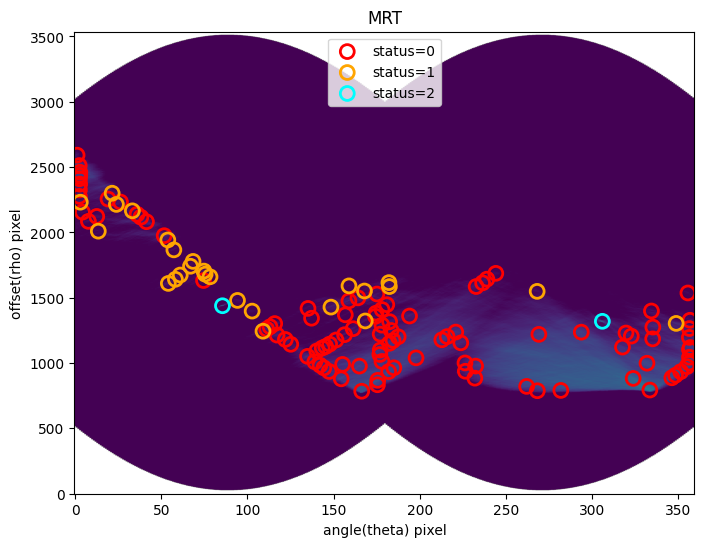

In [43]:
s4.plot_mrt(show_sources=True)

That seems to have worked! Let's make the map to confirm

<Axes: title={'center': 'Segmentation Mask'}>

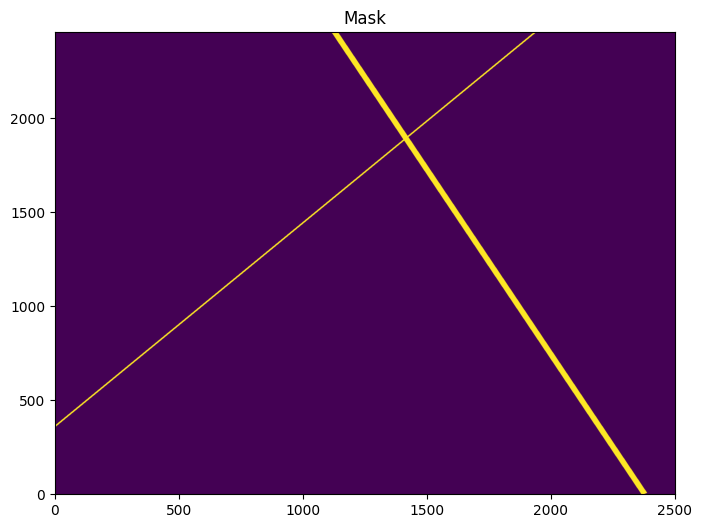

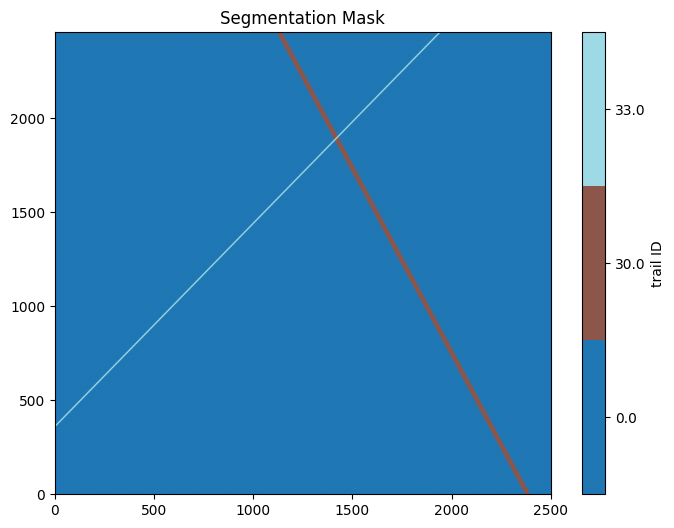

In [44]:
s4.make_mask()
s4.plot_mask()
s4.plot_segment()

Let's make a version plotting the mask on top of the original image

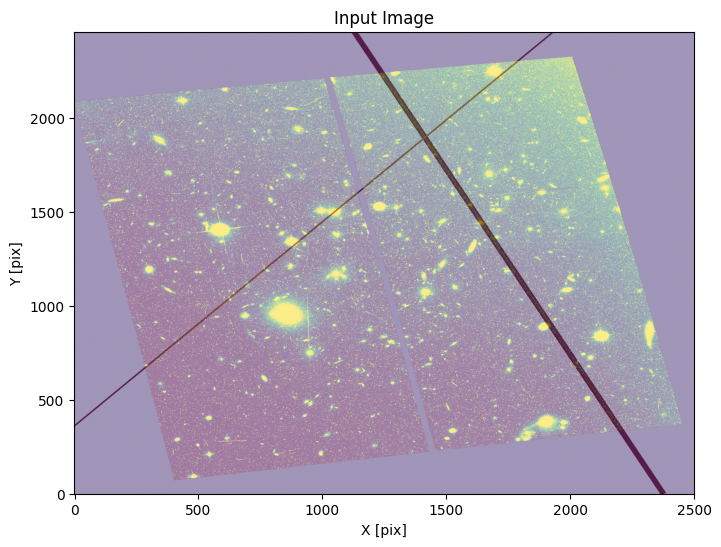

In [45]:
s4.plot_image(overlay_mask=True)

<a id="example5"></a>
## Example 5:  Finding trails in a DRC image using the WFC Wrapper

All of the setup from the last example can be streamlined using the `WfcWrapper` class.

In [46]:
w2 = WfcWrapper('hst_13498_32_acs_wfc_f606w_jc8m32j5_drc.fits', binsize=2, extension=1, processes=8,
                output_root='example5')

INFO:findsat_mrt:image type is drc


INFO:findsat_mrt:masking bad pixels


INFO:findsat_mrt:Subtracting median background


INFO:findsat_mrt:Rebinning the data by 2


Extra rows/columns will be trimmed first.


Run full pipeline now

In [47]:
w2.run_all()

INFO:utils_findsat_mrt:Calculating median Radon Transform with 4 processes


INFO:findsat_mrt:Detection threshold: 5


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width15.fits


INFO:findsat_mrt:{no} sources found using kernel: 7


INFO:findsat_mrt:7 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width7.fits


INFO:findsat_mrt:{no} sources found using kernel: 11


INFO:findsat_mrt:11 sources found using kernel


INFO:findsat_mrt:Using kernel /opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/data/rt_line_kernel_width3.fits


INFO:findsat_mrt:{no} sources found using kernel: 21


INFO:findsat_mrt:21 sources found using kernel


INFO:findsat_mrt:Removing duplicate sources


INFO:findsat_mrt:24 final sources found


INFO:findsat_mrt:Filtering sources...
Min SNR : 5
Max Width: 75
Min Length: 25
Check persistence: True


INFO:findsat_mrt:Min persistence: 0.5


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0010139754740521312
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 14.339253100548007


INFO:utils_findsat_mrt:breaking into 23.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 23


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 14.339253100548007


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 14.339253100548007, 253.98724834673646


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 23


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 14.33925310054795


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 14.33925310054795, 253.98724834673646


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.01193982459174114
baseline noise: 0.0005513272533387856
snr of feature = 20.656510755517154


INFO:utils_findsat_mrt:width of feature = 2.6576124876081053


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.656510755517154, 2.6576124876081053, 253.98724834673646


INFO:utils_findsat_mrt:Checking persistence, step 4 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.007576912264129116
baseline noise: 0.0007001039292476852
snr of feature = 9.822553548972483


INFO:utils_findsat_mrt:width of feature = 3.5123818133656357


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.822553548972483, 3.5123818133656357, 255.21606758534537


INFO:utils_findsat_mrt:Checking persistence, step 5 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.02168839681926535
baseline noise: 0.0005558980956726296
snr of feature = 38.01505867369929


INFO:utils_findsat_mrt:width of feature = 137.22214000598137


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 38.01505867369929, 137.22214000598137, 251.70368577197974


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.014475240136955517
baseline noise: 0.0011382318474006709
snr of feature = 11.717303746167334


INFO:utils_findsat_mrt:width of feature = 224.71388760211096


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.717303746167334, 224.71388760211096, 251.70368577197974


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.0027887088263287155
baseline noise: 0.0010079135428015785
snr of feature = 1.76681352904265


INFO:utils_findsat_mrt:width of feature = 3.5119491781351257


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.76681352904265, 3.5119491781351257, 255.216033269367


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.020287520242746385
baseline noise: 0.0005131854167946397
snr of feature = 38.53253459434292


INFO:utils_findsat_mrt:width of feature = 86.74620612454825


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 38.53253459434292, 86.74620612454825, 258.728449398711


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.0854460025694002
baseline noise: 0.0005703372507897019
snr of feature = 148.81662595436248


INFO:utils_findsat_mrt:width of feature = 91.22033169905458


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 148.81662595436248, 91.22033169905458, 251.70368577197974


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.04736970686141847
baseline noise: 0.0006494732489577322
snr of feature = 71.93557808183304


INFO:utils_findsat_mrt:width of feature = 97.00913899785891


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 71.93557808183304, 97.00913899785891, 258.728449398711


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.01624496598890876
baseline noise: 0.00040871957817657507
snr of feature = 38.745994212909004


INFO:utils_findsat_mrt:width of feature = 60.855373959813704


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 38.745994212909004, 60.855373959813704, 258.06014800656556


INFO:utils_findsat_mrt:Checking persistence, step 12 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.009920490532858449
baseline noise: 0.0011366570659799933
snr of feature = 7.72777799899153


INFO:utils_findsat_mrt:width of feature = 228.96695123757175


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.72777799899153, 228.96695123757175, 263.7459108105551


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.009236104837365568
baseline noise: 0.0013805047442013408
snr of feature = 5.690382540270735


INFO:utils_findsat_mrt:width of feature = 213.05833177900456


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.690382540270735, 213.05833177900456, 260.81085553379694


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.008237982602315787
baseline noise: 0.0013767465661386209
snr of feature = 4.9836594511515395


INFO:utils_findsat_mrt:width of feature = 213.27931853722683


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.9836594511515395, 213.27931853722683, 263.73905173050525


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.013348992021919245
baseline noise: 0.0010941003365909558
snr of feature = 11.200884667957054


INFO:utils_findsat_mrt:width of feature = 39.225060358546244


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.200884667957054, 39.225060358546244, 252.1449874586032


INFO:utils_findsat_mrt:Checking persistence, step 16 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.012130327935926642
baseline noise: 0.0013663608181319997
snr of feature = 7.877836494543544


INFO:utils_findsat_mrt:width of feature = 74.8727984047971


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.877836494543544, 74.8727984047971, 255.97557099642665


INFO:utils_findsat_mrt:Checking persistence, step 17 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.27897659869959307
baseline noise: 0.0026542819148107524
snr of feature = 104.10435878831048


INFO:utils_findsat_mrt:width of feature = 65.7287920010626


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 104.10435878831048, 65.7287920010626, 242.4660538950216


INFO:utils_findsat_mrt:Checking persistence, step 18 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.014668901735299396
baseline noise: 0.0010606351572368655
snr of feature = 12.830299359031596


INFO:utils_findsat_mrt:width of feature = 50.371078654684254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.830299359031596, 50.371078654684254, 225.23953835129535


INFO:utils_findsat_mrt:Checking persistence, step 19 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.01852484251867622
baseline noise: 0.0016766772538280095
snr of feature = 10.048544063195399


INFO:utils_findsat_mrt:width of feature = 27.118395531579324


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.048544063195399, 27.118395531579324, 202.31800413427203


INFO:utils_findsat_mrt:Checking persistence, step 20 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.006757302810107909
baseline noise: 0.0019520560119806092
snr of feature = 2.461633666572798


INFO:utils_findsat_mrt:width of feature = 11.432858446071236


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.461633666572798, 11.432858446071236, 196.32435824745076


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 23


INFO:utils_findsat_mrt:amplitude of feature: 0.022408325804532496
baseline noise: 0.0026321269995778474
snr of feature = 7.513390808318309


INFO:utils_findsat_mrt:width of feature = 41.5305702970403


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.513390808318309, 41.5305702970403, 196.29224513952593


INFO:utils_findsat_mrt:Checking persistence, step 22 of 23


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 41.5305702970403


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 41.5305702970403, 196.29224513952593


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 23


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 41.5305702970403


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 41.5305702970403, 196.29224513952593


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 23
Number of sections that passed: 9
persistance score: 0.391304347826087


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.013679235242307186
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 15.943824936832186


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 15.943824936832186


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 15.943824936832186, 250.04541344309595


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 15.943824936832186


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 15.943824936832186, 250.04541344309595


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.00022744480520486832
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.4821296678791782


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 1.4821296678791782, 250.96442149177062


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02683461318197586
baseline noise: 0.0026674249786689383
snr of feature = 9.06011917732228


INFO:utils_findsat_mrt:width of feature = 21.65260344279372


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.06011917732228, 21.65260344279372, 250.3986940368659


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.028327425271831422
baseline noise: 0.003352929567021064
snr of feature = 7.448559597092623


INFO:utils_findsat_mrt:width of feature = 24.79708203367528


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.448559597092623, 24.79708203367528, 250.22307063989743


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02617738161530245
baseline noise: 0.003562238143007106
snr of feature = 6.348577092379484


INFO:utils_findsat_mrt:width of feature = 26.89015757164546


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.348577092379484, 26.89015757164546, 249.90596401633968


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03096975399658983
baseline noise: 0.003330156589075549
snr of feature = 8.299789114477354


INFO:utils_findsat_mrt:width of feature = 22.86389712790418


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.299789114477354, 22.86389712790418, 249.92794028756018


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.027339045396297765
baseline noise: 0.0036506400696200082
snr of feature = 6.488836169801714


INFO:utils_findsat_mrt:width of feature = 28.34766849457384


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.488836169801714, 28.34766849457384, 249.0307018401609


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.024858499330072
baseline noise: 0.003530959943710663
snr of feature = 6.040153308549959


INFO:utils_findsat_mrt:width of feature = 18.382930398995512


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.040153308549959, 18.382930398995512, 250.1011177884675


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.022402924133816914
baseline noise: 0.005671626838853677
snr of feature = 2.9499996685862513


INFO:utils_findsat_mrt:width of feature = 16.65705801873696


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9499996685862513, 16.65705801873696, 249.12527894735604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02881505252105385
baseline noise: 0.0060709060748048846
snr of feature = 3.7464171189602777


INFO:utils_findsat_mrt:width of feature = 19.293746564336516


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.7464171189602777, 19.293746564336516, 250.66148954948585


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.04573910008674095
baseline noise: 0.0043741914444258585
snr of feature = 9.4565839579398


INFO:utils_findsat_mrt:width of feature = 31.234081401281912


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.4565839579398, 31.234081401281912, 248.6609916064451


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03037742928557542
baseline noise: 0.006184312426923268
snr of feature = 3.9120140103737233


INFO:utils_findsat_mrt:width of feature = 34.71150886942658


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.9120140103737233, 34.71150886942658, 251.9482428664571


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.028198746255914973
baseline noise: 0.0032219810438264954
snr of feature = 7.751990117988256


INFO:utils_findsat_mrt:width of feature = 25.160676685906452


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.751990117988256, 25.160676685906452, 249.75882170484994


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.029212472359702486
baseline noise: 0.0033775346732717176
snr of feature = 7.649051804227736


INFO:utils_findsat_mrt:width of feature = 101.83483367131242


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.649051804227736, 101.83483367131242, 233.01358880296985


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.024903750764708292
baseline noise: 0.0034849091488842365
snr of feature = 6.14616929760758


INFO:utils_findsat_mrt:width of feature = 21.283525666823408


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.14616929760758, 21.283525666823408, 250.45534689703535


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03022461826815711
baseline noise: 0.003719247367284806
snr of feature = 7.1265415508574375


INFO:utils_findsat_mrt:width of feature = 21.04566202933711


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.1265415508574375, 21.04566202933711, 250.21916339257888


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.04154068671355898
baseline noise: 0.003581234661796462
snr of feature = 10.599543352102163


INFO:utils_findsat_mrt:width of feature = 117.08506417387491


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.599543352102163, 117.08506417387491, 229.17350136324177


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.021212878579552324
baseline noise: 0.00520300489468817
snr of feature = 3.077043748547861


INFO:utils_findsat_mrt:width of feature = 19.85791410059238


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.077043748547861, 19.85791410059238, 249.7325081534473


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.024496583261114264
baseline noise: 0.005142440861378709
snr of feature = 3.7636101068445993


INFO:utils_findsat_mrt:width of feature = 17.693238828413342


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.7636101068445993, 17.693238828413342, 250.32550335623338


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0264205142917004
baseline noise: 0.0035229448374561037
snr of feature = 6.4995537854570795


INFO:utils_findsat_mrt:width of feature = 25.752106091864334


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.4995537854570795, 25.752106091864334, 250.1794369167328


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.024963283132395715
baseline noise: 0.005029279384521359
snr of feature = 3.96359045179024


INFO:utils_findsat_mrt:width of feature = 23.879859641444966


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.96359045179024, 23.879859641444966, 250.38708017176552


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02849444557898065
baseline noise: 0.0054332521610746505
snr of feature = 4.244454837403441


INFO:utils_findsat_mrt:width of feature = 31.2477591872796


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.244454837403441, 31.2477591872796, 249.09995846444895


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.016443731816397928
baseline noise: 0.0009209050433516494
snr of feature = 16.85605577373177


INFO:utils_findsat_mrt:width of feature = 18.339987940919457


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.85605577373177, 18.339987940919457, 250.01030336144314


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.339987940919457


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.339987940919457, 250.01030336144314


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.339987940919457


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.339987940919457, 250.01030336144314


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise


INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 18.339987940919457


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 18.339987940919457, 250.01030336144314


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 18
persistance score: 0.6666666666666666


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.1579226702451706
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 4.128086468014658


INFO:utils_findsat_mrt:breaking into 28.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.128086468014658


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.128086468014658, 250.52108622267008


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.128086468014658


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.128086468014658, 250.52108622267008


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.128086468014658


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.128086468014658, 250.52108622267008


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 28


INFO:utils_findsat_mrt:amplitude of feature: -0.0008503699273521882
baseline noise: 0.0007836777356472944
snr of feature = -2.085101552170304


INFO:utils_findsat_mrt:width of feature = 4.127723696732403


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.085101552170304, 4.127723696732403, 250.52108622267008


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.18035545188837837
baseline noise: 0.0015425166676575667
snr of feature = 115.92285449483172


INFO:utils_findsat_mrt:width of feature = 4.55090868001173


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 115.92285449483172, 4.55090868001173, 250.52108622267008


INFO:utils_findsat_mrt:Checking persistence, step 6 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.22269066325536188
baseline noise: 0.0019047135992855348
snr of feature = 115.91556323160289


INFO:utils_findsat_mrt:width of feature = 4.153479136591841


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 115.91556323160289, 4.153479136591841, 250.33558484208655


INFO:utils_findsat_mrt:Checking persistence, step 7 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.27386960963057233
baseline noise: 0.003273742565423049
snr of feature = 82.6564281269873


INFO:utils_findsat_mrt:width of feature = 4.201352967166315


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 82.6564281269873, 4.201352967166315, 250.3806153405099


INFO:utils_findsat_mrt:Checking persistence, step 8 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.348438482169819
baseline noise: 0.003101512144192831
snr of feature = 111.34470992551928


INFO:utils_findsat_mrt:width of feature = 4.176237719796006


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 111.34470992551928, 4.176237719796006, 250.3923273586316


INFO:utils_findsat_mrt:Checking persistence, step 9 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.39647493127724415
baseline noise: 0.003925409619476922
snr of feature = 100.0021805902835


INFO:utils_findsat_mrt:width of feature = 4.151006534072678


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 100.0021805902835, 4.151006534072678, 250.39935842493176


INFO:utils_findsat_mrt:Checking persistence, step 10 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.3966035830309199
baseline noise: 0.005096041681443224
snr of feature = 76.82581223287794


INFO:utils_findsat_mrt:width of feature = 4.36458195334842


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 76.82581223287794, 4.36458195334842, 250.41010757243444


INFO:utils_findsat_mrt:Checking persistence, step 11 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.35682209171417467
baseline noise: 0.021515635502072934
snr of feature = 15.584315702866249


INFO:utils_findsat_mrt:width of feature = 5.109584502627797


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.584315702866249, 5.109584502627797, 250.42839910479634


INFO:utils_findsat_mrt:Checking persistence, step 12 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.2548357818432255
baseline noise: 0.004209762713194844
snr of feature = 59.53447645504639


INFO:utils_findsat_mrt:width of feature = 4.237791442140178


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 59.53447645504639, 4.237791442140178, 250.43246735671963


INFO:utils_findsat_mrt:Checking persistence, step 13 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.19998272819332205
baseline noise: 0.005645864226208731
snr of feature = 34.42110121334125


INFO:utils_findsat_mrt:width of feature = 4.287424359357146


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 34.42110121334125, 4.287424359357146, 250.43577824144705


INFO:utils_findsat_mrt:Checking persistence, step 14 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.18846480733705728
baseline noise: 0.0069885728683246875
snr of feature = 25.967567039511515


INFO:utils_findsat_mrt:width of feature = 109.86356527317821


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 25.967567039511515, 109.86356527317821, 254.7232026008042


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.13553221177667749
baseline noise: 0.004547362823573754
snr of feature = 28.804573999257723


INFO:utils_findsat_mrt:width of feature = 4.166443302848222


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 28.804573999257723, 4.166443302848222, 250.46753503624834


INFO:utils_findsat_mrt:Checking persistence, step 16 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.24272877854413166
baseline noise: 0.003905596383739579
snr of feature = 61.1489664305047


INFO:utils_findsat_mrt:width of feature = 164.26212894412555


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 61.1489664305047, 164.26212894412555, 254.63397833909656


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.14771889219307918
baseline noise: 0.0032436294458341734
snr of feature = 44.541235415406675


INFO:utils_findsat_mrt:width of feature = 4.2433896069421735


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 44.541235415406675, 4.2433896069421735, 250.52659573856826


INFO:utils_findsat_mrt:Checking persistence, step 18 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.12377634873672022
baseline noise: 0.004917007098139351
snr of feature = 24.173107597009274


INFO:utils_findsat_mrt:width of feature = 3.718208513672721


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 24.173107597009274, 3.718208513672721, 250.52386841501163


INFO:utils_findsat_mrt:Checking persistence, step 19 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.12590728519969782
baseline noise: 0.002564023330606325
snr of feature = 48.10535863568917


INFO:utils_findsat_mrt:width of feature = 4.53525237542317


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 48.10535863568917, 4.53525237542317, 250.54764933485563


INFO:utils_findsat_mrt:Checking persistence, step 20 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.11659180216786245
baseline noise: 0.003736758043472289
snr of feature = 30.201325001905246


INFO:utils_findsat_mrt:width of feature = 4.266843648347447


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 30.201325001905246, 4.266843648347447, 250.5326925909158


INFO:utils_findsat_mrt:Checking persistence, step 21 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.12754153094594164
baseline noise: 0.00440359135636173
snr of feature = 27.96307141708015


INFO:utils_findsat_mrt:width of feature = 4.3248343111395116


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 27.96307141708015, 4.3248343111395116, 250.57531200466184


INFO:utils_findsat_mrt:Checking persistence, step 22 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.1483179953418969
baseline noise: 0.0037652608458329565
snr of feature = 38.391160776030056


INFO:utils_findsat_mrt:width of feature = 4.135356228738544


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 38.391160776030056, 4.135356228738544, 250.61723852923592


INFO:utils_findsat_mrt:Checking persistence, step 23 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.17968977791309987
baseline noise: 0.003080427144627402
snr of feature = 57.332747205691355


INFO:utils_findsat_mrt:width of feature = 4.313807483250457


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 57.332747205691355, 4.313807483250457, 250.62865575775413


INFO:utils_findsat_mrt:Checking persistence, step 24 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.20738550126924823
baseline noise: 0.0033540077851815535
snr of feature = 60.83214665914152


INFO:utils_findsat_mrt:width of feature = 4.071869063730389


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 60.83214665914152, 4.071869063730389, 250.65407832395454


INFO:utils_findsat_mrt:Checking persistence, step 25 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.24609802152591284
baseline noise: 0.002790249007166166
snr of feature = 87.19930439679827


INFO:utils_findsat_mrt:width of feature = 4.026940678222672


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 87.19930439679827, 4.026940678222672, 250.70224714702385


INFO:utils_findsat_mrt:Checking persistence, step 26 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.32677921324232195
baseline noise: 0.0017199784806397923
snr of feature = 188.99029169293303


INFO:utils_findsat_mrt:width of feature = 4.325884409095465


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 188.99029169293303, 4.325884409095465, 250.769246008844


INFO:utils_findsat_mrt:Checking persistence, step 27 of 28


INFO:utils_findsat_mrt:amplitude of feature: 0.003711279190258824
baseline noise: 0.00021230699948736735
snr of feature = 16.480719897224358


INFO:utils_findsat_mrt:width of feature = 121.94518637950364


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.480719897224358, 121.94518637950364, 250.46710658593656


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 28 of 28


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.325884409095465


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.325884409095465, 250.769246008844


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 28
Number of sections that passed: 20
persistance score: 0.7142857142857143


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0027359751984477043
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 70.34658734399602


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 70.34658734399602


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 70.34658734399602, 252.8217954279766


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013410697428298556
baseline noise: 0.0019454306871938285
snr of feature = 5.893433683644989


INFO:utils_findsat_mrt:width of feature = 88.85343040676295


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.893433683644989, 88.85343040676295, 269.8379822890241


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.023902829481499667
baseline noise: 0.003584254033336847
snr of feature = 5.668843575031638


INFO:utils_findsat_mrt:width of feature = 96.53254751415898


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.668843575031638, 96.53254751415898, 258.59090600004737


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.021181567104442797
baseline noise: 0.0037928811307387875
snr of feature = 4.584558644029267


INFO:utils_findsat_mrt:width of feature = 97.72646198392422


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.584558644029267, 97.72646198392422, 252.8217954279766


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007227588139094667
baseline noise: 0.0032256023647941738
snr of feature = 1.2406940849188832


INFO:utils_findsat_mrt:width of feature = 70.34652969627919


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2406940849188832, 70.34652969627919, 252.8217954279766


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01616487322704528
baseline noise: 0.003336290290066089
snr of feature = 3.8451638861212727


INFO:utils_findsat_mrt:width of feature = 104.15586234203866


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.8451638861212727, 104.15586234203866, 254.73417813969684


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.023718983941205342
baseline noise: 0.004163291145218618
snr of feature = 4.697171567846197


INFO:utils_findsat_mrt:width of feature = 125.72597068795358


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.697171567846197, 125.72597068795358, 252.8217954279766


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.014656822796655958
baseline noise: 0.0036152880055913394
snr of feature = 3.0541231497982952


INFO:utils_findsat_mrt:width of feature = 55.721164246017224


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0541231497982952, 55.721164246017224, 255.050125196502


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.004676812934928341
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 253.91495390118186


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011895922576667335
baseline noise: 0.008030009317023915
snr of feature = 0.48143322218164075


INFO:utils_findsat_mrt:width of feature = 55.72112526467612


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.48143322218164075, 55.72112526467612, 255.05012741551312


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.4413009409714008
baseline noise: 0.009761074569103753
snr of feature = 44.21028272524716


INFO:utils_findsat_mrt:width of feature = 148.456775797687


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 44.21028272524716, 148.456775797687, 310.7712894425192


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004408498737753844
baseline noise: 0.00439517847601337
snr of feature = 0.0030306532062735936


INFO:utils_findsat_mrt:width of feature = 55.72113280152885


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.0030306532062735936, 55.72113280152885, 255.05012531715008


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.019899065197285896
baseline noise: 0.005301892785069841
snr of feature = 2.75320022564805


INFO:utils_findsat_mrt:width of feature = 168.74881123514888


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.75320022564805, 168.74881123514888, 247.82250850771652


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.08680911357043146
baseline noise: 0.004344753884360805
snr of feature = 18.980214272413896


INFO:utils_findsat_mrt:width of feature = 148.98249061327923


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 18.980214272413896, 148.98249061327923, 229.6184105397236


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007756082370236639
baseline noise: 0.003906719787513986
snr of feature = 0.9853183212743725


INFO:utils_findsat_mrt:width of feature = 55.721135262393716


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9853183212743725, 55.721135262393716, 255.05012553336505


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0038751143324177867
baseline noise: 0.005082307151034847
snr of feature = -0.23752850481916563


INFO:utils_findsat_mrt:width of feature = 55.72111698877606


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.23752850481916563, 55.72111698877606, 255.05012421074102


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.005068741429706387
baseline noise: 0.007272882406902688
snr of feature = -1.6969370802552297


INFO:utils_findsat_mrt:width of feature = 55.7211213392807


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.6969370802552297, 55.7211213392807, 255.050124869272


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.24507024499082733
baseline noise: 0.003982109178304538
snr of feature = 60.54282417117726


INFO:utils_findsat_mrt:width of feature = 61.556363671330786


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 60.54282417117726, 61.556363671330786, 244.99475928012185


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.018968130016592293
baseline noise: 0.0031564884356301503
snr of feature = 5.009250597113486


INFO:utils_findsat_mrt:width of feature = 61.555221914119784


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.009250597113486, 61.555221914119784, 244.9947741662674


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01005465281515345
baseline noise: 0.0034948015438413128
snr of feature = 1.8770311243773443


INFO:utils_findsat_mrt:width of feature = 19.41321964569795


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8770311243773443, 19.41321964569795, 246.4340963878562


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00842583553408293
baseline noise: 0.004391294338959344
snr of feature = 0.9187589998988086


INFO:utils_findsat_mrt:width of feature = 61.555221914119784


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9187589998988086, 61.555221914119784, 244.9947741662674


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009386670551819049
baseline noise: 0.0033039187112163517
snr of feature = 1.841071882293165


INFO:utils_findsat_mrt:width of feature = 81.2768709352458


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.841071882293165, 81.2768709352458, 245.31692554462347


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006229332375629733
baseline noise: 0.003605429384327417
snr of feature = 0.7277643552549561


INFO:utils_findsat_mrt:width of feature = 61.555221914119784


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7277643552549561, 61.555221914119784, 244.9947741662674


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012855954918133105
baseline noise: 0.003008860450641665
snr of feature = 3.272698959963884


INFO:utils_findsat_mrt:width of feature = 151.71930811686485


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.272698959963884, 151.71930811686485, 218.45799763258023


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008807859935045079
baseline noise: 0.0021264095186038236
snr of feature = 3.142127778297484


INFO:utils_findsat_mrt:width of feature = 61.555221914119784


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.142127778297484, 61.555221914119784, 244.9947741662674


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.000994205457698124
baseline noise: 0.0012207649378941116
snr of feature = -1.8144118714723116


INFO:utils_findsat_mrt:width of feature = 61.555221914119784


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.8144118714723116, 61.555221914119784, 244.9947741662674


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 61.555221914119784


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 61.555221914119784, 244.9947741662674


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 4
persistance score: 0.14814814814814814


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0029916693456470966
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 97.36831183991262


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0027998648583889008
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 104.10873684112119


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0026011671870946884
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 58.62492067880274


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 58.62492067880274


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 58.62492067880274, 256.7736372069998


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 58.62492067880274


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 58.62492067880274, 256.7736372069998


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0006225731714819989
baseline noise: 0.0013201739437753567
snr of feature = -0.528415801252977


INFO:utils_findsat_mrt:width of feature = 58.62486894668302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.528415801252977, 58.62486894668302, 256.7736372069998


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.021744253027740718
baseline noise: 0.0035226374883047845
snr of feature = 5.1727194750899015


INFO:utils_findsat_mrt:width of feature = 50.43576593281489


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.1727194750899015, 50.43576593281489, 256.7736372069998


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.011238157025121764
baseline noise: 0.0028730171087533586
snr of feature = 2.9116220334650755


INFO:utils_findsat_mrt:width of feature = 53.05314922323339


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9116220334650755, 53.05314922323339, 240.87114251231452


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007595988438067696
baseline noise: 0.0031887850878176294
snr of feature = 1.3820948194618878


INFO:utils_findsat_mrt:width of feature = 50.83697101916482


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3820948194618878, 50.83697101916482, 264.53535432408194


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.018166812311171683
baseline noise: 0.002993422143027107
snr of feature = 5.06891091304631


INFO:utils_findsat_mrt:width of feature = 181.0901162066392


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.06891091304631, 181.0901162066392, 256.7531125552286


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0028513855788701303
baseline noise: 0.005686204581995257
snr of feature = -0.49854326594250054


INFO:utils_findsat_mrt:width of feature = 50.43569219751464


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.49854326594250054, 50.43569219751464, 256.77363756030866


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.49986436067913786
baseline noise: 0.01016078109734469
snr of feature = 48.195465967647614


INFO:utils_findsat_mrt:width of feature = 216.55751295004924


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 48.195465967647614, 216.55751295004924, 206.33787127418492


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.00045527119932524396
baseline noise: 0.012665237280825218
snr of feature = -1.0359465195345776


INFO:utils_findsat_mrt:width of feature = 50.43567457822223


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0359465195345776, 50.43567457822223, 256.773635849206


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.006351231318191774
baseline noise: 0.008930910478009264
snr of feature = -0.28884839526378403


INFO:utils_findsat_mrt:width of feature = 50.43570076370179


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.28884839526378403, 50.43570076370179, 256.7736388711619


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.010701207538289114
baseline noise: 0.0035948949083477602
snr of feature = 1.9767789632569444


INFO:utils_findsat_mrt:width of feature = 52.34250564356137


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9767789632569444, 52.34250564356137, 266.744476840596


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.0015139448184728222
baseline noise: 0.002420674317035098
snr of feature = -1.6254227624999713


INFO:utils_findsat_mrt:width of feature = 50.435690226306434


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.6254227624999713, 50.435690226306434, 256.77363799119485


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.003361370353748193
baseline noise: 0.002911679739634534
snr of feature = 0.1544437075246822


INFO:utils_findsat_mrt:width of feature = 50.43569611940623


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.1544437075246822, 50.43569611940623, 256.7736375594834


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.023119568414604923
baseline noise: 0.004965869916198355
snr of feature = 3.655693524953271


INFO:utils_findsat_mrt:width of feature = 18.347398334621516


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.655693524953271, 18.347398334621516, 267.9021255938897


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.025775968152482204
baseline noise: 0.0038740365868315495
snr of feature = 5.653516964733558


INFO:utils_findsat_mrt:width of feature = 26.63655440529496


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.653516964733558, 26.63655440529496, 260.35557141701923


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.01277898366912742
baseline noise: 0.0028718212740344836
snr of feature = 3.4497837608030677


INFO:utils_findsat_mrt:width of feature = 5.6460853713663255


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4497837608030677, 5.6460853713663255, 261.66913847119105


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.003469684915409312
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 261.55845109361996


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.022596202328274542
baseline noise: 0.0031265645023516872
snr of feature = 6.2271665309570645


INFO:utils_findsat_mrt:width of feature = 70.39268504094719


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.2271665309570645, 70.39268504094719, 256.0230530998247


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.031280362869590815
baseline noise: 0.00421485445519369
snr of feature = 6.421457419732743


INFO:utils_findsat_mrt:width of feature = 109.63989425330158


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.421457419732743, 109.63989425330158, 256.04123702039743


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.004712635211730651
baseline noise: 0.0028957413422741607
snr of feature = 0.6274365195993641


INFO:utils_findsat_mrt:width of feature = 5.645577040583362


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6274365195993641, 5.645577040583362, 261.66917608250276


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.2667392025761229
baseline noise: 0.003738665945974905
snr of feature = 70.34609147503475


INFO:utils_findsat_mrt:width of feature = 178.0238341068758


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 70.34609147503475, 178.0238341068758, 256.0230530998247


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.006538952744103401
baseline noise: 0.003211043895880242
snr of feature = 1.0363946916119253


INFO:utils_findsat_mrt:width of feature = 47.65074612257388


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0363946916119253, 47.65074612257388, 256.81558250039006


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03172247594658845
baseline noise: 0.0009600594438374471
snr of feature = 32.04219978274549


INFO:utils_findsat_mrt:width of feature = 168.7352444824769


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 32.04219978274549, 168.7352444824769, 267.3152238425574


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 5.646085371366212


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 5.646085371366212, 261.66913847119105


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 4
persistance score: 0.16


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0006899667205289006
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.864389030731104


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.864389030731104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.864389030731104, 248.50745443612976


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.864389030731104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.864389030731104, 248.50745443612976


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.003934569607285789
baseline noise: 0.003949441889292326
snr of feature = -0.0037656667507524424


INFO:utils_findsat_mrt:width of feature = 1.8868495868038053


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.0037656667507524424, 1.8868495868038053, 248.50745443612976


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008578193887218918
baseline noise: 0.0038357001652986077
snr of feature = 1.236408873880555


INFO:utils_findsat_mrt:width of feature = 10.258158689906793


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.236408873880555, 10.258158689906793, 248.50745443612976


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03843300343522029
baseline noise: 0.003481720523863909
snr of feature = 10.038509027878117


INFO:utils_findsat_mrt:width of feature = 4.919325785665251


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.038509027878117, 4.919325785665251, 248.50745443612976


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 35.012766211181585
baseline noise: 0.007473479955989241
snr of feature = 4683.9347850491495


INFO:utils_findsat_mrt:width of feature = 4.442462679711809


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4683.9347850491495, 4.442462679711809, 250.11527520249848


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 106.62781262955903
baseline noise: 0.004531147847702614
snr of feature = 23531.185709548532


INFO:utils_findsat_mrt:width of feature = 7.406244421171095


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 23531.185709548532, 7.406244421171095, 247.18849128715704


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03935635799131065
baseline noise: 0.0030019717116092307
snr of feature = 12.110169505965587


INFO:utils_findsat_mrt:width of feature = 60.37177259997756


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.110169505965587, 60.37177259997756, 244.87692182272983


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.00036189388249530195
baseline noise: 0.007919485703929979
snr of feature = -0.9543033605937674


INFO:utils_findsat_mrt:width of feature = 60.37173487769715


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9543033605937674, 60.37173487769715, 244.8769216608736


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.014902639524402855
baseline noise: 0.0048024707409514075
snr of feature = 2.103119275110987


INFO:utils_findsat_mrt:width of feature = 107.18868011088432


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.103119275110987, 107.18868011088432, 277.3057071241907


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.19186817722708424
baseline noise: 0.004907746498632994
snr of feature = 38.09496492545556


INFO:utils_findsat_mrt:width of feature = 83.85208554290463


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 38.09496492545556, 83.85208554290463, 269.7479066654582


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.025117342109730646
baseline noise: 0.0005161649002971779
snr of feature = 47.661468641648305


INFO:utils_findsat_mrt:width of feature = 60.09970679042877


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 47.661468641648305, 60.09970679042877, 242.98037682904067


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.13048023830913952
baseline noise: 0.0015412612043667394
snr of feature = 83.65809555152603


INFO:utils_findsat_mrt:width of feature = 66.31641515269826


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 83.65809555152603, 66.31641515269826, 259.8952232614024


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.027551366841831557
baseline noise: 0.003723746063852352
snr of feature = 6.398830739099502


INFO:utils_findsat_mrt:width of feature = 64.06220820216856


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.398830739099502, 64.06220820216856, 249.3163543011791


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.006241011789426424
baseline noise: 0.0042021994754523825
snr of feature = 0.4851774233669751


INFO:utils_findsat_mrt:width of feature = 64.06212504031785


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4851774233669751, 64.06212504031785, 249.31635410418957


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.01643702341909028
baseline noise: 0.0037835763261473395
snr of feature = 3.344308665190171


INFO:utils_findsat_mrt:width of feature = 63.89782398424222


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.344308665190171, 63.89782398424222, 278.97034514872763


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.013632865916403836
baseline noise: 0.004293029518938164
snr of feature = 2.1755816856753833


INFO:utils_findsat_mrt:width of feature = 63.897805363589754


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1755816856753833, 63.897805363589754, 278.9703457752524


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.004793530548572593
baseline noise: 0.007012612737477578
snr of feature = -1.683558429364633


INFO:utils_findsat_mrt:width of feature = 63.89779417124575


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.683558429364633, 63.89779417124575, 278.97034573756355


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.013542807893805511
baseline noise: 0.0044453842018666615
snr of feature = 2.0464876102539686


INFO:utils_findsat_mrt:width of feature = 48.40755997990618


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.0464876102539686, 48.40755997990618, 291.32477480838065


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.00851677906651976
baseline noise: 0.004838688451038836
snr of feature = 0.760142061779419


INFO:utils_findsat_mrt:width of feature = 63.897802131020995


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.760142061779419, 63.897802131020995, 278.970344658839


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.009033863929364852
baseline noise: 0.003213083058886999
snr of feature = 1.811587426717239


INFO:utils_findsat_mrt:width of feature = 46.435206109605815


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.811587426717239, 46.435206109605815, 277.56302165734564


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.036127614775430805
baseline noise: 0.0033688174003113983
snr of feature = 9.724123774738082


INFO:utils_findsat_mrt:width of feature = 59.78341912028563


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.724123774738082, 59.78341912028563, 254.86786634315504


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 59.78341912028563


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 59.78341912028563, 254.86786634315504


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 59.78341912028563


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 59.78341912028563, 254.86786634315504


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 59.78341912028563


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 59.78341912028563, 254.86786634315504


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 9
persistance score: 0.36


INFO:utils_findsat_mrt:amplitude of feature: 0.000452918118556138
baseline noise: 1.6862054682515529e-06
snr of feature = 267.60197472006445


INFO:utils_findsat_mrt:width of feature = 31.035510224807865


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: 1.1289620623607615e-05
baseline noise: 7.760654470051774e-05
snr of feature = -0.8545274671463076


INFO:utils_findsat_mrt:width of feature = 31.03540843308099


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8545274671463076, 31.03540843308099, 250.07324278946004


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0038939647688658614
baseline noise: 0.0014916930573443683
snr of feature = 1.6104329906838943


INFO:utils_findsat_mrt:width of feature = 31.035460357347517


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6104329906838943, 31.035460357347517, 250.07324497616966


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.021462553532467656
baseline noise: 0.002360249938303228
snr of feature = 8.093339304521697


INFO:utils_findsat_mrt:width of feature = 45.018540157661505


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.093339304521697, 45.018540157661505, 260.4662223868304


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006546206897300457
baseline noise: 0.003865707352366794
snr of feature = 0.6934046736084449


INFO:utils_findsat_mrt:width of feature = 45.01839269970401


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6934046736084449, 45.01839269970401, 260.4662223258435


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0033798139607353894
baseline noise: 0.004005606731056262
snr of feature = -0.15622920879101213


INFO:utils_findsat_mrt:width of feature = 45.018407700156445


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.15622920879101213, 45.018407700156445, 260.4662216436861


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.016061744344160505
baseline noise: 0.0035335621065115857
snr of feature = 3.5454823942565517


INFO:utils_findsat_mrt:width of feature = 129.56075190480732


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.5454823942565517, 129.56075190480732, 255.057053922751


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.5879037981836248
baseline noise: 0.004160076632664381
snr of feature = 140.32042510166292


INFO:utils_findsat_mrt:width of feature = 95.54947225144906


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 140.32042510166292, 95.54947225144906, 221.84306292969586


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011407145875352466
baseline noise: 0.004053410383989844
snr of feature = 1.8142094667760262


INFO:utils_findsat_mrt:width of feature = 170.41815163888703


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8142094667760262, 170.41815163888703, 219.8335242569383


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004846571093257622
baseline noise: 0.003896205384957814
snr of feature = 0.2439208446168959


INFO:utils_findsat_mrt:width of feature = 45.01841411027189


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.2439208446168959, 45.01841411027189, 260.4662234507021


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.1445904538285146
baseline noise: 0.005257354807677744
snr of feature = 26.50251012493153


INFO:utils_findsat_mrt:width of feature = 96.55756106618199


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 26.50251012493153, 96.55756106618199, 282.3774334270018


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0053044859923032095
baseline noise: 0.005880023799758692
snr of feature = -0.09788018332155425


INFO:utils_findsat_mrt:width of feature = 15.34978365430274


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.09788018332155425, 15.34978365430274, 255.5828074149018


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.014552738302145369
baseline noise: 0.007244013321489544
snr of feature = 1.0089331226068168


INFO:utils_findsat_mrt:width of feature = 45.01841846069115


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.0089331226068168, 45.01841846069115, 260.46621441734004


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.049299350670097844
baseline noise: 0.0010631120319722143
snr of feature = 45.372676808709414


INFO:utils_findsat_mrt:width of feature = 198.69537709432336


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 45.372676808709414, 198.69537709432336, 215.4476822291689


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008863075260915312
baseline noise: 0.004568096943544298
snr of feature = 0.9402117272140514


INFO:utils_findsat_mrt:width of feature = 209.61602552794227


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9402117272140514, 209.61602552794227, 295.6540874451277


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005520437012659519
baseline noise: 0.0018440861932692736
snr of feature = 1.9935894714729443


INFO:utils_findsat_mrt:width of feature = 45.018434622103996


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9935894714729443, 45.018434622103996, 260.4662235013541


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.07092156340728088
baseline noise: 0.003756132901403179
snr of feature = 17.881537280213568


INFO:utils_findsat_mrt:width of feature = 86.54644871941775


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 17.881537280213568, 86.54644871941775, 250.7095610263254


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005570957420510452
baseline noise: 0.004987227656950193
snr of feature = 0.11704494033810013


INFO:utils_findsat_mrt:width of feature = 45.01839770287597


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.11704494033810013, 45.01839770287597, 260.46622012061


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005066331315602841
baseline noise: 0.0035178345193130514
snr of feature = 0.4401846612705858


INFO:utils_findsat_mrt:width of feature = 45.01843729861503


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4401846612705858, 45.01843729861503, 260.46622008679554


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013207314469219111
baseline noise: 0.0033612999418407364
snr of feature = 2.9292281848511372


INFO:utils_findsat_mrt:width of feature = 274.07808434683955


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9292281848511372, 274.07808434683955, 257.81706337862505


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02084537750412729
baseline noise: 0.0038031584541928405
snr of feature = 4.48106994625639


INFO:utils_findsat_mrt:width of feature = 28.421682027901085


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.48106994625639, 28.421682027901085, 246.12408123873345


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.04821691827983293
baseline noise: 0.004765450053682911
snr of feature = 9.118019858915355


INFO:utils_findsat_mrt:width of feature = 84.3716515466192


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.118019858915355, 84.3716515466192, 274.54576326663454


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010170258661248592
baseline noise: 0.0032062758495949237
snr of feature = 2.171984925293776


INFO:utils_findsat_mrt:width of feature = 182.47389892153046


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.171984925293776, 182.47389892153046, 239.23492655646834


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.006294543636558139
baseline noise: 0.006211281021978227
snr of feature = -2.013405063188301


INFO:utils_findsat_mrt:width of feature = 28.421314713681


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.013405063188301, 28.421314713681, 246.1240811403734


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004398049065841357
baseline noise: 0.003811655221930326
snr of feature = 0.1538423099070501


INFO:utils_findsat_mrt:width of feature = 28.421390030056926


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.1538423099070501, 28.421390030056926, 246.12407166584643


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0017285766688245666
baseline noise: 0.0048222616886175705
snr of feature = -0.6415423341904721


INFO:utils_findsat_mrt:width of feature = 28.421393154372083


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6415423341904721, 28.421393154372083, 246.1240773232971


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.019004109453139618
baseline noise: 0.0005457860334195508
snr of feature = 33.819706422445186


INFO:utils_findsat_mrt:width of feature = 45.742940347463616


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 33.819706422445186, 45.742940347463616, 225.78467248359564


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0001600873574549447
baseline noise: 0.0004961775382945713
snr of feature = -0.677358717193877


INFO:utils_findsat_mrt:width of feature = 198.94321731370016


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.677358717193877, 198.94321731370016, 271.5276128310593


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 3
persistance score: 0.1111111111111111


INFO:utils_findsat_mrt:amplitude of feature: 0.001186844948343111
baseline noise: 2.2330988799234428e-05
snr of feature = 52.147890539616384


INFO:utils_findsat_mrt:width of feature = 2.51550559071336


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.00022548141683248656
baseline noise: 0.00021836621997486542
snr of feature = -2.032583779938308


INFO:utils_findsat_mrt:width of feature = 2.5152660400022455


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.032583779938308, 2.5152660400022455, 251.98114262221677


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.028358094432988375
baseline noise: 0.001057699798882185
snr of feature = 25.811099390354638


INFO:utils_findsat_mrt:width of feature = 56.32255495099355


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 25.811099390354638, 56.32255495099355, 256.95238065698425


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00829913699686554
baseline noise: 0.0025789367451573
snr of feature = 2.218045968924818


INFO:utils_findsat_mrt:width of feature = 20.905154433400952


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.218045968924818, 20.905154433400952, 255.66403676364823


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0020790501627890364
baseline noise: 0.003755214778135177
snr of feature = -1.5536434759722275


INFO:utils_findsat_mrt:width of feature = 2.5140967348882555


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5536434759722275, 2.5140967348882555, 251.98114262221677


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01338552146664827
baseline noise: 0.003490382063328893
snr of feature = 2.834973141559768


INFO:utils_findsat_mrt:width of feature = 60.080774626026084


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.834973141559768, 60.080774626026084, 251.98114262221677


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005145630540067579
baseline noise: 0.0051240667050996575
snr of feature = 0.00420834392074962


INFO:utils_findsat_mrt:width of feature = 2.5159626887680133


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.00420834392074962, 2.5159626887680133, 251.98114262221677


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.6733136588954057
baseline noise: 0.004290613013708324
snr of feature = 155.92714694711398


INFO:utils_findsat_mrt:width of feature = 93.2922427654203


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 155.92714694711398, 93.2922427654203, 274.5200584894725


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0016590757670770888
baseline noise: 0.003610321738387711
snr of feature = -0.5404631810410352


INFO:utils_findsat_mrt:width of feature = 0.900516454813669


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5404631810410352, 0.900516454813669, 251.98114262221677


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0028296492644029145
baseline noise: 0.005030893635427095
snr of feature = -0.43754540058712793


INFO:utils_findsat_mrt:width of feature = 2.515609772902053


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.43754540058712793, 2.515609772902053, 251.98114262221677


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00424391491560127
baseline noise: 0.007101660394222514
snr of feature = -0.4024052573601147


INFO:utils_findsat_mrt:width of feature = 1.6188527076603805


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4024052573601147, 1.6188527076603805, 252.33086207244892


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.019309291151939093
baseline noise: 0.009681467952981174
snr of feature = 0.9944590268455378


INFO:utils_findsat_mrt:width of feature = 252.75363066245978


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9944590268455378, 252.75363066245978, 251.98114262221677


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.136451026395302
baseline noise: 0.005523925033950628
snr of feature = 23.70182443763439


INFO:utils_findsat_mrt:width of feature = 183.36129533647687


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 23.70182443763439, 183.36129533647687, 251.98114262221677


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.027037356899459023
baseline noise: 0.0008162050925408609
snr of feature = 32.125690033728226


INFO:utils_findsat_mrt:width of feature = 187.2591465202447


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 32.125690033728226, 187.2591465202447, 261.6992307991493


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010347542440096884
baseline noise: 0.004320723633393037
snr of feature = 1.3948632956121343


INFO:utils_findsat_mrt:width of feature = 234.92268440635235


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3948632956121343, 234.92268440635235, 276.9811426222168


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.017338879033530367
baseline noise: 0.0027089054166958386
snr of feature = 5.400695619221471


INFO:utils_findsat_mrt:width of feature = 73.94591683678135


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.400695619221471, 73.94591683678135, 251.98114262221677


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.072052365797437
baseline noise: 0.004062386170349306
snr of feature = 16.736463934259984


INFO:utils_findsat_mrt:width of feature = 84.56586791972123


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.736463934259984, 84.56586791972123, 290.11442645567263


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006271406690446061
baseline noise: 0.004900050719979807
snr of feature = 0.2798656685071833


INFO:utils_findsat_mrt:width of feature = 14.539926162521112


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.2798656685071833, 14.539926162521112, 251.78940065520507


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00787478506323427
baseline noise: 0.0031273463625597023
snr of feature = 1.5180405846664315


INFO:utils_findsat_mrt:width of feature = 89.09595739258475


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5180405846664315, 89.09595739258475, 260.9104702884505


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005745126260245538
baseline noise: 0.0030546516144977875
snr of feature = 0.8807795406122244


INFO:utils_findsat_mrt:width of feature = 20.978868699494114


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8807795406122244, 20.978868699494114, 263.48778127754


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0198875936337154
baseline noise: 0.0039491260947881615
snr of feature = 4.035947993649013


INFO:utils_findsat_mrt:width of feature = 73.94590645779601


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.035947993649013, 73.94590645779601, 251.98114497619184


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.021737562602590823
baseline noise: 0.004791379117842574
snr of feature = 3.5368070586697065


INFO:utils_findsat_mrt:width of feature = 73.94590645779601


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.5368070586697065, 73.94590645779601, 251.98114497619184


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012984052419776614
baseline noise: 0.003228142523687054
snr of feature = 3.0221434848380717


INFO:utils_findsat_mrt:width of feature = 179.4672566138915


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0221434848380717, 179.4672566138915, 253.82098530576806


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03666500922735373
baseline noise: 0.005517415436418054
snr of feature = 5.645323276790794


INFO:utils_findsat_mrt:width of feature = 73.94590645779601


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.645323276790794, 73.94590645779601, 251.98114497619184


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0056869051787155084
baseline noise: 0.003507134625593094
snr of feature = 0.6215246307386308


INFO:utils_findsat_mrt:width of feature = 48.07467189229584


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6215246307386308, 48.07467189229584, 210.54338912576773


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006029781340573556
baseline noise: 0.005267819459375809
snr of feature = 0.14464464605778893


INFO:utils_findsat_mrt:width of feature = 73.94590645779601


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.14464464605778893, 73.94590645779601, 251.98114497619184


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01325941454114001
baseline noise: 0.00025073105788098795
snr of feature = 51.883015982143405


INFO:utils_findsat_mrt:width of feature = 65.58830963980535


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 51.883015982143405, 65.58830963980535, 249.35358999518158


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


INFO:utils_findsat_mrt:amplitude of feature: -4.176129812852921e-05
baseline noise: 0.0004226926858296796
snr of feature = -1.0987982511373677


INFO:utils_findsat_mrt:width of feature = 65.58829235954977


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0987982511373677, 65.58829235954977, 249.35359004391637


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 5
persistance score: 0.18518518518518517


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0019288216717541218
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 11.745666869488616


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 11.745666869488616


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 11.745666869488616, 248.83911655451615


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.00022771957673098982
baseline noise: 0.0002134747731393179
snr of feature = -2.066728276049627


INFO:utils_findsat_mrt:width of feature = 11.745646487077693


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.066728276049627, 11.745646487077693, 248.83911655451615


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008621158791872086
baseline noise: 0.0015682320728357694
snr of feature = 4.497374362636775


INFO:utils_findsat_mrt:width of feature = 94.11109245962234


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.497374362636775, 94.11109245962234, 267.9903137660976


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.014308951529372243
baseline noise: 0.0035501389781242843
snr of feature = 3.030532781263785


INFO:utils_findsat_mrt:width of feature = 84.12768771603191


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.030532781263785, 84.12768771603191, 263.26096114829693


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0035913861161791533
baseline noise: 0.0032679311417278746
snr of feature = 0.09897851589377622


INFO:utils_findsat_mrt:width of feature = 11.74461505091341


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.09897851589377622, 11.74461505091341, 248.83911655451615


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.009595542873405744
baseline noise: 0.003993197644587071
snr of feature = 1.4029721860656865


INFO:utils_findsat_mrt:width of feature = 3.471588526556957


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.4029721860656865, 3.471588526556957, 249.55937737275272


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.0003468980096580296
baseline noise: 0.003442789172692817
snr of feature = -1.1007607472480516


INFO:utils_findsat_mrt:width of feature = 11.745257600041214


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1007607472480516, 11.745257600041214, 248.83912204156857


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.012873263306293778
baseline noise: 0.004558046969420567
snr of feature = 1.8242936925966489


INFO:utils_findsat_mrt:width of feature = 10.990798290257402


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8242936925966489, 10.990798290257402, 257.4784473705292


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.03809493856066733
baseline noise: 0.025904831876218202
snr of feature = -2.470572700208882


INFO:utils_findsat_mrt:width of feature = 11.696036900520312


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.470572700208882, 11.696036900520312, 248.83911655451615


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.03773341980803509
baseline noise: 0.022514128605846055
snr of feature = -2.6759884634503317


INFO:utils_findsat_mrt:width of feature = 11.715758260880307


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.6759884634503317, 11.715758260880307, 248.83915093955943


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.010975833372351734
baseline noise: 0.009199090184145099
snr of feature = -2.1931433601193415


INFO:utils_findsat_mrt:width of feature = 11.730636599243326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.1931433601193415, 11.730636599243326, 248.83914103791312


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.011654447462370026
baseline noise: 0.003654096363353446
snr of feature = 2.1894198465183545


INFO:utils_findsat_mrt:width of feature = 105.33802508239472


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.1894198465183545, 105.33802508239472, 248.83911655451615


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0007549964078784454
baseline noise: 0.0019346099337272024
snr of feature = -0.6097423078853544


INFO:utils_findsat_mrt:width of feature = 11.745066332315957


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6097423078853544, 11.745066332315957, 248.83911655451615


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.00014031435800553223
baseline noise: 0.0022334142535169886
snr of feature = -1.062825048145268


INFO:utils_findsat_mrt:width of feature = 11.743677746874312


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.062825048145268, 11.743677746874312, 248.83911655451615


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008158481855062804
baseline noise: 0.0052076696957569
snr of feature = 0.5666281334452076


INFO:utils_findsat_mrt:width of feature = 12.373992645687679


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5666281334452076, 12.373992645687679, 250.85772288777284


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.031112310797136843
baseline noise: 0.003967025608147849
snr of feature = 6.842730012439413


INFO:utils_findsat_mrt:width of feature = 30.170382197707397


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.842730012439413, 30.170382197707397, 248.83911655451615


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.00841146503109116
baseline noise: 0.0025668739316418937
snr of feature = 2.2769295474167643


INFO:utils_findsat_mrt:width of feature = 1.7074747572884803


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2769295474167643, 1.7074747572884803, 252.48435531432406


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.006693803126936537
baseline noise: 0.0030354545561006633
snr of feature = 1.205206173646486


INFO:utils_findsat_mrt:width of feature = 30.16998866627091


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.205206173646486, 30.16998866627091, 248.83911886935482


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.01711249472477635
baseline noise: 0.0032058031268547473
snr of feature = 4.3379743071015175


INFO:utils_findsat_mrt:width of feature = 55.529018545323254


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.3379743071015175, 55.529018545323254, 249.5922342760787


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0602728357991552
baseline noise: 0.004556783293338863
snr of feature = 12.227057755250824


INFO:utils_findsat_mrt:width of feature = 85.02892021131504


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.227057755250824, 85.02892021131504, 257.76176320938873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007970604333979298
baseline noise: 0.0028016679510195794
snr of feature = 1.8449496775942509


INFO:utils_findsat_mrt:width of feature = 41.727574243067295


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8449496775942509, 41.727574243067295, 234.02224563153416


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.27406307480459424
baseline noise: 0.0038658878301944164
snr of feature = 69.89266084339843


INFO:utils_findsat_mrt:width of feature = 90.46743423144994


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 69.89266084339843, 90.46743423144994, 250.38721958069277


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.010792901656419537
baseline noise: 0.002854490855075569
snr of feature = 2.781025130008276


INFO:utils_findsat_mrt:width of feature = 144.2547993415771


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.781025130008276, 144.2547993415771, 243.59445297653784


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03820764990423597
baseline noise: 0.0011850743861846393
snr of feature = 31.24071868369878


INFO:utils_findsat_mrt:width of feature = 184.97113030321051


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 31.24071868369878, 184.97113030321051, 301.35505308738135


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.007994209034109145
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 287904.05342814873


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 287904.05342814873, 194.06321573075545


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 2
persistance score: 0.08


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0013655670918524265
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 79.33086635973288


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0011465838178992271
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 4.460985565672104


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.460985565672104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.460985565672104, 251.27550326877204


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.0020014270723579023
baseline noise: 0.002414921669931213
snr of feature = -1.8287751512929658


INFO:utils_findsat_mrt:width of feature = 4.459600751853486


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.8287751512929658, 4.459600751853486, 251.27550326877204


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.001205759157908621
baseline noise: 0.003425130730409044
snr of feature = -0.6479669674492617


INFO:utils_findsat_mrt:width of feature = 0.6934741295493154


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6479669674492617, 0.6934741295493154, 251.27550326877204


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.005799971593852987
baseline noise: 0.0037106947404351486
snr of feature = 0.5630419637193954


INFO:utils_findsat_mrt:width of feature = 30.123768967626518


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5630419637193954, 30.123768967626518, 251.27550326877204


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007655128553918674
baseline noise: 0.0030196624986206008
snr of feature = 1.5350940899572654


INFO:utils_findsat_mrt:width of feature = 33.48396277658364


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5350940899572654, 33.48396277658364, 251.88631017265428


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.015647246978018847
baseline noise: 0.004193004821032077
snr of feature = 2.731750295046738


INFO:utils_findsat_mrt:width of feature = 119.52140647110278


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.731750295046738, 119.52140647110278, 266.4015879094959


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.025340857338447726
baseline noise: 0.003484364904746974
snr of feature = 6.2727334912380295


INFO:utils_findsat_mrt:width of feature = 70.89177249580524


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.2727334912380295, 70.89177249580524, 251.27550326877204


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.010046571181842365
baseline noise: 0.0033150118614011853
snr of feature = 2.030629029965489


INFO:utils_findsat_mrt:width of feature = 26.63551256702715


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.030629029965489, 26.63551256702715, 244.00823552091822


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0006502451665617651
baseline noise: 0.00625312360408835
snr of feature = -0.8960127437531175


INFO:utils_findsat_mrt:width of feature = 70.89168402957534


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8960127437531175, 70.89168402957534, 251.27550355732478


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.12262221479712854
baseline noise: 0.007866039770553609
snr of feature = 14.58881195289182


INFO:utils_findsat_mrt:width of feature = 201.07089355158652


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.58881195289182, 201.07089355158652, 259.8554191813422


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.21469137945350183
baseline noise: 0.00648667846803431
snr of feature = 32.097274747234515


INFO:utils_findsat_mrt:width of feature = 216.55492994646747


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 32.097274747234515, 216.55492994646747, 276.2080971941842


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.012853154988083237
baseline noise: 0.0038569930464866327
snr of feature = 2.3324288722250315


INFO:utils_findsat_mrt:width of feature = 198.4939516581838


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3324288722250315, 198.4939516581838, 236.1784347525393


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.013076645996741774
baseline noise: 0.011393050998536436
snr of feature = -2.147773849026184


INFO:utils_findsat_mrt:width of feature = 70.89165358077815


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.147773849026184, 70.89165358077815, 251.27550393211268


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.005718204197502512
baseline noise: 0.006062233508014562
snr of feature = -1.943250402668055


INFO:utils_findsat_mrt:width of feature = 70.89166106765066


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.943250402668055, 70.89166106765066, 251.2755028207902


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03617821628203544
baseline noise: 0.003760935016101818
snr of feature = 8.619473914636764


INFO:utils_findsat_mrt:width of feature = 87.7728800400007


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.619473914636764, 87.7728800400007, 212.3822346439121


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.06625359159891192
baseline noise: 0.00257257470436
snr of feature = 24.753806677265906


INFO:utils_findsat_mrt:width of feature = 233.88437037976095


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 24.753806677265906, 233.88437037976095, 274.79851792231733


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.02319635303192099
baseline noise: 0.005619306789055508
snr of feature = 3.1279741261145544


INFO:utils_findsat_mrt:width of feature = 64.19292568420519


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.1279741261145544, 64.19292568420519, 240.71682928681093


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03611147443809182
baseline noise: 0.0036473310795420537
snr of feature = 8.90079421104427


INFO:utils_findsat_mrt:width of feature = 45.31719687765451


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.90079421104427, 45.31719687765451, 264.2145851309258


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.005869454170655322
baseline noise: 0.0036669714436870365
snr of feature = 0.6006271826196037


INFO:utils_findsat_mrt:width of feature = 123.26810246072864


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6006271826196037, 123.26810246072864, 276.63040948013924


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.031137242759553076
baseline noise: 0.0036160514242419865
snr of feature = 7.610840695132041


INFO:utils_findsat_mrt:width of feature = 60.34717367362413


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.610840695132041, 60.34717367362413, 243.01100220512294


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.013633496840745784
baseline noise: 0.004306085775855347
snr of feature = 2.166099690161808


INFO:utils_findsat_mrt:width of feature = 40.09390150486081


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.166099690161808, 40.09390150486081, 260.49390025597694


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.005221833872869442
baseline noise: 0.0029475218236006424
snr of feature = 0.7716014283790913


INFO:utils_findsat_mrt:width of feature = 60.34701926910574


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7716014283790913, 60.34701926910574, 243.01100173777039


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007879361013465418
baseline noise: 0.002229034394990028
snr of feature = 2.534876371210354


INFO:utils_findsat_mrt:width of feature = 149.29966413880385


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.534876371210354, 149.29966413880385, 212.45968681204695


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008440770759130353
baseline noise: 0.000847662094686631
snr of feature = 8.957706982581058


INFO:utils_findsat_mrt:width of feature = 190.93628104453427


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 8.957706982581058, 190.93628104453427, 242.1772236988389


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 60.34717367362413


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 60.34717367362413, 243.01100220512294


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 4
persistance score: 0.16


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0006589670665562153
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 17.15553616761511


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 17.15553616761511


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 17.15553616761511, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013803425435081958
baseline noise: 0.001979711859031987
snr of feature = 5.972441657156801


INFO:utils_findsat_mrt:width of feature = 75.34818572837628


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.972441657156801, 75.34818572837628, 271.06420873933814


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02467872468165922
baseline noise: 0.0030908872810200393
snr of feature = 6.984349618053645


INFO:utils_findsat_mrt:width of feature = 96.19278253938731


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.984349618053645, 96.19278253938731, 252.87761220462212


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.002861159683229084
baseline noise: 0.003570635847606166
snr of feature = -0.1986974294375975


INFO:utils_findsat_mrt:width of feature = 17.154937872627983


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.1986974294375975, 17.154937872627983, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005568756597381679
baseline noise: 0.003149270280406132
snr of feature = 0.7682688691500714


INFO:utils_findsat_mrt:width of feature = 8.695001053100498


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7682688691500714, 8.695001053100498, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01369408896062363
baseline noise: 0.003438362208922223
snr of feature = 2.982736002940228


INFO:utils_findsat_mrt:width of feature = 136.31713569144267


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.982736002940228, 136.31713569144267, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005832388042943683
baseline noise: 0.004161063588354731
snr of feature = 0.40165799418840126


INFO:utils_findsat_mrt:width of feature = 17.155068355678054


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.40165799418840126, 17.155068355678054, 247.698794130497


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005741998843312092
baseline noise: 0.003929054721708091
snr of feature = 0.4614199215876162


INFO:utils_findsat_mrt:width of feature = 17.15518095657933


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.4614199215876162, 17.15518095657933, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0015156505822382215
baseline noise: 0.005006990405080597
snr of feature = -1.3027069076665874


INFO:utils_findsat_mrt:width of feature = 17.15483438567992


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3027069076665874, 17.15483438567992, 247.6988011038369


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.023877315176310074
baseline noise: 0.006325772406632278
snr of feature = 2.774608639298471


INFO:utils_findsat_mrt:width of feature = 166.435395625375


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.774608639298471, 166.435395625375, 272.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.4451898869541047
baseline noise: 0.007689468899265394
snr of feature = 56.896051442074956


INFO:utils_findsat_mrt:width of feature = 159.2982925251207


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 56.896051442074956, 159.2982925251207, 272.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.022256804663712507
baseline noise: 0.005258389351448383
snr of feature = 3.2326277451444407


INFO:utils_findsat_mrt:width of feature = 218.0948512201395


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2326277451444407, 218.0948512201395, 272.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0012268033356589853
baseline noise: 0.006999260296790368
snr of feature = -0.8247238588595487


INFO:utils_findsat_mrt:width of feature = 17.154860814351622


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8247238588595487, 17.154860814351622, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.010854133083037353
baseline noise: 0.012908502718779389
snr of feature = -1.8408514387378698


INFO:utils_findsat_mrt:width of feature = 17.15114249173999


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.8408514387378698, 17.15114249173999, 247.69879978870938


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.021671917477728158
baseline noise: 0.004030015298312087
snr of feature = 4.377626602758833


INFO:utils_findsat_mrt:width of feature = 133.60648094189787


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.377626602758833, 133.60648094189787, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007636314343226435
baseline noise: 0.0041293730879851795
snr of feature = 0.8492672327053831


INFO:utils_findsat_mrt:width of feature = 17.15498238009664


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8492672327053831, 17.15498238009664, 247.69880014019765


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010795195535485903
baseline noise: 0.006563673385937873
snr of feature = 0.6446881038617364


INFO:utils_findsat_mrt:width of feature = 24.996735189146648


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6446881038617364, 24.996735189146648, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.0074533649172324554
baseline noise: 0.00696642092986634
snr of feature = -2.069898731682792


INFO:utils_findsat_mrt:width of feature = 17.091824742791715


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.069898731682792, 17.091824742791715, 247.69880932431067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009837074292497968
baseline noise: 0.003374229600759497
snr of feature = 1.9153541567781176


INFO:utils_findsat_mrt:width of feature = 24.954867889849965


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9153541567781176, 24.954867889849965, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010055718816232158
baseline noise: 0.0028391646401315787
snr of feature = 2.5417878463596724


INFO:utils_findsat_mrt:width of feature = 21.915374202528028


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.5417878463596724, 21.915374202528028, 269.21064658700374


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012527325132603215
baseline noise: 0.0033825150426276653
snr of feature = 2.703553413578175


INFO:utils_findsat_mrt:width of feature = 36.68638765008248


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.703553413578175, 36.68638765008248, 251.2660965408603


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009765799524566509
baseline noise: 0.003645609168937089
snr of feature = 1.6787840034464852


INFO:utils_findsat_mrt:width of feature = 100.84715266406371


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6787840034464852, 100.84715266406371, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.002837975861795228
baseline noise: 0.003807504468131802
snr of feature = -0.25463623600480895


INFO:utils_findsat_mrt:width of feature = 17.15519346169316


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.25463623600480895, 17.15519346169316, 247.6987886702913


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00194203055595819
baseline noise: 0.002994760689952404
snr of feature = -0.35152395900152716


INFO:utils_findsat_mrt:width of feature = 17.15487247011461


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.35152395900152716, 17.15487247011461, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0020471477417572876
baseline noise: 0.0010711213417800667
snr of feature = 0.9112192633144531


INFO:utils_findsat_mrt:width of feature = 17.15531229565636


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9112192633144531, 17.15531229565636, 247.698787315696


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0896644219342914
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1902798.287320787


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 1902798.287320787, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 17.15553616761511


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 17.15553616761511, 247.6987858678325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 0
persistance score: 0.0


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0003386642783880234
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.7371833249745237


INFO:utils_findsat_mrt:breaking into 24.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.7371833249745237


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.7371833249745237, 249.42935911080758


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.0009229187175966319
baseline noise: 0.0008179003129633756
snr of feature = 0.12840000543924338


INFO:utils_findsat_mrt:width of feature = 1.8633284248387554


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.12840000543924338, 1.8633284248387554, 249.42935911080758


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 24


INFO:utils_findsat_mrt:amplitude of feature: -4.536087006266551e-05
baseline noise: 0.003739337585256077
snr of feature = -1.0121307234312087


INFO:utils_findsat_mrt:width of feature = 1.7234135465581062


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0121307234312087, 1.7234135465581062, 249.43045400352213


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0036778603864006886
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.57031386118805


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.04043187670577621
baseline noise: 0.0037185987381374796
snr of feature = 9.872879692856339


INFO:utils_findsat_mrt:width of feature = 120.40035191033041


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.872879692856339, 120.40035191033041, 249.42935911080758


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.000642131892534703
baseline noise: 0.004328409698672054
snr of feature = -0.851647155136052


INFO:utils_findsat_mrt:width of feature = 1.7233918827302546


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.851647155136052, 1.7233918827302546, 249.42970531318645


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 24


INFO:utils_findsat_mrt:amplitude of feature: 8.973095252196028e-05
baseline noise: 0.003690452319349879
snr of feature = -0.9756856491407624


INFO:utils_findsat_mrt:width of feature = 1.731448124798078


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.9756856491407624, 1.731448124798078, 249.42978307563084


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.07025194605844995
baseline noise: 0.004134706994809909
snr of feature = 15.9907918860112


INFO:utils_findsat_mrt:width of feature = 100.91087733122313


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.9907918860112, 100.91087733122313, 266.01178516852474


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.006121117587682578
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.5696733018356


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.028758464502263086
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.54760718458155


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.005694162623128767
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.56959686635017


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.06817384127713959
baseline noise: 0.0038580716764190347
snr of feature = 16.670444459035256


INFO:utils_findsat_mrt:width of feature = 256.9345906111223


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 16.670444459035256, 256.9345906111223, 249.42935911080758


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.006524118309647847
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.57006546497604


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.03589340277767906
baseline noise: 0.006776905283792202
snr of feature = 4.296429752902482


INFO:utils_findsat_mrt:width of feature = 95.28328400907014


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.296429752902482, 95.28328400907014, 249.42935911080758


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.029996979252742785
baseline noise: 0.004740304655507207
snr of feature = 5.32806990957697


INFO:utils_findsat_mrt:width of feature = 91.54814083184647


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.32806990957697, 91.54814083184647, 257.0985701186748


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.030405879626746325
baseline noise: 0.009468423056694769
snr of feature = 2.2112928884443392


INFO:utils_findsat_mrt:width of feature = 158.57825328520832


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2112928884443392, 158.57825328520832, 274.4293591108076


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.02593730998304919
baseline noise: 0.003937358810594858
snr of feature = 5.587489540769227


INFO:utils_findsat_mrt:width of feature = 41.810675888252376


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.587489540769227, 41.810675888252376, 251.7249855291928


INFO:utils_findsat_mrt:Checking persistence, step 18 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.011833185271549279
baseline noise: 0.0034920028770391567
snr of feature = 2.3886527841530727


INFO:utils_findsat_mrt:width of feature = 108.34004191912618


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.3886527841530727, 108.34004191912618, 237.3021252258048


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.004578845713516277
baseline noise: 0.003910341238890423
snr of feature = 0.1709580913239032


INFO:utils_findsat_mrt:width of feature = 91.4452983021819


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.1709580913239032, 91.4452983021819, 273.5894913746191


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.00522978801601166
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.56547850718897


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.0073607332565027075
baseline noise: 0.004043877294244864
snr of feature = 0.8202167674519457


INFO:utils_findsat_mrt:width of feature = 41.81048405318995


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8202167674519457, 41.81048405318995, 251.72498477351286


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.004432987803144649
baseline noise: 0.0033203158880339787
snr of feature = 0.3351102583704782


INFO:utils_findsat_mrt:width of feature = 41.810447951997844


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3351102583704782, 41.810447951997844, 251.72498785957214


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.00022217526398866493
baseline noise: 0.0002163266144774779
snr of feature = -2.0270361995231796


INFO:utils_findsat_mrt:width of feature = 41.81048736545878


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.0270361995231796, 41.81048736545878, 251.72498553222414


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 41.810675888252376


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 41.810675888252376, 251.7249855291928


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 24
Number of sections that passed: 1
persistance score: 0.041666666666666664


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0016255240188911557
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 53.8060861537233


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 53.8060861537233


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 53.8060861537233, 238.8187363017774


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006518152352467411
baseline noise: 0.0019919054715081567
snr of feature = 2.2723201204584473


INFO:utils_findsat_mrt:width of feature = 53.80605496720955


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.2723201204584473, 53.80605496720955, 238.8187363780948


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.026470490140993026
baseline noise: 0.0031345857541485115
snr of feature = 7.444653366385106


INFO:utils_findsat_mrt:width of feature = 97.57921123772178


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.444653366385106, 97.57921123772178, 263.8187363017774


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02152895131282613
baseline noise: 0.003694382690137264
snr of feature = 4.82748272676273


INFO:utils_findsat_mrt:width of feature = 53.58704468782824


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.82748272676273, 53.58704468782824, 238.8187363017774


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007781921732795222
baseline noise: 0.0033738300663270007
snr of feature = 1.3065541476032887


INFO:utils_findsat_mrt:width of feature = 53.58697490434449


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3065541476032887, 53.58697490434449, 238.81873561511813


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.020634243687036393
baseline noise: 0.003600517936881923
snr of feature = 4.730909843739262


INFO:utils_findsat_mrt:width of feature = 101.97541345576926


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.730909843739262, 101.97541345576926, 249.23845954938284


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03047354311815445
baseline noise: 0.004217931531599808
snr of feature = 6.2247600251102755


INFO:utils_findsat_mrt:width of feature = 82.69452198285376


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.2247600251102755, 82.69452198285376, 234.477423293122


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.015800488069151516
baseline noise: 0.0037702739587377964
snr of feature = 3.190806355737917


INFO:utils_findsat_mrt:width of feature = 47.632425457033975


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.190806355737917, 47.632425457033975, 248.26269197663765


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.002326719234733571
baseline noise: 0.00567222138850808
snr of feature = -0.5898045800103107


INFO:utils_findsat_mrt:width of feature = 47.6324022907917


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5898045800103107, 47.6324022907917, 248.26269136450992


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.03209741384881852
baseline noise: 0.0068619917103914935
snr of feature = 3.677565232294238


INFO:utils_findsat_mrt:width of feature = 164.0468828676071


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.677565232294238, 164.0468828676071, 292.3444246417051


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.43319515504019707
baseline noise: 0.006165161995768204
snr of feature = 69.26500768958614


INFO:utils_findsat_mrt:width of feature = 156.24910533880873


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 69.26500768958614, 156.24910533880873, 295.89511743367166


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0074755381685774405
baseline noise: 0.004262900939031091
snr of feature = 0.7536269961451523


INFO:utils_findsat_mrt:width of feature = 4.210096080505934


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.7536269961451523, 4.210096080505934, 252.90033071493642


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.027703593962784386
baseline noise: 0.005659507468650955
snr of feature = 3.895053874606518


INFO:utils_findsat_mrt:width of feature = 156.87264610539722


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.895053874606518, 156.87264610539722, 218.24872535864242


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.06734636895203278
baseline noise: 0.00639122330241233
snr of feature = 9.53732059817301


INFO:utils_findsat_mrt:width of feature = 130.84365290931015


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.53732059817301, 130.84365290931015, 200.72313573087703


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.017916290023221672
baseline noise: 0.0035976212343493156
snr of feature = 3.9800378795190494


INFO:utils_findsat_mrt:width of feature = 128.8624778022612


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.9800378795190494, 128.8624778022612, 278.60157824954297


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0010205766665984644
baseline noise: 0.005153978822447175
snr of feature = -0.8019827589990209


INFO:utils_findsat_mrt:width of feature = 47.6324030672595


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8019827589990209, 47.6324030672595, 248.262691541778


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00401124513711253
baseline noise: 0.00608544286568981
snr of feature = -0.34084581424168237


INFO:utils_findsat_mrt:width of feature = 47.63240542060251


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.34084581424168237, 47.63240542060251, 248.2626918771022


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011802336011699218
baseline noise: 0.005217645875013343
snr of feature = 1.2620040329335376


INFO:utils_findsat_mrt:width of feature = 47.6324151561856


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.2620040329335376, 47.6324151561856, 248.2626896756693


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013771631716803297
baseline noise: 0.0031297240821670617
snr of feature = 3.400270233172644


INFO:utils_findsat_mrt:width of feature = 52.10518122347227


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.400270233172644, 52.10518122347227, 230.9062306025319


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.037521181693819725
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 704.5593293578459


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 704.5593293578459, 283.0114118260042


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006003261230427714
baseline noise: 0.004291844271415053
snr of feature = 0.39876026500103984


INFO:utils_findsat_mrt:width of feature = 52.105139640537686


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.39876026500103984, 52.105139640537686, 230.90622816058539


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011976255978507643
baseline noise: 0.0037106590248687107
snr of feature = 2.227528020829503


INFO:utils_findsat_mrt:width of feature = 228.70635698587083


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.227528020829503, 228.70635698587083, 240.43735493417466


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.003746904978401926
baseline noise: 0.0034019552478625208
snr of feature = 0.10139749214988653


INFO:utils_findsat_mrt:width of feature = 52.10512756381169


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.10139749214988653, 52.10512756381169, 230.9062313271027


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004168799647963583
baseline noise: 0.0032595664418439635
snr of feature = 0.27894298899618647


INFO:utils_findsat_mrt:width of feature = 52.105135289084615


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.27894298899618647, 52.105135289084615, 230.90623032220185


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013124885499101659
baseline noise: 0.0012528156863160248
snr of feature = 9.476309997120266


INFO:utils_findsat_mrt:width of feature = 52.10515657663777


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.476309997120266, 52.10515657663777, 230.90623025964496


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: -4.4436255024358855e-05
baseline noise: 5.157467081785704e-05
snr of feature = -1.8615906668855247


INFO:utils_findsat_mrt:width of feature = 52.10515657663777


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.8615906668855247, 52.10515657663777, 230.90623025964496


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 52.10515657663777


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 52.10515657663777, 230.90623025964496


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 4
persistance score: 0.14814814814814814


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 30.008359347351785


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0007610932807438076
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.6761845736892838


INFO:utils_findsat_mrt:breaking into 26.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 26


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.6761845736892838


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.6761845736892838, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.003089355359185389
baseline noise: 0.00046653843847925763
snr of feature = 5.6218667196116625


INFO:utils_findsat_mrt:width of feature = 162.25810795403993


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.6218667196116625, 162.25810795403993, 257.3891541669594


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.002758136640144143
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.004236026665204507
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.0014489474772753563
baseline noise: 0.003900021716475148
snr of feature = -0.6284770745879539


INFO:utils_findsat_mrt:width of feature = 0.6462469015136776


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6284770745879539, 0.6462469015136776, 254.69231538531454


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.007277908013239762
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 26


INFO:utils_findsat_mrt:amplitude of feature: -0.0018195762084849167
baseline noise: 0.004748560879438418
snr of feature = -1.383184770013964


INFO:utils_findsat_mrt:width of feature = 1.6589156581900966


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.383184770013964, 1.6589156581900966, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.0031641619190616865
baseline noise: 0.0035852063841985493
snr of feature = -0.11743939400325058


INFO:utils_findsat_mrt:width of feature = 1.4134942874371745


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.11743939400325058, 1.4134942874371745, 254.69811407954356


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.005762355114537401
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.5491550619715326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.5491550619715326, 254.7045733504379


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.031007557679548603
baseline noise: 0.018246867461353584
snr of feature = 0.699335940550993


INFO:utils_findsat_mrt:width of feature = 262.78104851320427


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.699335940550993, 262.78104851320427, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.04455418581602845
baseline noise: 0.006900196951903984
snr of feature = 5.456944073710031


INFO:utils_findsat_mrt:width of feature = 182.3322331121859


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.456944073710031, 182.3322331121859, 263.02722286536795


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.06596574543930053
baseline noise: 0.004096701623744288
snr of feature = 15.10216010289014


INFO:utils_findsat_mrt:width of feature = 187.6639137445104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 15.10216010289014, 187.6639137445104, 279.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.001268251666862822
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.011466801274503141
baseline noise: 0.003059637042438987
snr of feature = 2.7477652137988207


INFO:utils_findsat_mrt:width of feature = 239.34663737640392


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7477652137988207, 239.34663737640392, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.06864430378216727
baseline noise: 0.002782313407395087
snr of feature = 23.671664809477665


INFO:utils_findsat_mrt:width of feature = 78.62115418504132


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 23.671664809477665, 78.62115418504132, 279.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.0013398453419216447
baseline noise: 0.004973904110921777
snr of feature = -0.730625015673384


INFO:utils_findsat_mrt:width of feature = 1.6237765596520717


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.730625015673384, 1.6237765596520717, 254.59245433757377


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.013635629230919884
baseline noise: 0.00334434841446001
snr of feature = 3.077215511387302


INFO:utils_findsat_mrt:width of feature = 19.511206596551688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.077215511387302, 19.511206596551688, 255.46356312712163


INFO:utils_findsat_mrt:Checking persistence, step 18 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.010948102319949578
baseline noise: 0.0037890101854340646
snr of feature = 1.8894359698574885


INFO:utils_findsat_mrt:width of feature = 247.5501463897947


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8894359698574885, 247.5501463897947, 245.9020162945726


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.0025311301554766202
baseline noise: 0.0037428742958318145
snr of feature = -0.3237469507604441


INFO:utils_findsat_mrt:width of feature = 8.992033521530487


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.3237469507604441, 8.992033521530487, 256.4919184329988


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.07453049709565618
baseline noise: 0.00376123244209793
snr of feature = 18.81544566654986


INFO:utils_findsat_mrt:width of feature = 97.720851986116


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 18.81544566654986, 97.720851986116, 238.759258345302


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.003421662440167365
baseline noise: 0.003703081617954193
snr of feature = -0.07599594252051647


INFO:utils_findsat_mrt:width of feature = 19.511107421792104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.07599594252051647, 19.511107421792104, 255.46356232152905


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.015542976160869797
baseline noise: 0.0034248392980958165
snr of feature = 3.538308168068373


INFO:utils_findsat_mrt:width of feature = 137.50814048794413


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.538308168068373, 137.50814048794413, 256.15538539897597


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.1344141310901215
baseline noise: 0.0032546295153605517
snr of feature = 40.29936462990349


INFO:utils_findsat_mrt:width of feature = 116.35233930244786


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 40.29936462990349, 116.35233930244786, 256.0324450927897


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 26


INFO:utils_findsat_mrt:amplitude of feature: 0.001176579303346056
baseline noise: 0.004066982231230116
snr of feature = -0.7106996695704315


INFO:utils_findsat_mrt:width of feature = 19.511096818453694


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7106996695704315, 19.511096818453694, 255.46356112871393


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 26


INFO:utils_findsat_mrt:amplitude of feature: -5.647456106344824e-05
baseline noise: 0.00013763157999718224
snr of feature = -1.410331415686752


INFO:utils_findsat_mrt:width of feature = 19.511121143332502


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.410331415686752, 19.511121143332502, 255.4635631368924


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 26


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 19.511206596551688


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 19.511206596551688, 255.46356312712163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 26
Number of sections that passed: 1
persistance score: 0.038461538461538464


INFO:utils_findsat_mrt:amplitude of feature: 0.0005955271590125536
baseline noise: 4.56834607018138e-07
snr of feature = 1302.594670508202


INFO:utils_findsat_mrt:width of feature = 63.696745446670036


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.00011098559971492407
baseline noise: 0.0002936800264515015
snr of feature = -1.3779133400931245


INFO:utils_findsat_mrt:width of feature = 63.69668937977639


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3779133400931245, 63.69668937977639, 252.17503992718102


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.022303648144382137
baseline noise: 0.0010344644201599282
snr of feature = 20.56057541441009


INFO:utils_findsat_mrt:width of feature = 63.60184101415405


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 20.56057541441009, 63.60184101415405, 255.98669171165756


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.009365483861354228
baseline noise: 0.0024736630629808576
snr of feature = 2.7860790345749296


INFO:utils_findsat_mrt:width of feature = 25.695485297357806


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7860790345749296, 25.695485297357806, 260.48523206757756


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006247505114679262
baseline noise: 0.0038801000544755426
snr of feature = 0.6101402095219197


INFO:utils_findsat_mrt:width of feature = 63.60180732158821


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6101402095219197, 63.60180732158821, 255.98669137305308


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010209395851962837
baseline noise: 0.0034858774092151384
snr of feature = 1.9287879788811992


INFO:utils_findsat_mrt:width of feature = 47.545637301955196


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9287879788811992, 47.545637301955196, 255.52810955904837


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.020315572175964247
baseline noise: 0.0052654987677646405
snr of feature = 2.858242698742252


INFO:utils_findsat_mrt:width of feature = 63.60181238325572


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.858242698742252, 63.60181238325572, 255.98669339694396


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.6566536948437898
baseline noise: 0.004064264431300137
snr of feature = 160.56766026016908


INFO:utils_findsat_mrt:width of feature = 93.69267099165143


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 160.56766026016908, 93.69267099165143, 293.6485539506386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005077056897506637
baseline noise: 0.003381390418065062
snr of feature = 0.5014701852771821


INFO:utils_findsat_mrt:width of feature = 25.831241278655682


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5014701852771821, 25.831241278655682, 254.74854978490188


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004454417995283795
baseline noise: 0.004575578558438359
snr of feature = -0.02647983454051243


INFO:utils_findsat_mrt:width of feature = 63.6017979916366


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.02647983454051243, 63.6017979916366, 255.98669162001372


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.023164195977856364
baseline noise: 0.005482778882357419
snr of feature = 3.2249006343105533


INFO:utils_findsat_mrt:width of feature = 68.72143694262047


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2249006343105533, 68.72143694262047, 239.56048022497987


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.026386499559653886
baseline noise: 0.013436981228568325
snr of feature = 0.9637222908039516


INFO:utils_findsat_mrt:width of feature = 260.7450449755803


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9637222908039516, 260.7450449755803, 232.97190140399854


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.1359812681250216
baseline noise: 0.0052591161633972995
snr of feature = 24.856296742679287


INFO:utils_findsat_mrt:width of feature = 150.15284620208362


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 24.856296742679287, 150.15284620208362, 277.6873198052943


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008995199845264302
baseline noise: 0.0033719618126362275
snr of feature = 1.6676458231393139


INFO:utils_findsat_mrt:width of feature = 68.72135441691995


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6676458231393139, 68.72135441691995, 239.56048281547973


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005720388643649272
baseline noise: 0.002102597862951842
snr of feature = 1.7206289630763751


INFO:utils_findsat_mrt:width of feature = 68.72135025414548


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.7206289630763751, 68.72135025414548, 239.56047744854885


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: -0.001806183468869644
baseline noise: 0.0035692578519134926
snr of feature = -1.5060389424937013


INFO:utils_findsat_mrt:width of feature = 68.72134295833385


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5060389424937013, 68.72134295833385, 239.56047970521163


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0138975584800155
baseline noise: 0.004915167735320638
snr of feature = 1.8274840714279101


INFO:utils_findsat_mrt:width of feature = 68.72137423798858


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.8274840714279101, 68.72137423798858, 239.5604864664504


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.02808189217727688
baseline noise: 0.004100251840175001
snr of feature = 5.848821309492622


INFO:utils_findsat_mrt:width of feature = 68.72138138931302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.848821309492622, 68.72138138931302, 239.56048613631077


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0052532341409163965
baseline noise: 0.002763034651468838
snr of feature = 0.9012552514040173


INFO:utils_findsat_mrt:width of feature = 68.72138138931302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9012552514040173, 68.72138138931302, 239.56048613631077


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008784487743161514
baseline noise: 0.0030413796952243714
snr of feature = 1.888323268862179


INFO:utils_findsat_mrt:width of feature = 80.66778591939925


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.888323268862179, 80.66778591939925, 254.3666307439117


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013866134061193296
baseline noise: 0.003585830423178531
snr of feature = 2.8669240942247782


INFO:utils_findsat_mrt:width of feature = 63.050982746262406


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8669240942247782, 63.050982746262406, 255.2410374197941


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.017160574982671956
baseline noise: 0.0049311121867248835
snr of feature = 2.4800617655526436


INFO:utils_findsat_mrt:width of feature = 36.1609826005249


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4800617655526436, 36.1609826005249, 227.1205729054613


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.007739655612483729
baseline noise: 0.0029595326029344163
snr of feature = 1.6151614632694897


INFO:utils_findsat_mrt:width of feature = 68.72138138931302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6151614632694897, 68.72138138931302, 239.56048613631077


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.24525331682421475
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1318.5700062856167


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 1318.5700062856167, 308.2818675256238


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.004793015017124223
baseline noise: 0.003610937940264432
snr of feature = 0.3273601198400066


INFO:utils_findsat_mrt:width of feature = 68.72138138931302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3273601198400066, 68.72138138931302, 239.56048613631077


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011876280278110848
baseline noise: 0.003487217358586331
snr of feature = 2.4056610348273


INFO:utils_findsat_mrt:width of feature = 52.058343848473385


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.4056610348273, 52.058343848473385, 238.6641812231525


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006620972922428407
baseline noise: 0.0014949834307290215
snr of feature = 3.4287935145874635


INFO:utils_findsat_mrt:width of feature = 68.72138138931302


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.4287935145874635, 68.72138138931302, 239.56048613631077


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.015434806361811264
baseline noise: 2.066178950734308e-05
snr of feature = 746.021759965458


INFO:utils_findsat_mrt:width of feature = 207.5027702551934


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 746.021759965458, 207.5027702551934, 187.92056912688363


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 4
persistance score: 0.14814814814814814


INFO:utils_findsat_mrt:amplitude of feature: 0.0003751592244517895
baseline noise: 2.5547547494131548e-05
snr of feature = 13.68474516146672


INFO:utils_findsat_mrt:width of feature = 1.0989016480122586


INFO:utils_findsat_mrt:breaking into 20.0 sections for persistence check
Section size for persistence check: 140.0


INFO:utils_findsat_mrt:Checking persistence, step 1 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.00021838898861251384
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.56082302877687


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.014890517200918649
baseline noise: 0.001254807608347735
snr of feature = 10.866773122714568


INFO:utils_findsat_mrt:width of feature = 1.1362819095134


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.866773122714568, 1.1362819095134, 249.02026052676067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.0039888571938598155
baseline noise: 0.003367513629957841
snr of feature = 0.18451107617632814


INFO:utils_findsat_mrt:width of feature = 1.0989594276726962


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.18451107617632814, 1.0989594276726962, 249.02026052676067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0032329500893636923
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.29715070364037


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.28015630861676305
baseline noise: 0.003047078185808046
snr of feature = 90.94260584503813


INFO:utils_findsat_mrt:width of feature = 192.41650785244644


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 90.94260584503813, 192.41650785244644, 274.0202605267607


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.002731127556628669
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 250.24468716551308


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.003971636289532142
baseline noise: 0.004260599469771364
snr of feature = -0.06782218847122194


INFO:utils_findsat_mrt:width of feature = 1.6253931875220928


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.06782218847122194, 1.6253931875220928, 250.44605844326702


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.03651407784192395
baseline noise: 0.019281480650895386
snr of feature = 0.8937382716108125


INFO:utils_findsat_mrt:width of feature = 261.40554811040494


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8937382716108125, 261.40554811040494, 249.02026052676067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.0018376709814045267
baseline noise: 0.007181769489688896
snr of feature = -0.7441200272380043


INFO:utils_findsat_mrt:width of feature = 1.0987291267369983


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.7441200272380043, 1.0987291267369983, 249.02026052676067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0016443767845349185
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 252.47306311806128


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.00477126486822089
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.5153748867314


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.0010356927841631454
baseline noise: 0.0027781772011991135
snr of feature = -0.6272042029154509


INFO:utils_findsat_mrt:width of feature = 0.7552699452775187


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.6272042029154509, 0.7552699452775187, 249.02026052676067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.001750796308532341
baseline noise: 0.003068622593284834
snr of feature = -0.4294520569705558


INFO:utils_findsat_mrt:width of feature = 1.0988498186014795


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.4294520569705558, 1.0988498186014795, 249.02026052676067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 20


INFO:utils_findsat_mrt:amplitude of feature: -0.0004878537778272357
baseline noise: 0.0030174926463885465
snr of feature = -1.1616752168099294


INFO:utils_findsat_mrt:width of feature = 1.098848055345968


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.1616752168099294, 1.098848055345968, 249.0203412778119


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0040392455211762214
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.5825410008277


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0026066856109225505
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.65674299548888


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0.02784451370227521
baseline noise: 0.01721950591469716
snr of feature = 0.6170332552056219


INFO:utils_findsat_mrt:width of feature = 329.03140900724117


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6170332552056219, 329.03140900724117, 249.02026052676067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0021167645421440195
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.52326720605325


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 20


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 2.3262338997283233e-05
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 249.54323957928182


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 20


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.007833000272512436
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.098909979780558


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 1.098909979780558, 249.02026052676067


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 20
Number of sections that passed: 0
persistance score: 0.0


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0019082532962784171
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 37.99605029477652


INFO:utils_findsat_mrt:breaking into 25.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 37.99605029477652


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 37.99605029477652, 249.22217454150376


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 37.99605029477652


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 37.99605029477652, 249.22217454150376


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.00037301620574667035
baseline noise: 0.0012127583658416016
snr of feature = -1.3075766914935385


INFO:utils_findsat_mrt:width of feature = 37.99598027416286


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3075766914935385, 37.99598027416286, 249.22217454150376


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.031004331095896353
baseline noise: 0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 838.8138475341945


INFO:utils_findsat_mrt:Chunk SNR, width, mean: inf, 838.8138475341945, 274.22217454150376


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.012593470880566698
baseline noise: 0.003159354514650402
snr of feature = 2.9860898237816875


INFO:utils_findsat_mrt:width of feature = 37.995948091965744


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.9860898237816875, 37.995948091965744, 249.22217454150376


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.008335908671841762
baseline noise: 0.0028071575359109196
snr of feature = 1.969519367974042


INFO:utils_findsat_mrt:width of feature = 58.77227640878513


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.969519367974042, 58.77227640878513, 249.22217454150376


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.019961507439697837
baseline noise: 0.0034993176703738047
snr of feature = 4.70439992021802


INFO:utils_findsat_mrt:width of feature = 45.75457426661447


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.70439992021802, 45.75457426661447, 253.30400159295277


INFO:utils_findsat_mrt:Checking persistence, step 8 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0005736018118599855
baseline noise: 0.005587722365919588
snr of feature = -0.897346042931826


INFO:utils_findsat_mrt:width of feature = 45.75446541063735


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.897346042931826, 45.75446541063735, 253.30400199078176


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0036680453731920415
baseline noise: 0.030463215670661625
snr of feature = -0.8795909987688973


INFO:utils_findsat_mrt:width of feature = 45.75445116230799


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.8795909987688973, 45.75445116230799, 253.30399510124647


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 25


INFO:utils_findsat_mrt:amplitude of feature: -0.017034586074957454
baseline noise: 0.012533067725029854
snr of feature = -2.359171309745466


INFO:utils_findsat_mrt:width of feature = 45.754444261995104


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -2.359171309745466, 45.754444261995104, 253.3040016629718


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.009115782112825698
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 252.16711605018438


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.01073730484322129
baseline noise: 0.0037000351778842186
snr of feature = 1.9019466915882606


INFO:utils_findsat_mrt:width of feature = 60.829279891492405


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.9019466915882606, 60.829279891492405, 254.93610858796694


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.000223655709996844
baseline noise: 0.0024678665190359986
snr of feature = -0.909372849677377


INFO:utils_findsat_mrt:width of feature = 45.754474716336006


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.909372849677377, 45.754474716336006, 253.30400214390082


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.0045277710834670795
baseline noise: 0.002388459358391206
snr of feature = 0.8956868860087489


INFO:utils_findsat_mrt:width of feature = 45.7544883664919


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.8956868860087489, 45.7544883664919, 253.30400287800907


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.01794629305132256
baseline noise: 0.005106279918110817
snr of feature = 2.514553322404266


INFO:utils_findsat_mrt:width of feature = 16.915063062204467


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.514553322404266, 16.915063062204467, 256.93428120024095


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03343552714192256
baseline noise: 0.0040018328048352335
snr of feature = 7.3550534898719215


INFO:utils_findsat_mrt:width of feature = 27.26665323370426


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 7.3550534898719215, 27.26665323370426, 249.61390959636148


INFO:utils_findsat_mrt:Checking persistence, step 17 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.012126242791951614
baseline noise: 0.002871759140449767
snr of feature = 3.2225835102774094


INFO:utils_findsat_mrt:width of feature = 6.019118276593133


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2225835102774094, 6.019118276593133, 251.752542410797


INFO:utils_findsat_mrt:Checking persistence, step 18 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.002446785372607109
baseline noise: 0.0036214348580354415
snr of feature = -0.324360241582685


INFO:utils_findsat_mrt:width of feature = 6.018659264539508


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.324360241582685, 6.018659264539508, 251.75254833802322


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.021263941797547044
baseline noise: 0.0031254928810010335
snr of feature = 5.803388331742616


INFO:utils_findsat_mrt:width of feature = 63.68460038828326


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 5.803388331742616, 63.68460038828326, 245.73342413420386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03963710666526316
baseline noise: 0.0037647732429064618
snr of feature = 9.528418076692107


INFO:utils_findsat_mrt:width of feature = 99.42158440683409


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 9.528418076692107, 99.42158440683409, 247.04448134607588


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0031415276959786717
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 251.65150456205228


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.32749120679957283
baseline noise: 0.003971057803470952
snr of feature = 81.46951391977349


INFO:utils_findsat_mrt:width of feature = 157.46918487469483


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 81.46951391977349, 157.46918487469483, 245.73342413420386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.007382540246293864
baseline noise: 0.0032524703467628428
snr of feature = 1.26982553542468


INFO:utils_findsat_mrt:width of feature = 204.5507913731741


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.26982553542468, 204.5507913731741, 245.73342413420386


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 25


INFO:utils_findsat_mrt:amplitude of feature: 0.03427362280501415
baseline noise: 0.00042801117319217827
snr of feature = 79.07646751227496


INFO:utils_findsat_mrt:width of feature = 196.5968329843607


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 79.07646751227496, 196.5968329843607, 257.7716606873901


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 25


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 6.019118276593133


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 6.019118276593133, 251.752542410797


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 25
Number of sections that passed: 3
persistance score: 0.12


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.000577523373067379
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 1.602358868075214


INFO:utils_findsat_mrt:breaking into 24.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.602358868075214


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.602358868075214, 248.01045441987873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.602358868075214


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.602358868075214, 248.01045441987873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 1.602358868075214


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 1.602358868075214, 248.01045441987873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0038410453249884424
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.17582136230723


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.0014281462014791094
baseline noise: 0.004341747543016735
snr of feature = -1.3289334967842934


INFO:utils_findsat_mrt:width of feature = 1.6023662089972959


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.3289334967842934, 1.6023662089972959, 248.01047280408747


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.03505947101447382
baseline noise: 0.004649202952234871
snr of feature = 6.540963768342429


INFO:utils_findsat_mrt:width of feature = 90.01805047388973


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 6.540963768342429, 90.01805047388973, 248.01045441987873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.0028839047906402734
baseline noise: 0.003460583312248614
snr of feature = -1.8333580007835075


INFO:utils_findsat_mrt:width of feature = 1.6023483919078672


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.8333580007835075, 1.6023483919078672, 248.01046874675063


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.016534251776788363
baseline noise: 0.003867698173244856
snr of feature = 3.2749591711073816


INFO:utils_findsat_mrt:width of feature = 256.6326173511002


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.2749591711073816, 256.6326173511002, 248.01045441987873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 9 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0035977430989322526
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.17292091940928


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0119888607658692
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.19292147491205


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.0005053728643098152
baseline noise: 0.005957480698190952
snr of feature = -1.0848299625147382


INFO:utils_findsat_mrt:width of feature = 1.602330355031313


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0848299625147382, 1.602330355031313, 248.01056598418563


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.18116265527185
baseline noise: 0.00296659882259133
snr of feature = 60.06746011366782


INFO:utils_findsat_mrt:width of feature = 407.388426950606


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 60.06746011366782, 407.388426950606, 248.01045441987873


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.017818464099045785
baseline noise: 0.008323512912739044
snr of feature = -3.140738446116281


INFO:utils_findsat_mrt:width of feature = 1.6020590603653773


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -3.140738446116281, 1.6020590603653773, 248.01076035514893


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 24


INFO:utils_findsat_mrt:amplitude of feature: -0.003044131346484874
baseline noise: 0.005557176068473972
snr of feature = -1.5477838580199614


INFO:utils_findsat_mrt:width of feature = 1.602271122858724


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.5477838580199614, 1.602271122858724, 248.01057487914233


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0273979124622315
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 248.19865315755123


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 16 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.1331553788490623
baseline noise: 0.02501934250516989
snr of feature = 4.322097446067883


INFO:utils_findsat_mrt:width of feature = 3.508003934799035


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.322097446067883, 3.508003934799035, 250.06543280583756


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.16231611420502814
baseline noise: 0.0040566679995905665
snr of feature = 39.01217605715096


INFO:utils_findsat_mrt:width of feature = 106.89044880932363


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 39.01217605715096, 106.89044880932363, 250.64685000932042


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.056182782210680376
baseline noise: 0.0036395987460404408
snr of feature = 14.436531917646757


INFO:utils_findsat_mrt:width of feature = 114.85028570213163


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 14.436531917646757, 114.85028570213163, 252.9408311945357


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.020182477481646758
baseline noise: 0.004431878625000083
snr of feature = 3.5539328102981114


INFO:utils_findsat_mrt:width of feature = 4.030831515514478


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.5539328102981114, 4.030831515514478, 248.95468217468132


INFO:utils_findsat_mrt:Checking persistence, step 20 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.042707086027647695
baseline noise: 0.003766943214357458
snr of feature = 10.337332048137181


INFO:utils_findsat_mrt:width of feature = 107.65295349470168


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.337332048137181, 107.65295349470168, 244.92385065916685


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.008440438135968679
baseline noise: 0.003818656772643718
snr of feature = 1.210315992899573


INFO:utils_findsat_mrt:width of feature = 1.564631672382859


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.210315992899573, 1.564631672382859, 247.52967272128046


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.005112956324439854
baseline noise: 0.0037840907907684914
snr of feature = 0.3511716835423736


INFO:utils_findsat_mrt:width of feature = 4.029378358683175


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.3511716835423736, 4.029378358683175, 247.41283979084747


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 24


INFO:utils_findsat_mrt:amplitude of feature: 0.0035523628324742908
baseline noise: 0.0030645588119894277
snr of feature = 0.15917593703094704


INFO:utils_findsat_mrt:width of feature = 1.410161875762924


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.15917593703094704, 1.410161875762924, 248.47524629826304


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 24


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 4.030831515514478


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 4.030831515514478, 248.95468217468132


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 24
Number of sections that passed: 1
persistance score: 0.041666666666666664


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: divide by zero encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0001577688381075859
baseline noise: 0.0
snr of feature = inf


INFO:utils_findsat_mrt:width of feature = 45.76229286971903


INFO:utils_findsat_mrt:breaking into 27.0 sections for persistence check
Section size for persistence check: 100


INFO:utils_findsat_mrt:Checking persistence, step 1 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 45.762245100984245


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 45.762245100984245, 252.48228952733936


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 2 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0033482735797695246
baseline noise: 0.0005913881849941764
snr of feature = 4.661718757202592


INFO:utils_findsat_mrt:width of feature = 213.7928280486119


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 4.661718757202592, 213.7928280486119, 277.4822895273394


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 3 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.0018505319413786752
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 256.55155623174124


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 4 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.002864300657826091
baseline noise: 0.004053701345326579
snr of feature = -0.29341103011244796


INFO:utils_findsat_mrt:width of feature = 0.6357731281967745


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.29341103011244796, 0.6357731281967745, 268.0447772551723


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 5 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0422459255375732
baseline noise: 0.0033750318349276766
snr of feature = 11.517193201076424


INFO:utils_findsat_mrt:width of feature = 52.05593258840031


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 11.517193201076424, 52.05593258840031, 277.4822895273394


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 6 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.025562866673913193
baseline noise: 0.006924997389662321
snr of feature = 2.691390080821344


INFO:utils_findsat_mrt:width of feature = 232.67598662078737


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.691390080821344, 232.67598662078737, 262.2839631365466


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 7 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005425087706938014
baseline noise: 0.0035632398795712897
snr of feature = 0.5225154326659399


INFO:utils_findsat_mrt:width of feature = 45.76225171592279


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.5225154326659399, 45.76225171592279, 252.48228952733936


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 8 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.013143166147490379
baseline noise: 0.003247532499076075
snr of feature = 3.0471238243896304


INFO:utils_findsat_mrt:width of feature = 50.28685736535559


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.0471238243896304, 50.28685736535559, 260.5024615465266


INFO:utils_findsat_mrt:Checking persistence, step 9 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.011054633380169501
baseline noise: 0.00786267211896996
snr of feature = 0.40596392840780193


INFO:utils_findsat_mrt:width of feature = 50.28682648694053


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.40596392840780193, 50.28682648694053, 260.50245982574774


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 10 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.012204245868111696
baseline noise: 0.02540381122768348
snr of feature = -0.5195899639337473


INFO:utils_findsat_mrt:width of feature = 50.28681708599552


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.5195899639337473, 50.28681708599552, 260.502458922826


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 11 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0
baseline noise: 0.012541584645330605
snr of feature = -1.0


INFO:utils_findsat_mrt:width of feature = 0.0


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -1.0, 0.0, 255.39980115677764


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 12 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.01605689306683137
baseline noise: 0.006211645465995504
snr of feature = 1.5849661180329493


INFO:utils_findsat_mrt:width of feature = 190.1332106847418


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.5849661180329493, 190.1332106847418, 220.9948152977538


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 13 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.010946920474567877
baseline noise: 0.0032762707796039946
snr of feature = 2.34127464149683


INFO:utils_findsat_mrt:width of feature = 50.286840469866064


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.34127464149683, 50.286840469866064, 260.5024601228629


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 14 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.027382584746585358
baseline noise: 0.001969312320138636
snr of feature = 12.904642989618667


INFO:utils_findsat_mrt:width of feature = 95.21501638293728


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 12.904642989618667, 95.21501638293728, 215.86844730340857


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 15 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.04539422184384835
baseline noise: 0.004034032088155423
snr of feature = 10.252816252288424


INFO:utils_findsat_mrt:width of feature = 55.778821438378145


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 10.252816252288424, 55.778821438378145, 210.21560418117102


INFO:utils_findsat_mrt:Checking persistence, step 16 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008613594980519357
baseline noise: 0.0022943106565342583
snr of feature = 2.754328105475868


INFO:utils_findsat_mrt:width of feature = 55.778711008163555


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.754328105475868, 55.778711008163555, 210.2156040976838


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 17 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.014028641549951398
baseline noise: 0.0030359378905742617
snr of feature = 3.6208592058178817


INFO:utils_findsat_mrt:width of feature = 228.70227148550873


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 3.6208592058178817, 228.70227148550873, 259.0843700509229


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 18 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.0023868215722509705
baseline noise: 0.003374815856162087
snr of feature = -0.29275502013158283


INFO:utils_findsat_mrt:width of feature = 55.77872847782413


INFO:utils_findsat_mrt:Chunk SNR, width, mean: -0.29275502013158283, 55.77872847782413, 210.21560432306768


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 19 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008572594771202334
baseline noise: 0.003862358159442147
snr of feature = 1.21952351835763


INFO:utils_findsat_mrt:width of feature = 55.778736553913745


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.21952351835763, 55.778736553913745, 210.21560600621174


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 20 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.008388767374950737
baseline noise: 0.003577259538125675
snr of feature = 1.3450262094614691


INFO:utils_findsat_mrt:width of feature = 110.74737908792389


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.3450262094614691, 110.74737908792389, 240.98812054503432


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 21 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.005891831573624192
baseline noise: 0.0031001279257593037
snr of feature = 0.9005124029457996


INFO:utils_findsat_mrt:width of feature = 55.77872200971041


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.9005124029457996, 55.77872200971041, 210.2156040741172


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 22 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.016618543840656738
baseline noise: 0.01036797740047376
snr of feature = 0.6028723056338221


INFO:utils_findsat_mrt:width of feature = 214.89474840723176


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 0.6028723056338221, 214.89474840723176, 216.74345621864103


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 23 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.015298344086484006
baseline noise: 0.00402900820129072
snr of feature = 2.7970496266508165


INFO:utils_findsat_mrt:width of feature = 70.74027712127611


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.7970496266508165, 70.74027712127611, 223.60839613458649


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 24 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.00645380081745452
baseline noise: 0.0024432605799564883
snr of feature = 1.6414705293405318


INFO:utils_findsat_mrt:width of feature = 55.77873192512919


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1.6414705293405318, 55.77873192512919, 210.215602533809


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 25 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.006634485834740155
baseline noise: 0.0017073220711517807
snr of feature = 2.8859017562307088


INFO:utils_findsat_mrt:width of feature = 55.77872981158839


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 2.8859017562307088, 55.77872981158839, 210.21560224567023


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 26 of 27


INFO:utils_findsat_mrt:amplitude of feature: 0.014964015386660664
baseline noise: 1.4107721208247619e-05
snr of feature = 1059.6968457749535


INFO:utils_findsat_mrt:width of feature = 193.71695891548381


INFO:utils_findsat_mrt:Chunk SNR, width, mean: 1059.6968457749535, 193.71695891548381, 265.99442561954913


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Checking persistence, step 27 of 27


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 55.778821438378145


INFO:utils_findsat_mrt:Chunk SNR, width, mean: nan, 55.778821438378145, 210.21560418117102


INFO:utils_findsat_mrt:fit failed, will not update guesses


INFO:utils_findsat_mrt:Number of sections analyzed: 27
Number of sections that passed: 2
persistance score: 0.07407407407407407


/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/acstools/utils_findsat_mrt.py:297: RuntimeWarning: invalid value encountered in scalar divide
  snr = (peak - noise) / noise
INFO:utils_findsat_mrt:amplitude of feature: 0.0
baseline noise: 0.0
snr of feature = nan


INFO:utils_findsat_mrt:width of feature = 30.0


INFO:findsat_mrt:Wrote diagnostic plot to ./example5_diagnostic.png


INFO:findsat_mrt:wrote catalog ./example5_catalog.fits


Let's plot the final mask to ensure it looks the same as the earlier examples.

<Axes: title={'center': 'Mask'}>

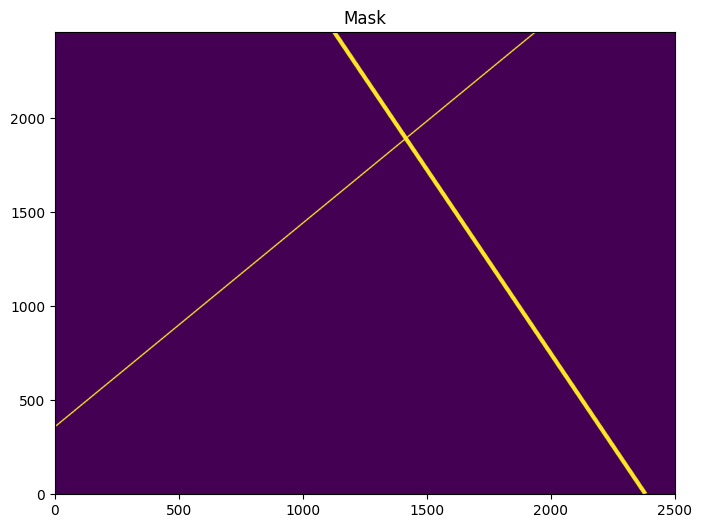

In [48]:
w2.plot_mask()

And there you go!

<a id="example6"></a>
## Example 6:  Create a new kernel for trail detection

We include a function called create_mrt_line_kernel that can be used to generate kernels for detecting trails of s specified size in the MRT. Note that kernels with widths of 1, 3, 7, and 15 pixels (convolved with a simple Gaussian HST/ACS psf model) are included already, but perhaps you want to generate a kernel with a new width, or convolved with a different PSF.

Let's generate a kernel for a trail that has an inherent width of 5 pixels and is convolved with a Gaussian PSF with `sigma=3`. 

INFO:utils_findsat_mrt:calculated endpoints: [(0, 511.5), (2047, 511.5)]


INFO:utils_findsat_mrt:Calculating median Radon Transform with 8 processes


INFO:utils_findsat_mrt:Inteprolating onto new grid to center kernel


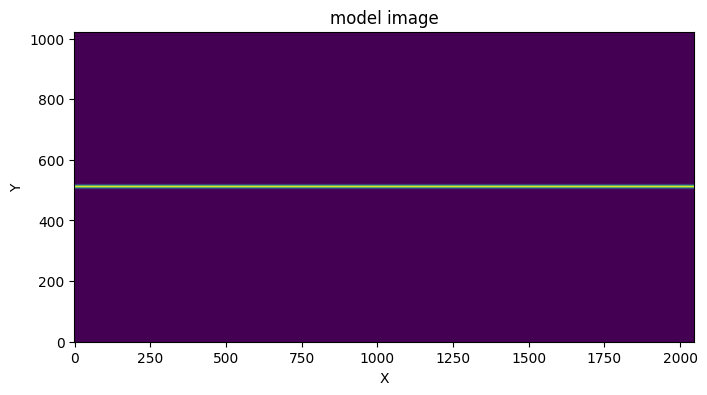

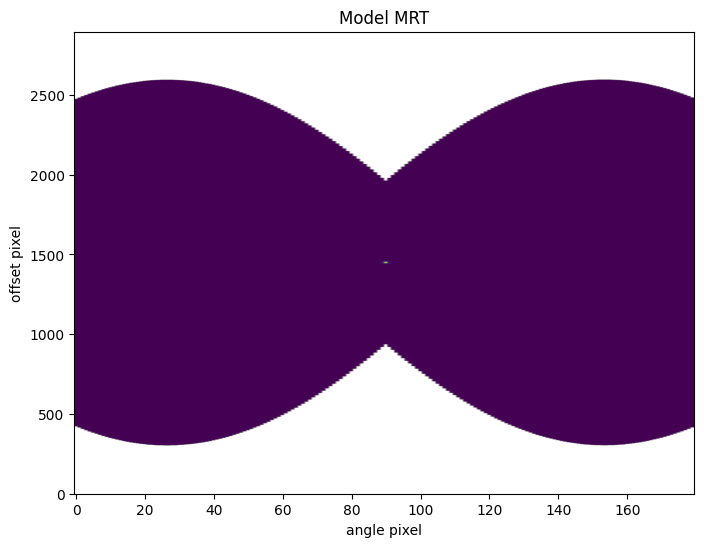

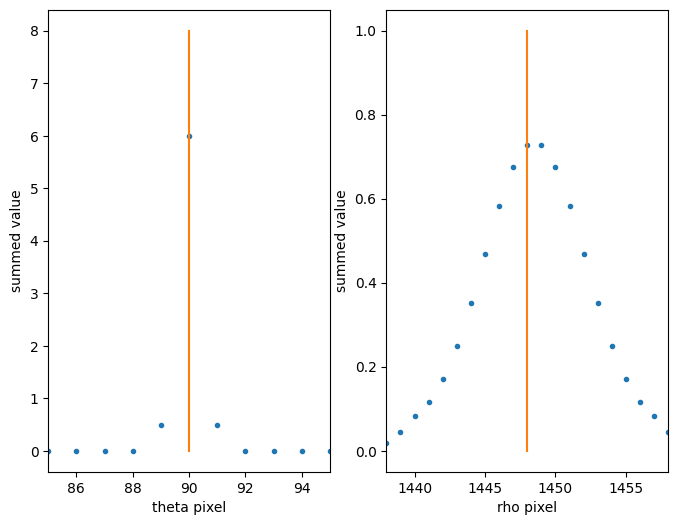

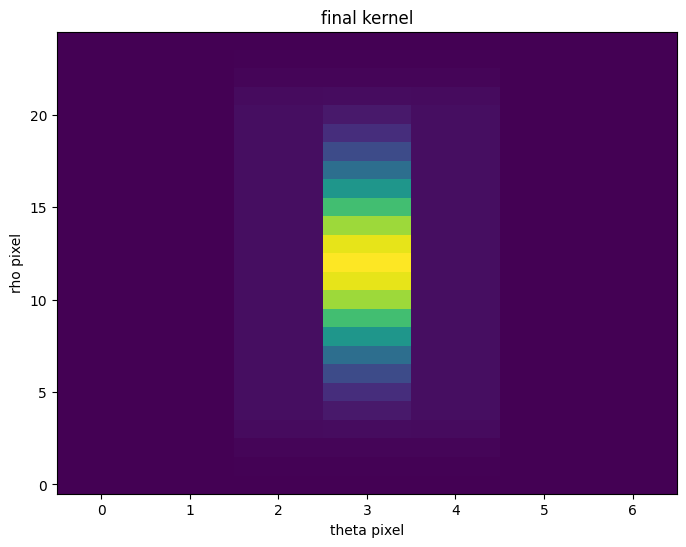

In [49]:
out = create_mrt_line_kernel(5, 3, processes=8, plot=True)

The first plot show the model streak. The second plot shows the resulting MRT. The kernsl is created by taking a cutout around the signal in the MRT. The third double-plot shows 1D slices of the signal in the MRT, with orange lines showing the location of the maximum values. These serve as first guesses of the center, after which the center is redetermined using a Guassian fit and the cutout extracted with the kernel perfectly centered. The 4th plot above shows the final kernel.

The kernel can be saved by defining the `outfile` keyword in `create_mrt_line_kernel`. By adding this file path into the `kernels` keyword in `TrailFinder` or `WfcWrapper`, it will be used for source detection when running `find_mrt_sources`.

### For more help:

More details may be found on the [ACS website](http://www.stsci.edu/hst/instrumentation/acs) and in the [ACS Instrument](https://hst-docs.stsci.edu/display/ACSIHB) and [Data Handbooks](http://www.stsci.edu/files/live/sites/www/files/home/hst/instrumentation/acs/documentation/other-documents/_documents/acs_dhb.pdf).

Please visit the [HST Help Desk](http://hsthelp.stsci.edu). Through the help desk portal, you can explore the *HST* Knowledge Base and request additional help from experts.

---
[Top of Page](#titleFindsat)
<img style="float: right;" src="https://raw.githubusercontent.com/spacetelescope/notebooks/master/assets/stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="Space Telescope Logo" width="200px"/> 
<br></br>
<br></br>